In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os
from os.path import join
import PIL.Image
import pickle
import time
import shutil

from IPython.display import Image
import tensorflow as tf
from tensorflow import convert_to_tensor, GradientTape
from tensorflow.math import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import Sequential, Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import load_model

from tensorflow.keras.applications.efficientnet import EfficientNetB7, preprocess_input
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, Huber

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

print(tf.__version__)
print(tf.keras.__version__)

2.8.2
2.8.0


In [ ]:
FOLDER = join(os.getcwd(), "data/annotated_regions")
FOLDER_0 = join(os.getcwd(), "data")
FOLDER_SMALL = join(os.getcwd(), "data/annotated_regions_small")
CSV_FILE = join(os.getcwd(),"data/train_annotations.csv")

GDRIVE_MOUNT = '/content/drive'
GDRIVE_FOLDER = "MyDrive/DataScientest/DS Project Datas"
FOLDER_MODELS = join(GDRIVE_MOUNT, GDRIVE_FOLDER, "Modeles")

def download_data(gdrive_folder):
    from google.colab import drive

    drive.mount(GDRIVE_MOUNT) 

    time.sleep(1)

    shutil.unpack_archive(join(GDRIVE_MOUNT, gdrive_folder,"annotated_regions_small.zip"), join("content",FOLDER_SMALL))
    shutil.copy(join(GDRIVE_MOUNT, gdrive_folder,"train_annotations.csv"), CSV_FILE)

download_data(GDRIVE_FOLDER)

Mounted at /content/drive


In [ ]:
def df_test_train_split(images_small = True, classes = 4):

    """Retourne un df_train et un df_test qui contient les URI vers les images
     et les classes associées

    Parameters:
      images_small : Si True, on utilise les images de taille réduite 
                     dans le dossier FOLDER_SMALL, sinon on garde les 
                     images pleine taille du dossier FOLDER
      classes : Choix de 4 ou 2 classes (1 vs 2-3-4)
                ou "regression" si on souhaite réaliser une regression plutot qu'une classification                       

    Returns:
      df_train, df_test                   
    """

    df = pd.read_csv(CSV_FILE)

    if images_small :
        folder = FOLDER_SMALL
    else:
        folder = FOLDER

    df["filename"] = folder + "/" + df.annotation_id + ".jpeg"

    if classes == 4:
        df['class'] = df['annotation_class'].astype('string')
    elif classes == 2:
        df["class"] = df.annotation_class.replace([1,2,3],1).astype('string')
    elif classes == "regression":
        df['class'] = df['annotation_class'].astype('float')

    df.drop(columns=["annotation_id","annotation_class"], inplace=True)

    df_train=df.sample(frac=0.85, random_state=21).copy()
    df_test=df.drop(df_train.index).copy()

    return df_train, df_test

###
# Création des générateurs d'images augmentées
# Reprend la fonction df_test_train_split précédente, et on fait passer : 
# - la fonction de préprocessing du CNN utilisé
# - les aumgentations souhaitées (soit un dict, soit une fonction)
###

def get_generators( images_small = True, classes = 4, preprocess_input = None, augmentation_input = None, rescale = 1):
    
    """Crée des générateurs d'image d'entrainement, de validation et de test
    Les données du générateur d'entrainement sont augmentées

    Parameters:
      images_small (bool) : Si True, on utilise les images de taille réduite dans le dossier FOLDER_SMALL, sinon on garde les images pleine taille du dossier FOLDER
      classes (4,2,"regression") : Choix de 4 ou 2 classes (1 vs 2-3-4) ou "regression" si on souhaite réaliser une regression plutot qu'une classification
      preprocess_input (func) : fonction de preprocessing (pour le cas du transfert learning)
      augmentation_input (dict or func) : dict contenant les paramètre à passer à ImageDataGenerator ou fonction d'augmentation de données (qui sera appliquée après preprocess_input)
      rescale (float) : ratio de rescale des données d'entrée (surtout pour les CNN custumisés)

    Returns:
      train_generator, validation_generator, test_generator                  
    """

     if augmentation_input is None:
            augmentation = {}
            preprocess = preprocess_input
    elif callable(augmentation_input):
        if preprocess_input is None:
            preprocess = augmentation_input
        else:
            preprocess = lambda x : augmentation_input(preprocess_input(x))
            augmentation = {}
    else:
        preprocess = preprocess_input
        augmentation = augmentation_input

    train_data_generator = ImageDataGenerator(preprocessing_function=preprocess,
                                            **augmentation,                                            
                                            fill_mode = "constant",
                                            cval=255,
                                            rescale=rescale,
                                            validation_split=0.175)

    val_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input,
                                          rescale=rescale,
                                          validation_split=0.175)
  
    test_data_generator = ImageDataGenerator(preprocessing_function=preprocess_input,
                                          rescale=rescale)
  
    df_train, df_test = df_test_train_split(images_small, classes )

    if classes == 2:
        class_mode = "binary"
    elif classes == 4:
        class_mode = "sparse"
    elif classes == "regression":
        class_mode = "raw"

    train_generator = train_data_generator.flow_from_dataframe(df_train, 
                                                            class_mode=class_mode,
                                                            subset="training",
                                                             batch_size=BATCH_SIZE                                                         
                                                            )

    validation_generator = val_data_generator.flow_from_dataframe(df_train, 
                                                            class_mode=class_mode,
                                                            subset="validation",
                                                             batch_size=BATCH_SIZE                                                            
                                                            )

    test_generator = test_data_generator.flow_from_dataframe(df_test,
                                                          class_mode=class_mode,
                                                          shuffle=False,
                                                      )
  
  return train_generator, validation_generator, test_generator


In [ ]:
BATCH_SIZE = 1

_,_,test_generator = get_generators( images_small = True, classes = 4, preprocess_input = None, augmentation_input = None, rescale = 1)

Found 4156 validated image filenames belonging to 4 classes.
Found 881 validated image filenames belonging to 4 classes.
Found 889 validated image filenames belonging to 4 classes.


In [ ]:
test_generator.next()[0][0].shape

(256, 256, 3)

In [ ]:
model = load_model(join(FOLDER_MODELS, 'EfficientNetB7v1-retrain-small-4-A2/EfficientNetB7v1-retrain-small-4-A2-model.h5'))

In [ ]:
model.summary()

In [ ]:
imgs, labels = test_generator.next()
print(np.argmax(model.predict(imgs), axis = 1))
print(labels)

[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 2 2 2 2 2 1 2 2 2 2]
[3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 1. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2.]


In [ ]:
y_true = test_generator.classes
predict = model.predict_generator(test_generator) # remove steps if calculate to whole dataset
y_pred = np.argmax(predict, axis = 1)

In [ ]:
last_conv_layer_name = "top_conv"

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        # modif spécifique eff net B7 : 
        # On remplace model.get_layer(last_conv_layer_name).output par 
        # model.layers[0].layers[-3].output
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tensorflow.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tensorflow.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))

Image : C19_B037_S21_6.jpeg | Classe prédite : 3 | Classe réelle : 3


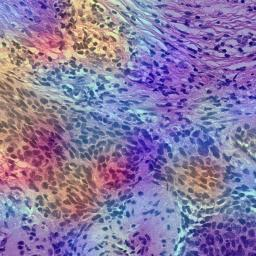

Image : C02_B001_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


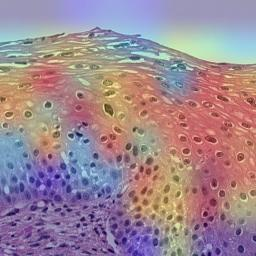

Image : C13_B024_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


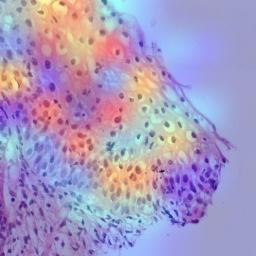

Image : C05_B012_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


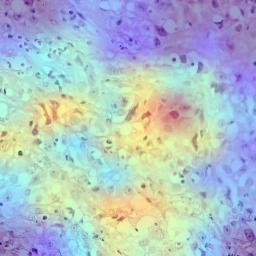

Image : C17_B021_S17_6.jpeg | Classe prédite : 3 | Classe réelle : 3


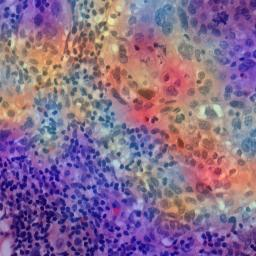

Image : C11_B033_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


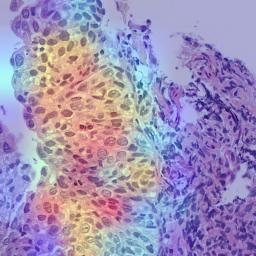

Image : C05_B072_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


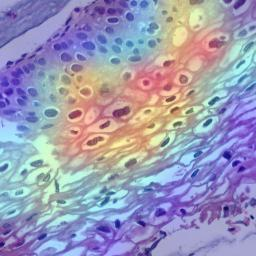

Image : C07_B103_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 1


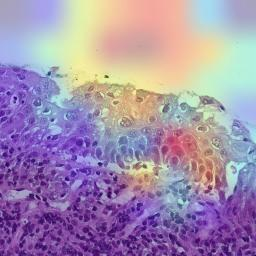

Image : C01_B205_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


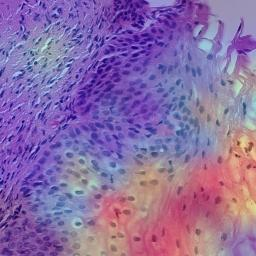

Image : C12_B194_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


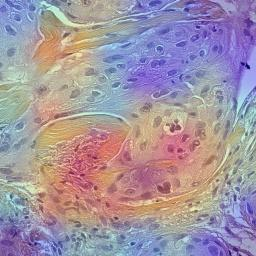

Image : C12_B394_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 1


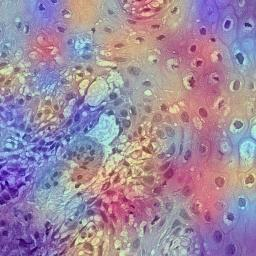

Image : C04_B027_S04_1.jpeg | Classe prédite : 0 | Classe réelle : 0


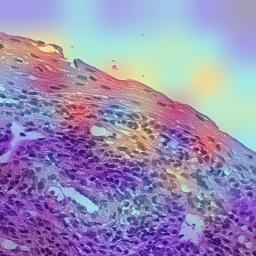

Image : C12_B562_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


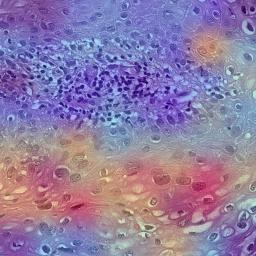

Image : C01_B110_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


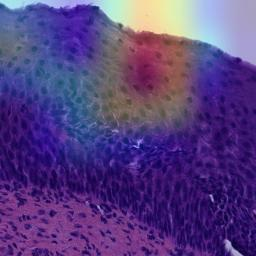

Image : C06_B045_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 0


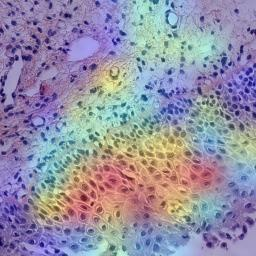

Image : C13_B241_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


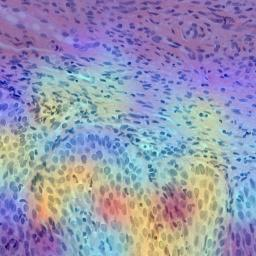

Image : C10_B003_S10_5.jpeg | Classe prédite : 0 | Classe réelle : 0


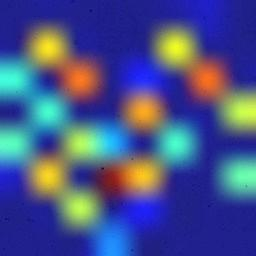

Image : C13_B231_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


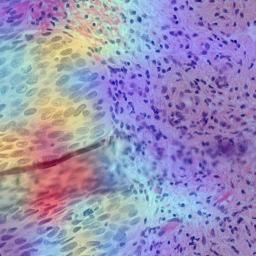

Image : C02_B221_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


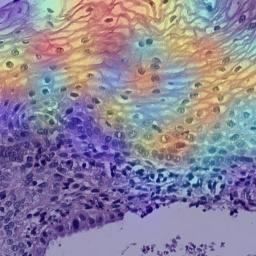

Image : C06_B027_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 2


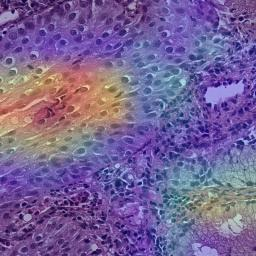

In [ ]:
data_visu = {'filename' : ['C19_B037_S21_6.jpeg', 'C02_B001_S21_3.jpeg', 'C13_B024_S11_3.jpeg', 'C05_B012_S11_0.jpeg', 'C17_B021_S17_6.jpeg', 
                           'C11_B033_S11_3.jpeg', 'C05_B072_S11_2.jpeg', 'C07_B103_S21_0.jpeg', 'C01_B205_S01_4.jpeg', 'C12_B194_S12_4.jpeg', 
                           'C12_B394_S12_4.jpeg', 'C04_B027_S04_1.jpeg', 'C12_B562_S12_1.jpeg', 'C01_B110_S01_1.jpeg', 'C06_B045_S21_1.jpeg',
                           'C13_B241_S11_1.jpeg', 'C10_B003_S10_5.jpeg', 'C13_B231_S11_2.jpeg', 'C02_B221_S21_3.jpeg', 'C06_B027_S21_1.jpeg'],
             'class' : [3, 1, 0, 3, 3, 2, 1, 1, 0, 3, 1, 0, 1, 0, 0, 2, 0, 2, 0, 2]}

visu = pd.DataFrame(data_visu)
visu['filename']=FOLDER_SMALL+"/"+visu['filename']

for file in visu['filename'].values:
    img_array = preprocess_input(get_img_array(file, size=(256, 256)))
    model.layers[-1].activation = None
    preds = model.predict(img_array)
    print(f"Image : {file.split('/')[-1]} | Classe prédite : {np.argmax(preds[0])} | Classe réelle : {visu[visu['filename']==file]['class'].values[0]}")
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    save_and_display_gradcam(file, heatmap, cam_path=join(FOLDER_MODELS,'Gradcam/gradcam_'+file.split('/')[-1]))

GradCam sur les erreurs de prédiction >= 2

123/ Image : C10_B046_S10_1.jpeg | Classe prédite : 0 | Classe réelle : 2


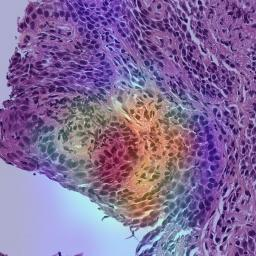

141/ Image : C12_B528_S12_4.jpeg | Classe prédite : 0 | Classe réelle : 2


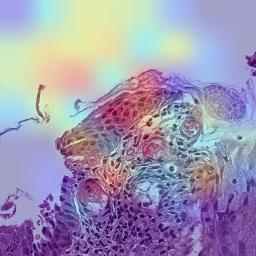

153/ Image : C12_B509_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 0


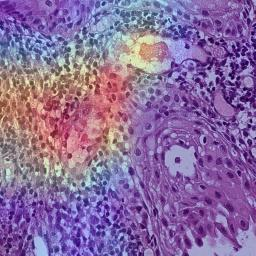

200/ Image : C17_B026_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 2


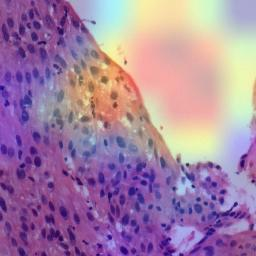

241/ Image : C05_B041_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 0


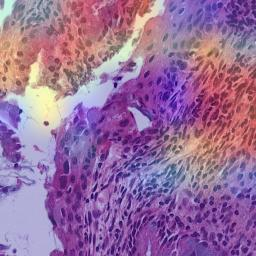

293/ Image : C07_B007_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 0


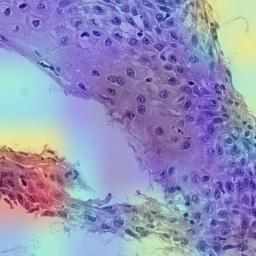

317/ Image : C06_B027_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 2


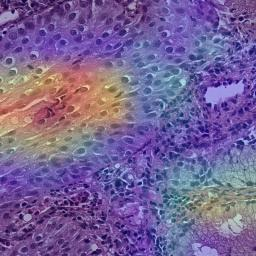

416/ Image : C06_B054_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 0


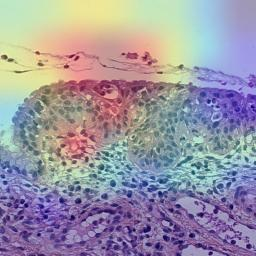

640/ Image : C12_B395_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 1


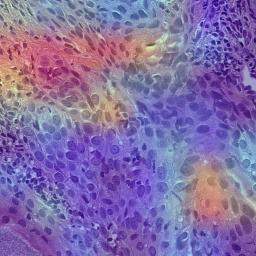

645/ Image : C17_B100_S17_3.jpeg | Classe prédite : 3 | Classe réelle : 0


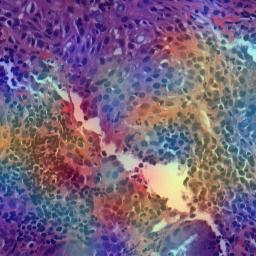

725/ Image : C11_B038_S11_6.jpeg | Classe prédite : 1 | Classe réelle : 3


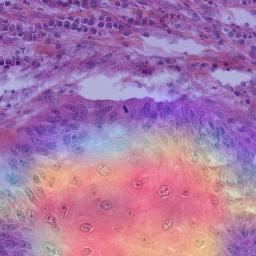

765/ Image : C10_B003_S10_2.jpeg | Classe prédite : 3 | Classe réelle : 0


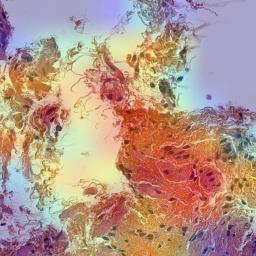

799/ Image : C13_B031_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 0


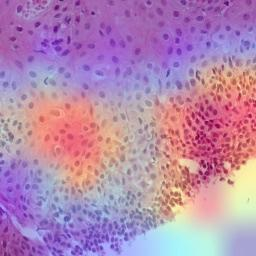

842/ Image : C13_B354_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 0


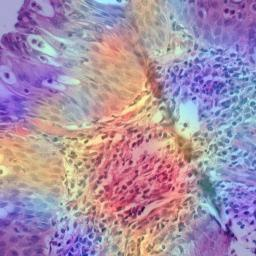

881/ Image : C01_B110_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 0


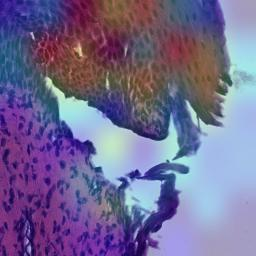

In [ ]:
for i, (filename, y_true_tmp, y_pred_tmp) in enumerate(list(zip(test_generator.filenames, test_generator.classes, y_pred))):
  if abs(y_true_tmp - y_pred_tmp) > 1:
    img_array = preprocess_input(get_img_array(filename, size=(256, 256)))
    model.layers[-1].activation = None
    preds = model.predict(img_array)
    print(f"{i}/ Image : {filename.split('/')[-1]} | Classe prédite : {y_pred_tmp} | Classe réelle : {y_true_tmp}")
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    save_and_display_gradcam(filename, heatmap, cam_path=join(FOLDER_MODELS,'Gradcam/gradcam_'+filename.split('/')[-1]))

**GradCam sur tout...**




Image : C06_B108_S21_0.jpeg | Classe prédite : 3 | Classe réelle : 3


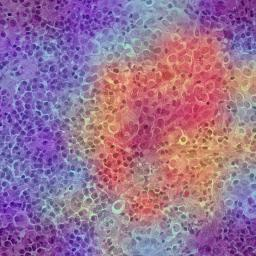

Image : C13_B156_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


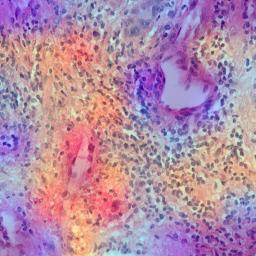

Image : C13_B156_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


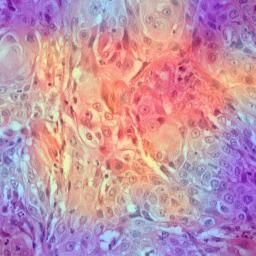

Image : C13_B145_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


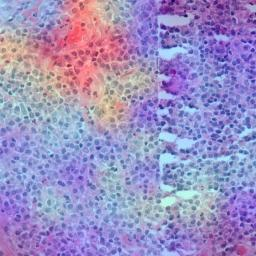

Image : C13_B141_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 3


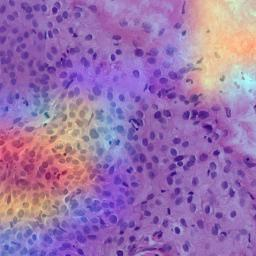

Image : C06_B116_S21_2.jpeg | Classe prédite : 2 | Classe réelle : 2


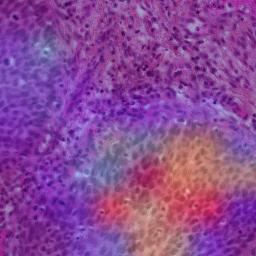

Image : C12_B130_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


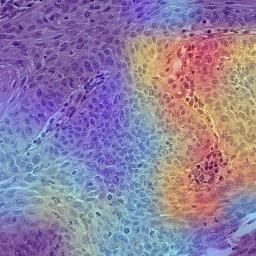

Image : C12_B130_S12_1.jpeg | Classe prédite : 2 | Classe réelle : 3


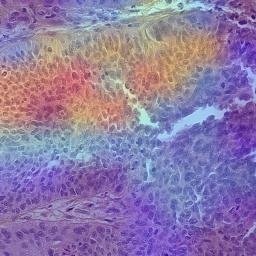

Image : C12_B130_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


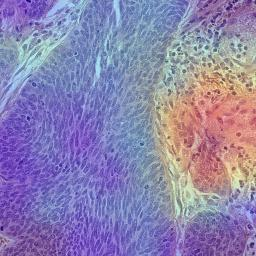

Image : C01_B239_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 2


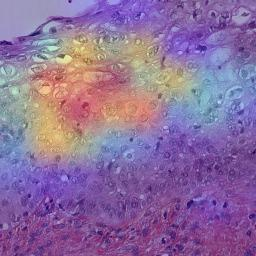

Image : C01_B239_S01_2.jpeg | Classe prédite : 3 | Classe réelle : 3


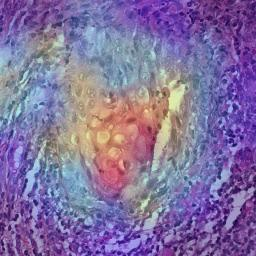

Image : C01_B203_S01_2.jpeg | Classe prédite : 3 | Classe réelle : 3


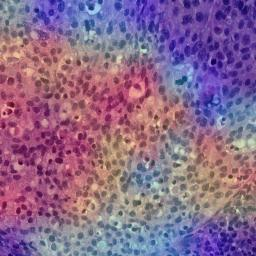

Image : C01_B295_S01_0.jpeg | Classe prédite : 3 | Classe réelle : 3


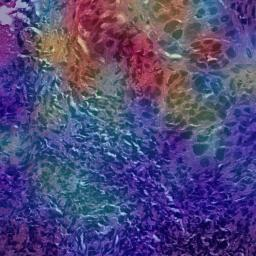

Image : C01_B295_S01_2.jpeg | Classe prédite : 3 | Classe réelle : 3


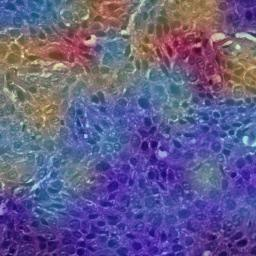

Image : C07_B052_S21_6.jpeg | Classe prédite : 3 | Classe réelle : 3


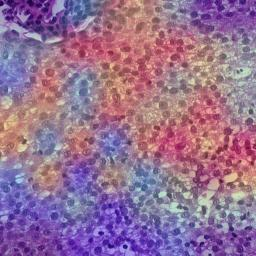

Image : C13_B160_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


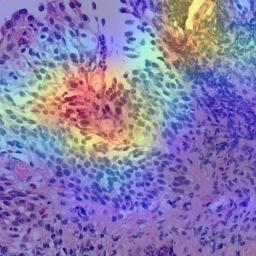

Image : C13_B160_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


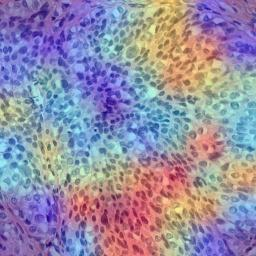

Image : C13_B159_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


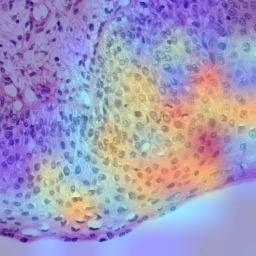

Image : C13_B157_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


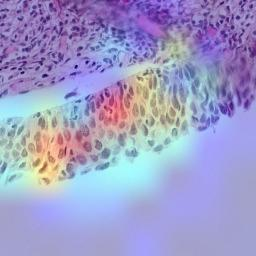

Image : C13_B149_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


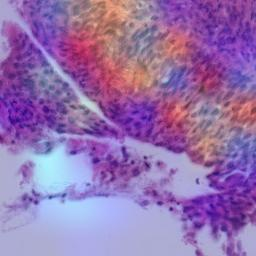

Image : C06_B112_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


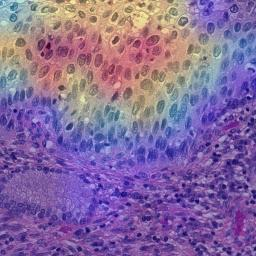

Image : C12_B141_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 2


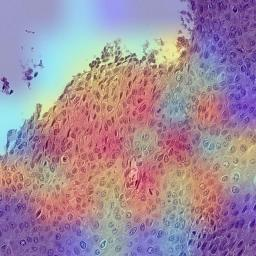

Image : C12_B141_S12_1.jpeg | Classe prédite : 2 | Classe réelle : 2


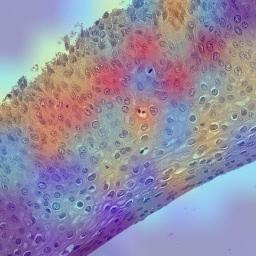

Image : C12_B139_S12_4.jpeg | Classe prédite : 2 | Classe réelle : 2


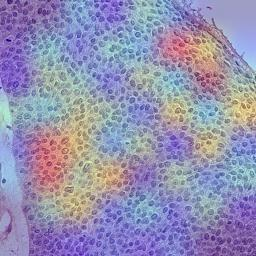

Image : C01_B253_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 2


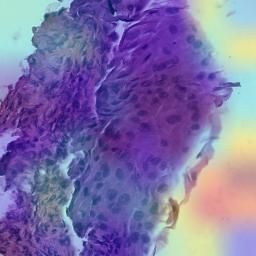

Image : C07_B011_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 2


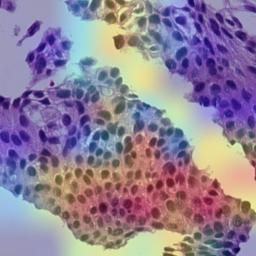

Image : C07_B011_S21_2.jpeg | Classe prédite : 2 | Classe réelle : 2


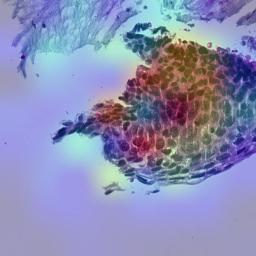

Image : C13_B158_S11_5.jpeg | Classe prédite : 1 | Classe réelle : 1


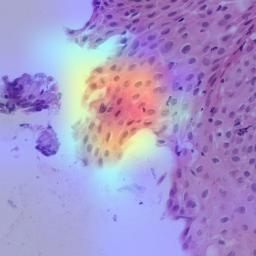

Image : C13_B154_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 1


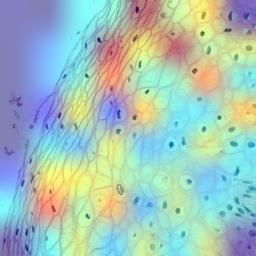

Image : C13_B146_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


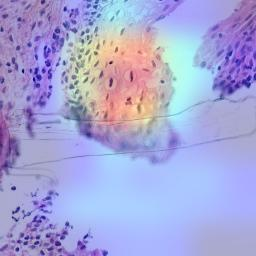

Image : C13_B142_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


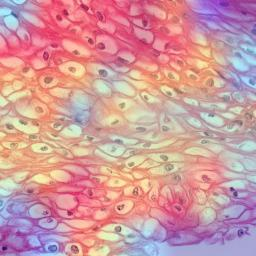

Image : C13_B140_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


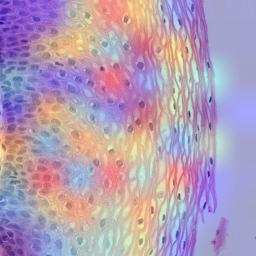

Image : C13_B140_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


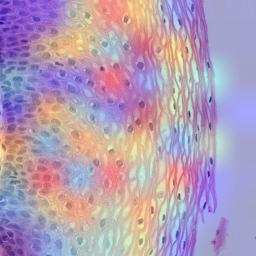

Image : C13_B138_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


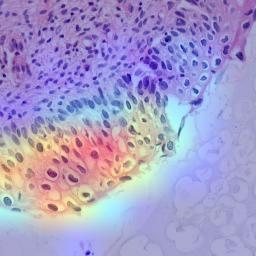

Image : C02_B003_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


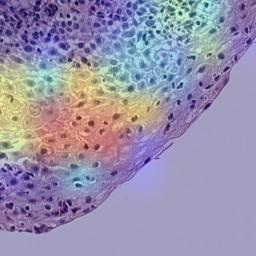

Image : C02_B002_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


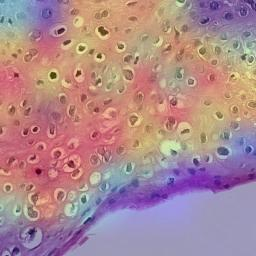

Image : C02_B001_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


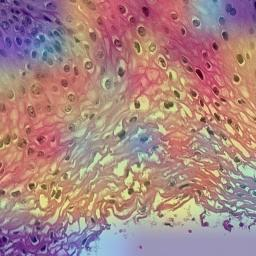

Image : C02_B001_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


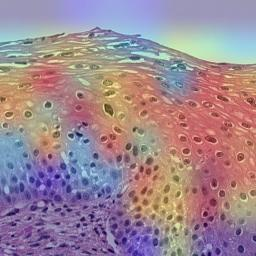

Image : C02_B001_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


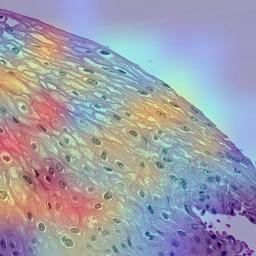

Image : C06_B117_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


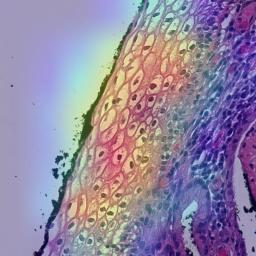

Image : C06_B113_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


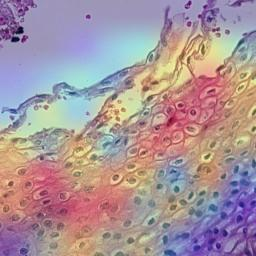

Image : C12_B128_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


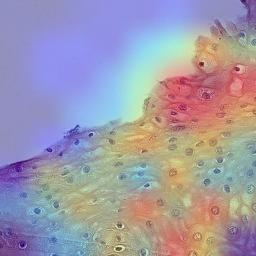

Image : C12_B128_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 1


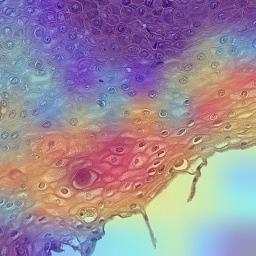

Image : C01_B345_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


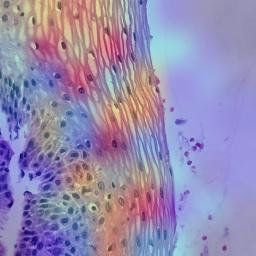

Image : C01_B345_S01_2.jpeg | Classe prédite : 0 | Classe réelle : 1


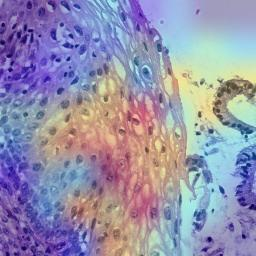

Image : C07_B089_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


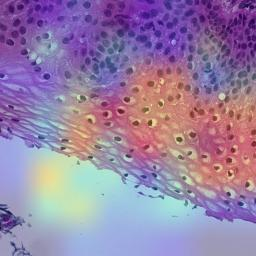

Image : C07_B094_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 1


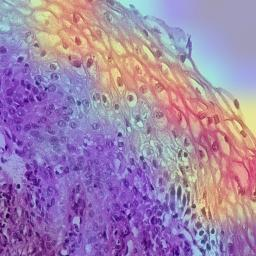

Image : C07_B074_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


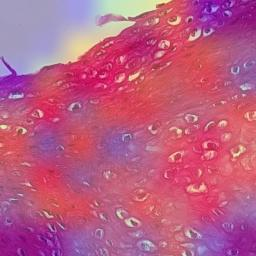

Image : C02_B008_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 0


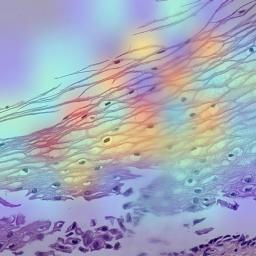

Image : C02_B008_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


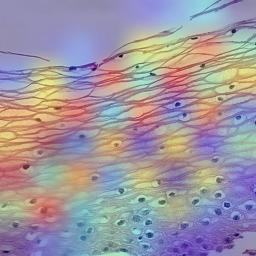

Image : C06_B109_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


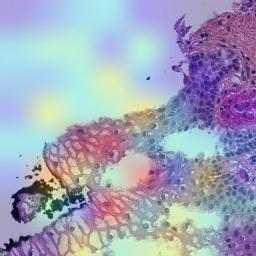

Image : C06_B106_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


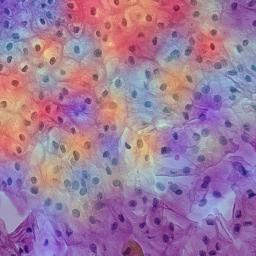

Image : C06_B106_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


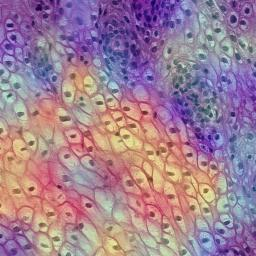

Image : C01_B321_S01_5.jpeg | Classe prédite : 0 | Classe réelle : 0


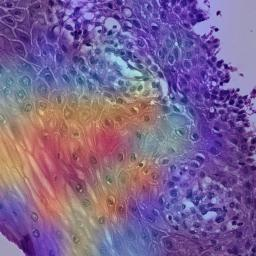

Image : C01_B293_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


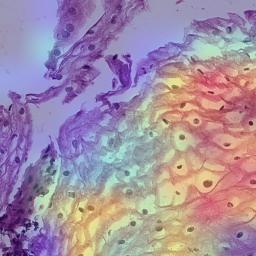

Image : C01_B304_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


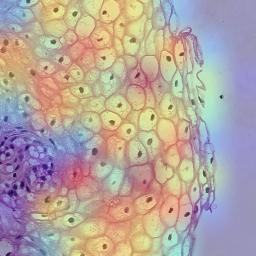

Image : C01_B309_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


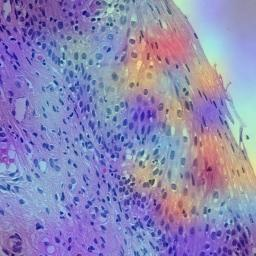

Image : C07_B111_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


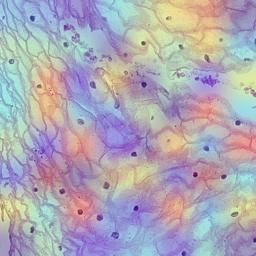

Image : C07_B032_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


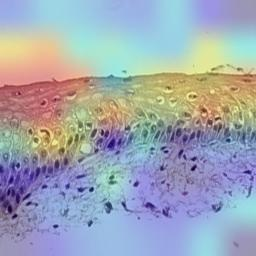

Image : C07_B032_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


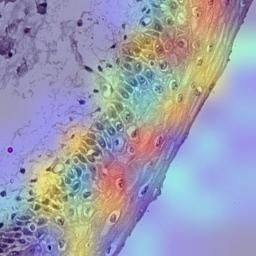

Image : C07_B032_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


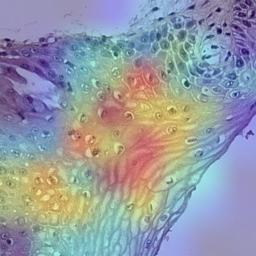

Image : C06_B111_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


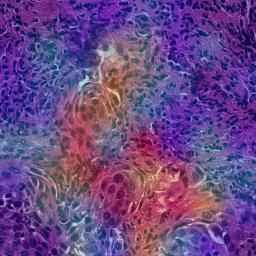

Image : C07_B024_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 0


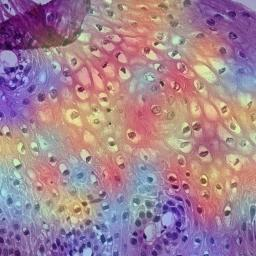

Image : C01_B311_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


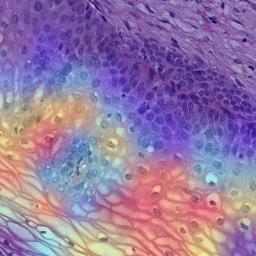

Image : C02_B060_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


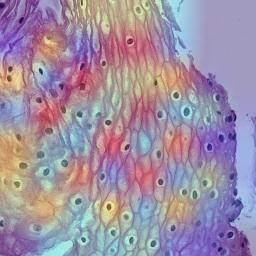

Image : C02_B051_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


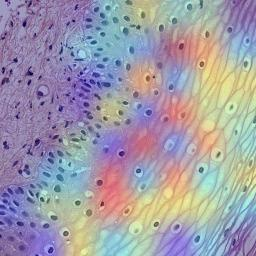

Image : C02_B051_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


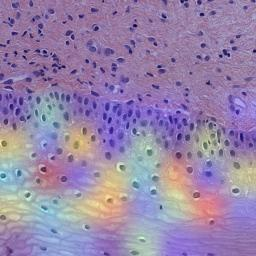

Image : C02_B074_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


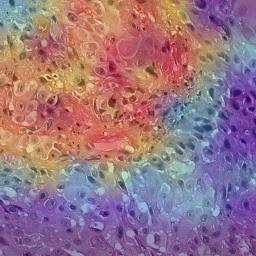

Image : C16_B018_S21_4.jpeg | Classe prédite : 3 | Classe réelle : 3


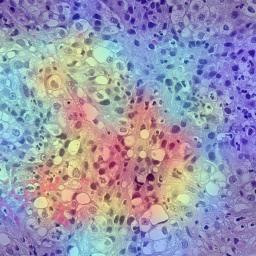

Image : C16_B017_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


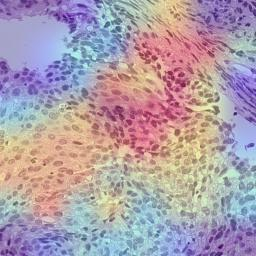

Image : C16_B016_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


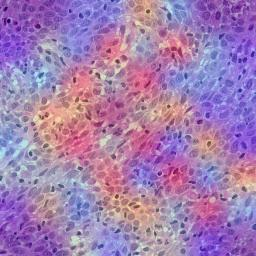

Image : C16_B004_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


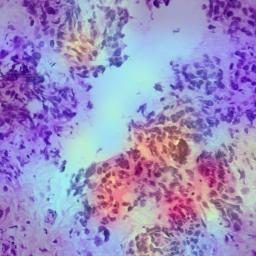

Image : C16_B002_S21_0.jpeg | Classe prédite : 3 | Classe réelle : 3


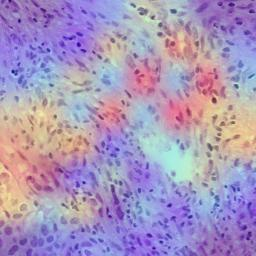

Image : C16_B003_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 2


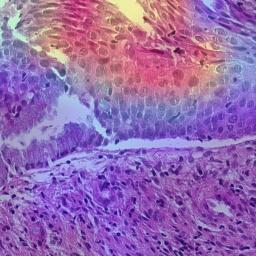

Image : C16_B005_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


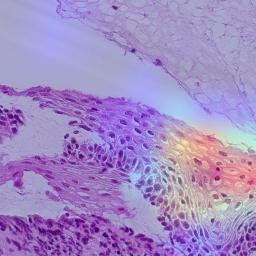

Image : C16_B005_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


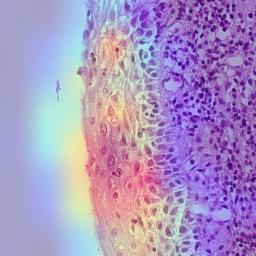

Image : C16_B006_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


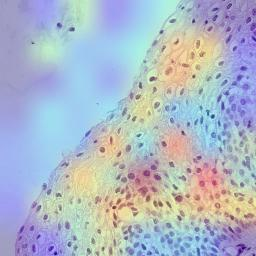

Image : C13_B095_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


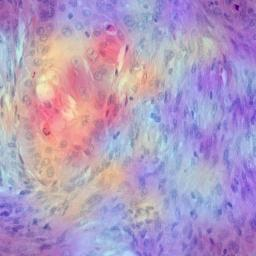

Image : C13_B095_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


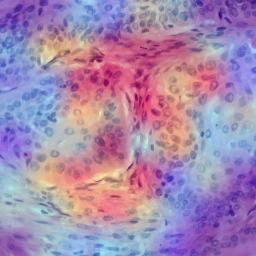

Image : C13_B093_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


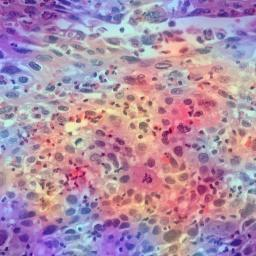

Image : C02_B073_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


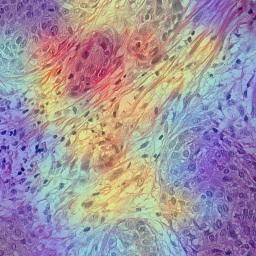

Image : C02_B063_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


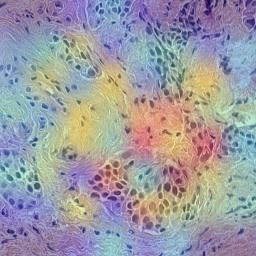

Image : C01_B363_S01_1.jpeg | Classe prédite : 3 | Classe réelle : 3


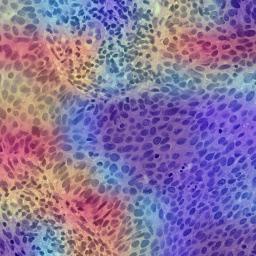

Image : C07_B050_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


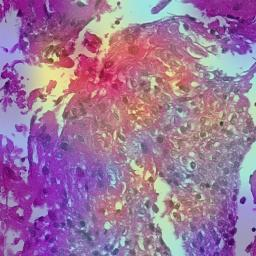

Image : C07_B054_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 3


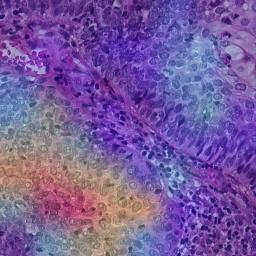

Image : C13_B100_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 0


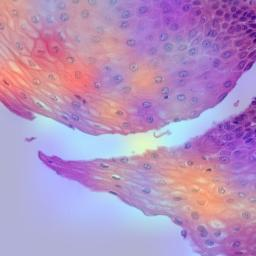

Image : C13_B099_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


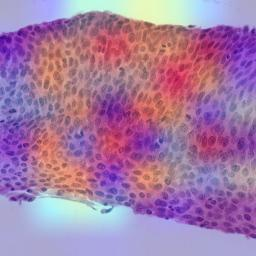

Image : C13_B094_S11_5.jpeg | Classe prédite : 2 | Classe réelle : 2


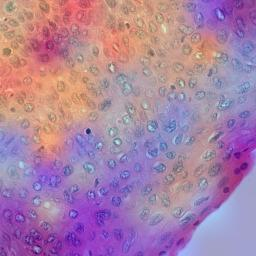

Image : C02_B062_S21_1.jpeg | Classe prédite : 2 | Classe réelle : 2


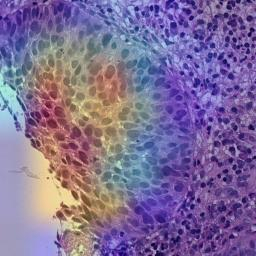

Image : C01_B291_S01_1.jpeg | Classe prédite : 2 | Classe réelle : 2


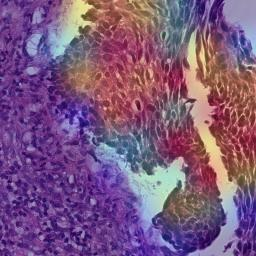

Image : C01_B291_S01_2.jpeg | Classe prédite : 2 | Classe réelle : 2


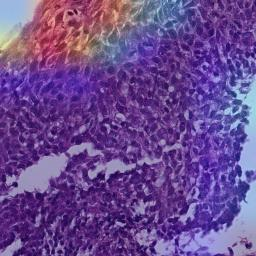

Image : C07_B019_S21_4.jpeg | Classe prédite : 2 | Classe réelle : 2


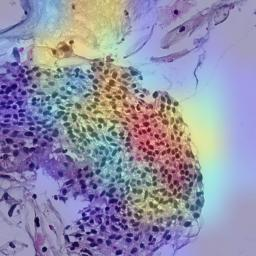

Image : C13_B101_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 1


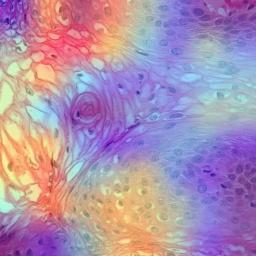

Image : C13_B096_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


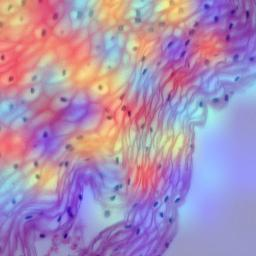

Image : C02_B054_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 0


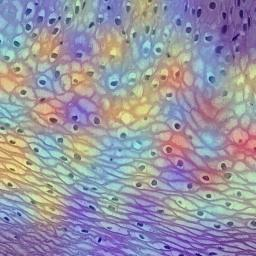

Image : C02_B054_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


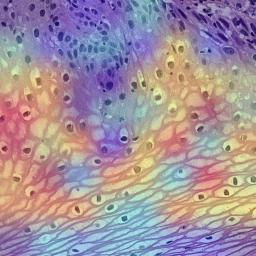

Image : C02_B052_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


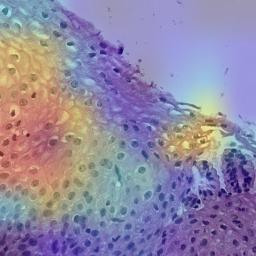

Image : C01_B311_S01_4.jpeg | Classe prédite : 1 | Classe réelle : 1


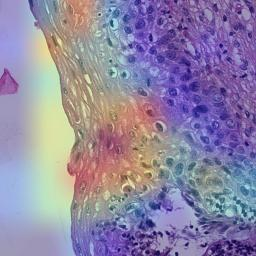

Image : C01_B231_S01_1.jpeg | Classe prédite : 1 | Classe réelle : 1


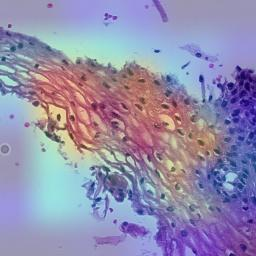

Image : C07_B022_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


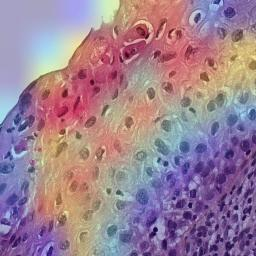

Image : C07_B022_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


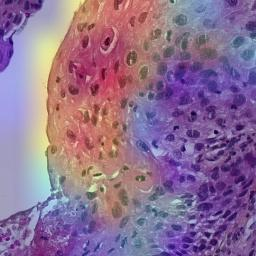

Image : C07_B103_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 1


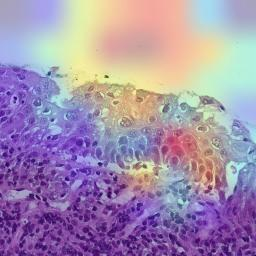

Image : C07_B103_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 1


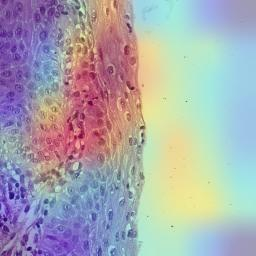

Image : C13_B090_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


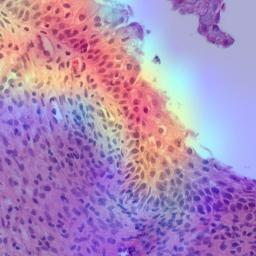

Image : C04_B043_S04_1.jpeg | Classe prédite : 0 | Classe réelle : 0


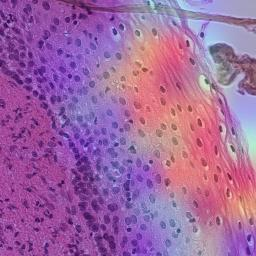

Image : C04_B042_S04_1.jpeg | Classe prédite : 0 | Classe réelle : 0


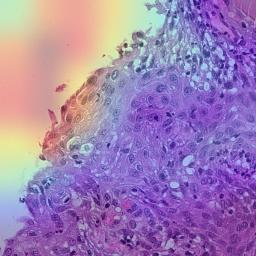

Image : C02_B051_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


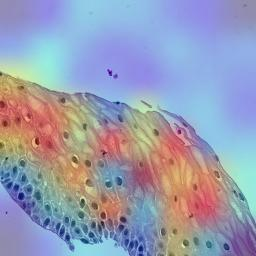

Image : C01_B247_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


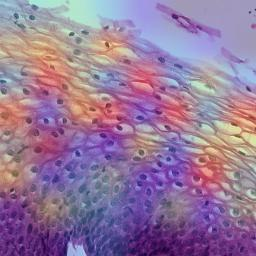

Image : C01_B162_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


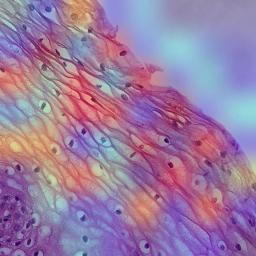

Image : C07_B114_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


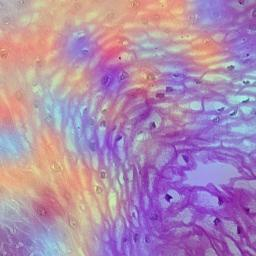

Image : C07_B114_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 0


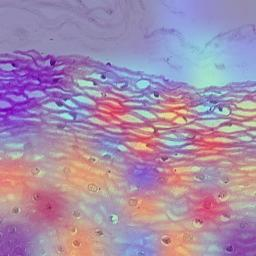

Image : C17_B115_S17_1.jpeg | Classe prédite : 1 | Classe réelle : 1


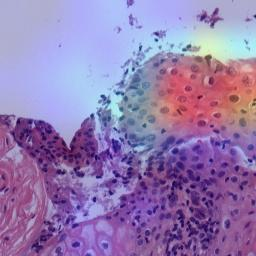

Image : C17_B120_S17_3.jpeg | Classe prédite : 1 | Classe réelle : 1


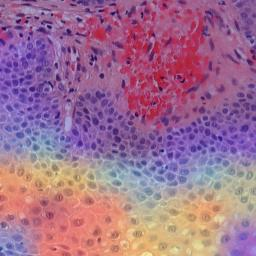

Image : C08_B030_S08_0.jpeg | Classe prédite : 3 | Classe réelle : 3


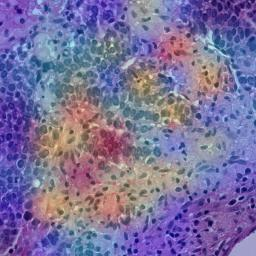

Image : C08_B031_S08_2.jpeg | Classe prédite : 3 | Classe réelle : 3


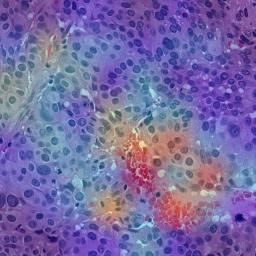

Image : C08_B002_S08_3.jpeg | Classe prédite : 0 | Classe réelle : 1


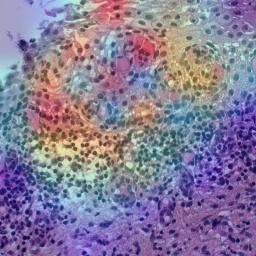

Image : C10_B040_S10_1.jpeg | Classe prédite : 2 | Classe réelle : 2


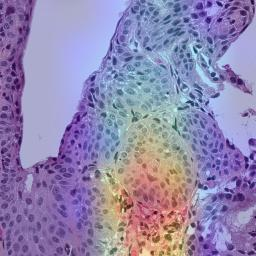

Image : C10_B040_S10_5.jpeg | Classe prédite : 2 | Classe réelle : 2


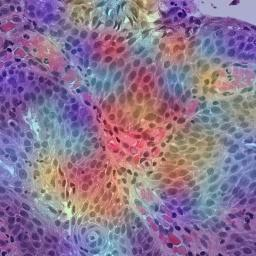

Image : C08_B004_S08_2.jpeg | Classe prédite : 2 | Classe réelle : 2


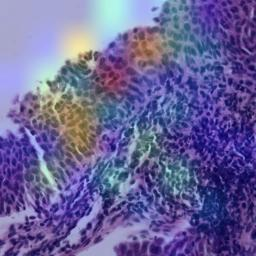

Image : C08_B005_S08_0.jpeg | Classe prédite : 2 | Classe réelle : 2


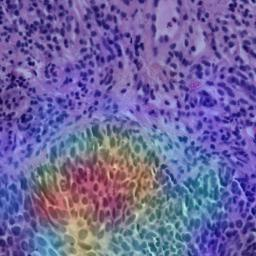

Image : C10_B045_S10_0.jpeg | Classe prédite : 3 | Classe réelle : 3


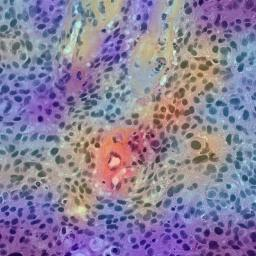

Image : C10_B045_S10_1.jpeg | Classe prédite : 3 | Classe réelle : 3


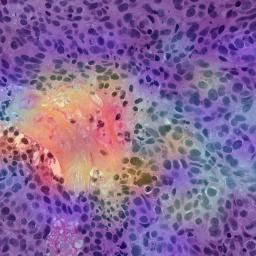

Image : C10_B045_S10_4.jpeg | Classe prédite : 3 | Classe réelle : 3


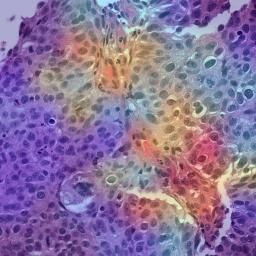

Image : C10_B046_S10_1.jpeg | Classe prédite : 0 | Classe réelle : 2


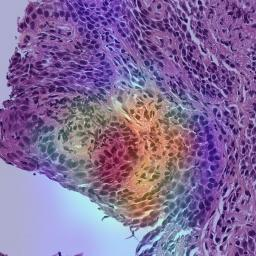

Image : C10_B046_S10_2.jpeg | Classe prédite : 2 | Classe réelle : 3


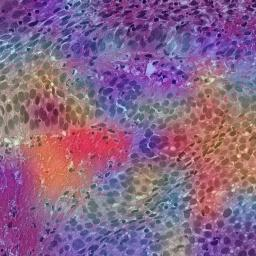

Image : C10_B046_S10_3.jpeg | Classe prédite : 3 | Classe réelle : 3


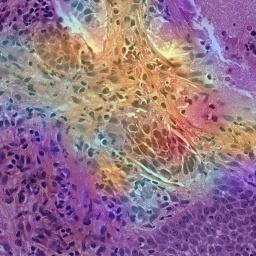

Image : C10_B047_S10_3.jpeg | Classe prédite : 3 | Classe réelle : 3


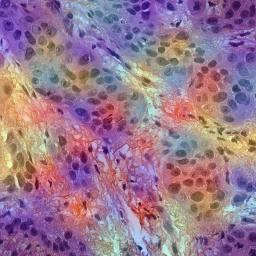

Image : C17_B112_S17_2.jpeg | Classe prédite : 1 | Classe réelle : 0


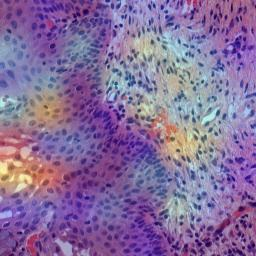

Image : C08_B014_S08_0.jpeg | Classe prédite : 1 | Classe réelle : 1


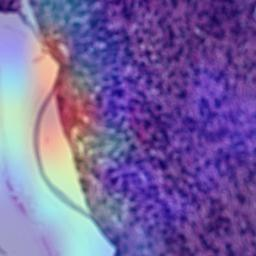

Image : C12_B513_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


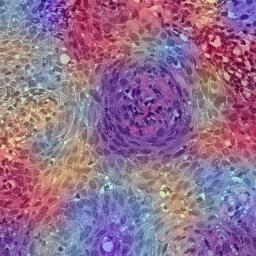

Image : C12_B514_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


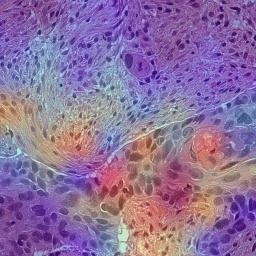

Image : C12_B514_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


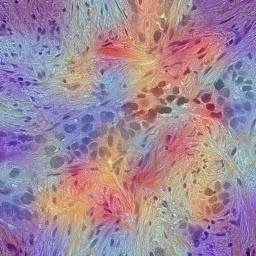

Image : C12_B516_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


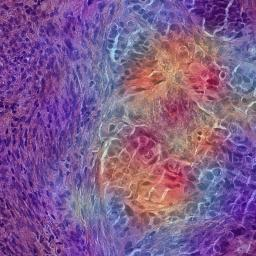

Image : C12_B525_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


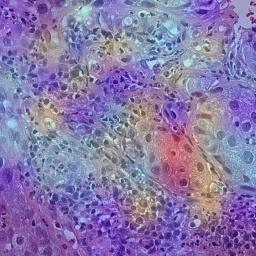

Image : C12_B525_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


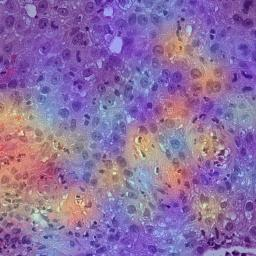

Image : C12_B530_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


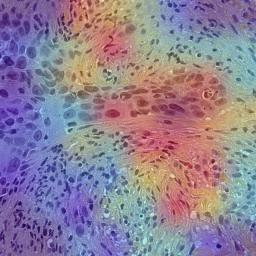

Image : C10_B039_S10_0.jpeg | Classe prédite : 0 | Classe réelle : 0


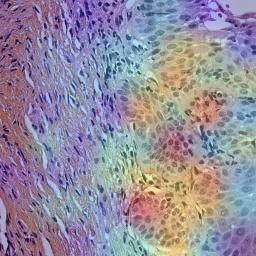

Image : C08_B001_S08_1.jpeg | Classe prédite : 0 | Classe réelle : 1


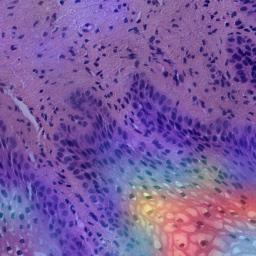

Image : C10_B042_S10_0.jpeg | Classe prédite : 0 | Classe réelle : 0


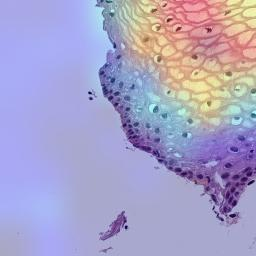

Image : C12_B527_S12_0.jpeg | Classe prédite : 0 | Classe réelle : 1


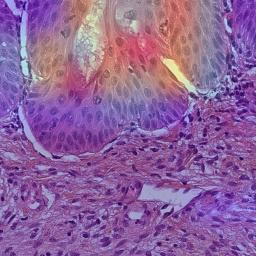

Image : C02_B300_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


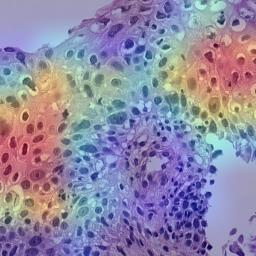

Image : C12_B528_S12_4.jpeg | Classe prédite : 0 | Classe réelle : 2


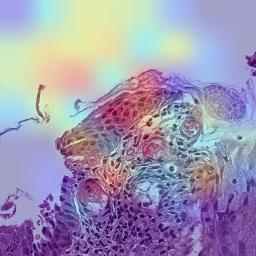

Image : C02_B296_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 2


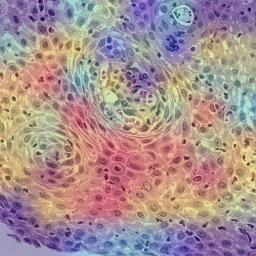

Image : C02_B296_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 2


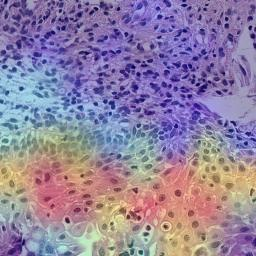

Image : C12_B524_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 1


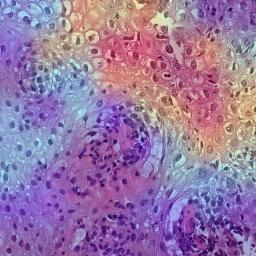

Image : C12_B517_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


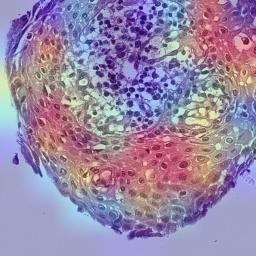

Image : C12_B511_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


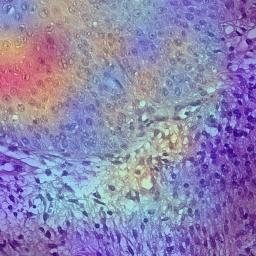

Image : C12_B526_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 0


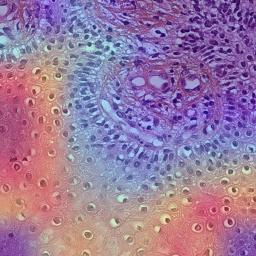

Image : C12_B526_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 0


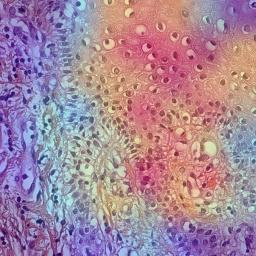

Image : C12_B521_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 0


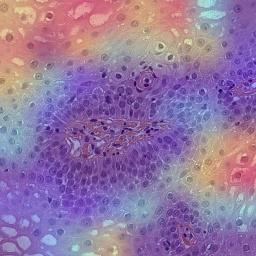

Image : C12_B518_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


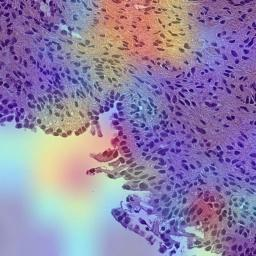

Image : C12_B510_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


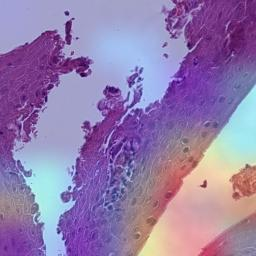

Image : C12_B509_S12_1.jpeg | Classe prédite : 0 | Classe réelle : 0


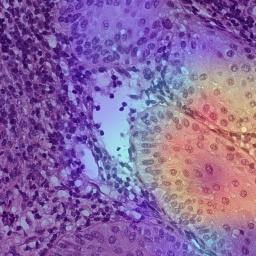

Image : C12_B509_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 0


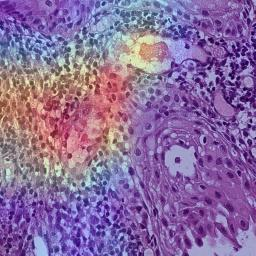

Image : C05_B012_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


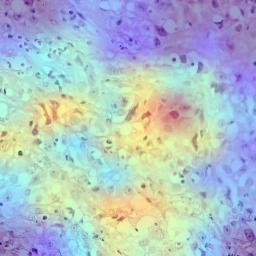

Image : C05_B012_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


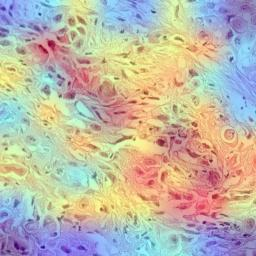

Image : C05_B011_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


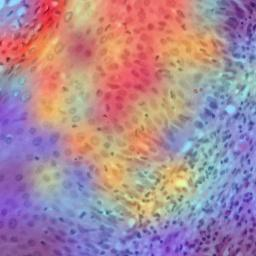

Image : C05_B011_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


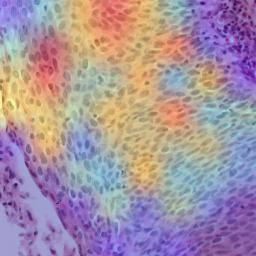

Image : C17_B027_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 0


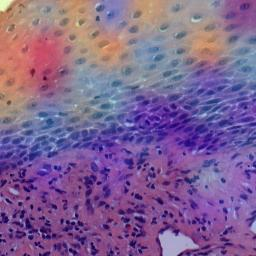

Image : C19_B037_S21_0.jpeg | Classe prédite : 3 | Classe réelle : 3


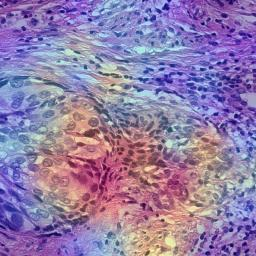

Image : C19_B021_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


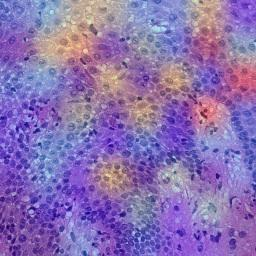

Image : C13_B317_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


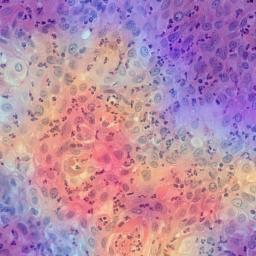

Image : C07_B067_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


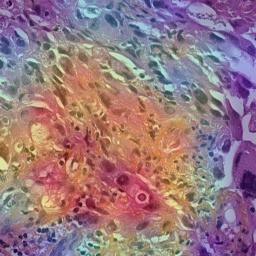

Image : C07_B067_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


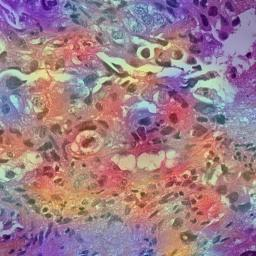

Image : C19_B028_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


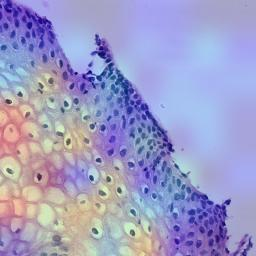

Image : C19_B012_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


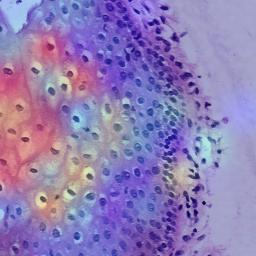

Image : C13_B299_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 1


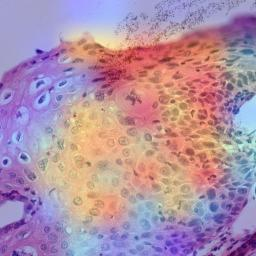

Image : C14_B040_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


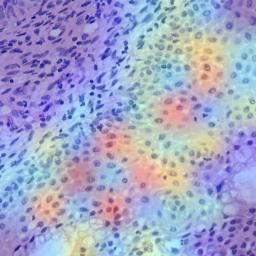

Image : C14_B040_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


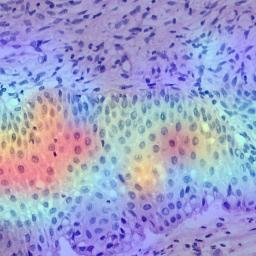

Image : C14_B040_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


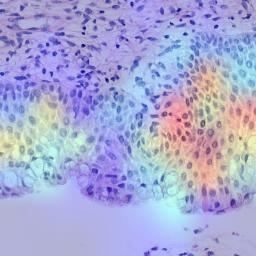

Image : C14_B037_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


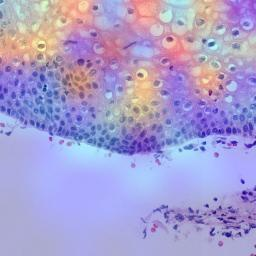

Image : C14_B037_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


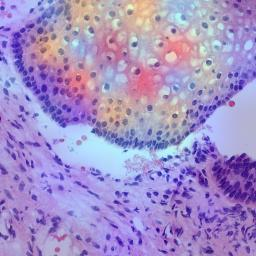

Image : C14_B033_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


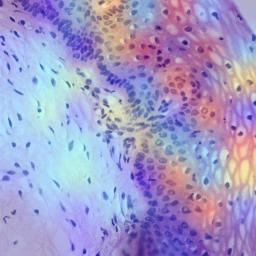

Image : C14_B030_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


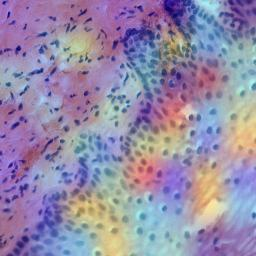

Image : C14_B030_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


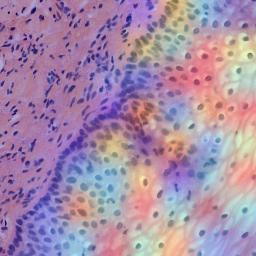

Image : C14_B030_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


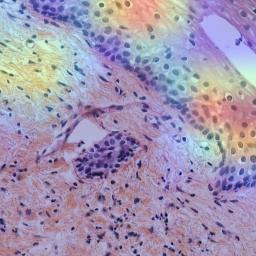

Image : C17_B023_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 0


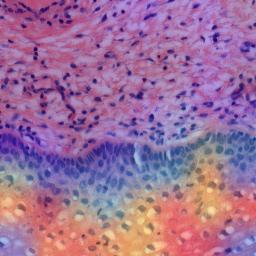

Image : C17_B023_S17_3.jpeg | Classe prédite : 0 | Classe réelle : 0


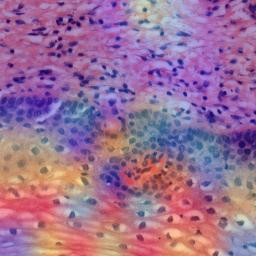

Image : C14_B029_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


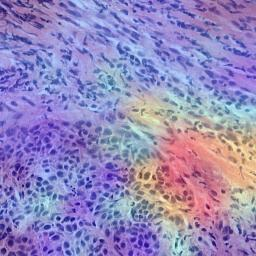

Image : C05_B011_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


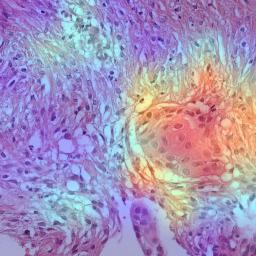

Image : C05_B011_S11_6.jpeg | Classe prédite : 3 | Classe réelle : 3


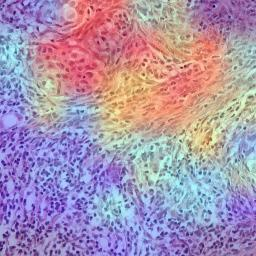

Image : C17_B030_S17_3.jpeg | Classe prédite : 3 | Classe réelle : 3


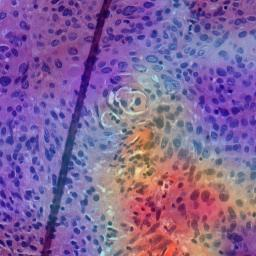

Image : C17_B030_S17_4.jpeg | Classe prédite : 3 | Classe réelle : 3


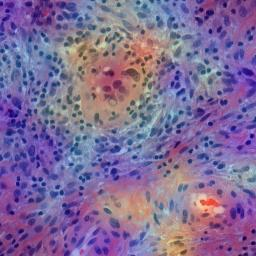

Image : C17_B021_S17_4.jpeg | Classe prédite : 3 | Classe réelle : 3


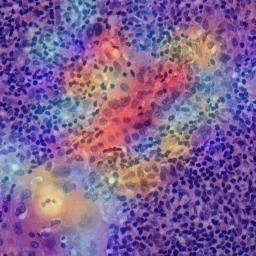

Image : C17_B021_S17_6.jpeg | Classe prédite : 3 | Classe réelle : 3


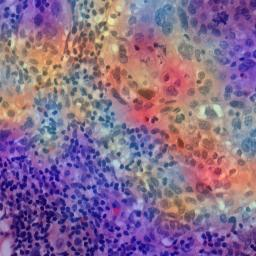

Image : C19_B037_S21_6.jpeg | Classe prédite : 3 | Classe réelle : 3


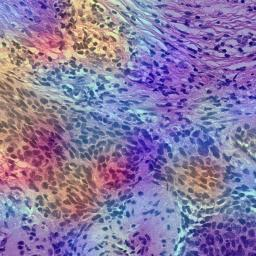

Image : C19_B037_S21_7.jpeg | Classe prédite : 3 | Classe réelle : 3


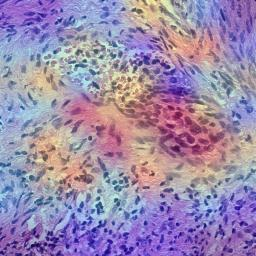

Image : C19_B036_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 3


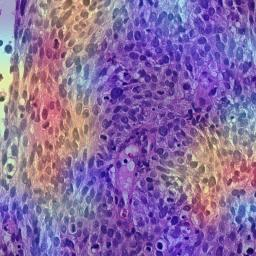

Image : C19_B036_S21_4.jpeg | Classe prédite : 3 | Classe réelle : 3


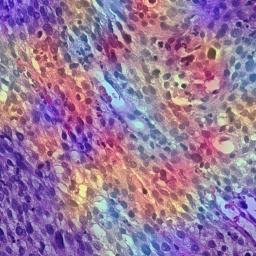

Image : C19_B022_S21_5.jpeg | Classe prédite : 3 | Classe réelle : 3


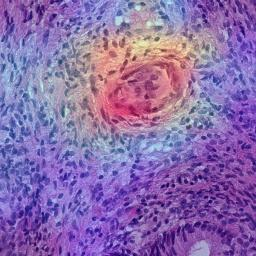

Image : C19_B021_S21_6.jpeg | Classe prédite : 3 | Classe réelle : 3


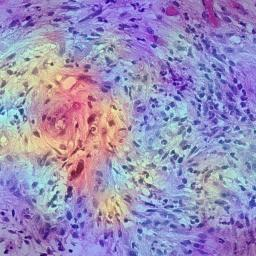

Image : C19_B020_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


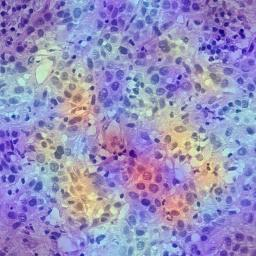

Image : C13_B324_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


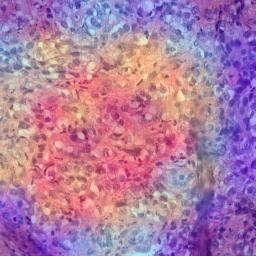

Image : C13_B317_S11_7.jpeg | Classe prédite : 3 | Classe réelle : 3


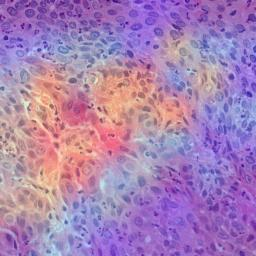

Image : C13_B317_S11_8.jpeg | Classe prédite : 3 | Classe réelle : 3


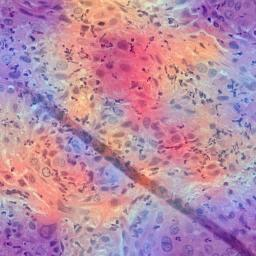

Image : C07_B067_S21_5.jpeg | Classe prédite : 3 | Classe réelle : 3


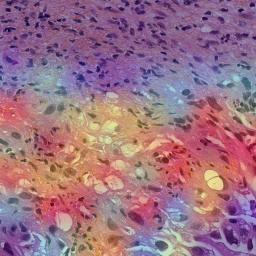

Image : C07_B067_S21_7.jpeg | Classe prédite : 3 | Classe réelle : 3


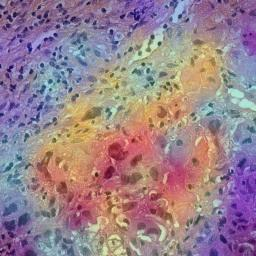

Image : C07_B067_S21_9.jpeg | Classe prédite : 3 | Classe réelle : 3


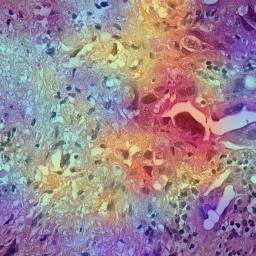

Image : C14_B024_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


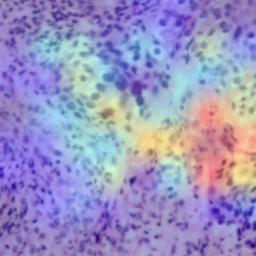

Image : C14_B024_S11_5.jpeg | Classe prédite : 2 | Classe réelle : 2


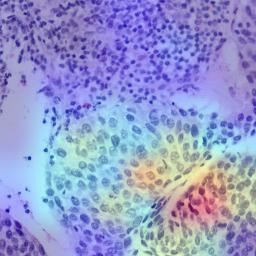

Image : C17_B026_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 2


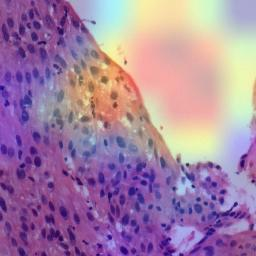

Image : C19_B015_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 2


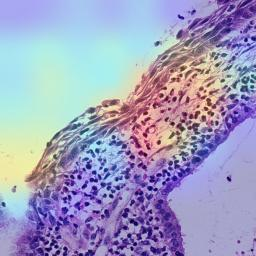

Image : C19_B007_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 2


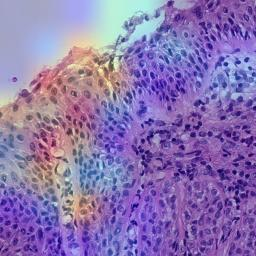

Image : C19_B007_S21_6.jpeg | Classe prédite : 2 | Classe réelle : 2


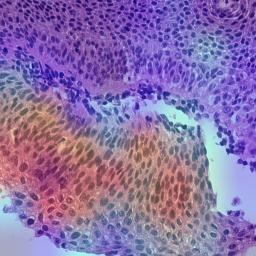

Image : C02_B280_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


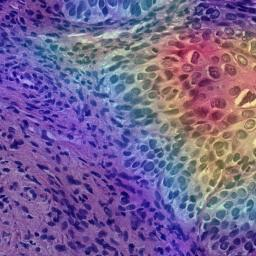

Image : C17_B028_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 1


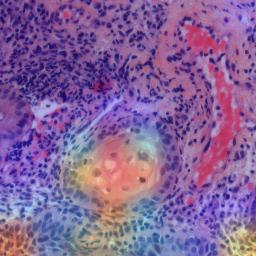

Image : C17_B025_S17_3.jpeg | Classe prédite : 0 | Classe réelle : 1


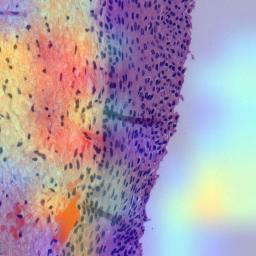

Image : C19_B028_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


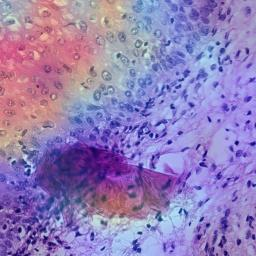

Image : C19_B013_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 1


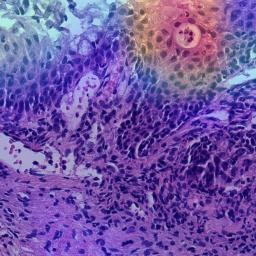

Image : C19_B013_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


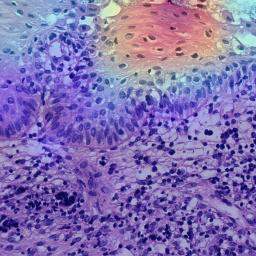

Image : C14_B030_S11_10.jpeg | Classe prédite : 0 | Classe réelle : 0


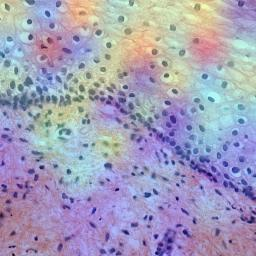

Image : C17_B023_S17_6.jpeg | Classe prédite : 0 | Classe réelle : 0


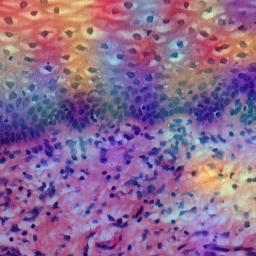

Image : C19_B025_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


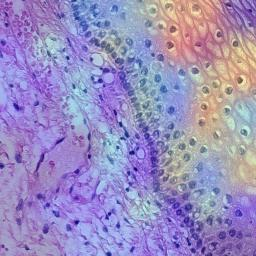

Image : C14_B090_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


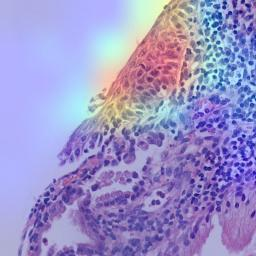

Image : C14_B090_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


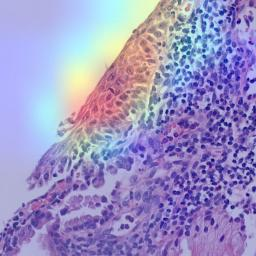

Image : C13_B008_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


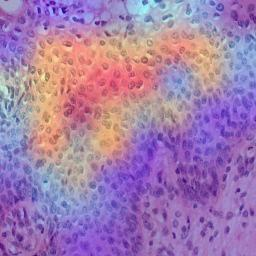

Image : C17_B052_S17_1.jpeg | Classe prédite : 1 | Classe réelle : 1


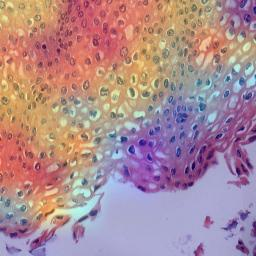

Image : C14_B086_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


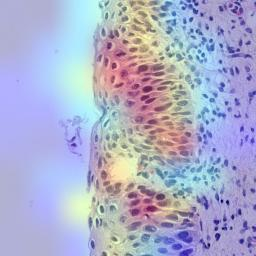

Image : C14_B084_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


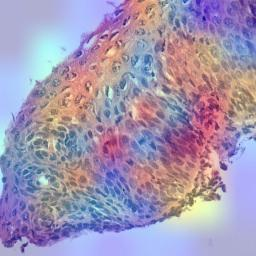

Image : C04_B023_S04_1.jpeg | Classe prédite : 0 | Classe réelle : 0


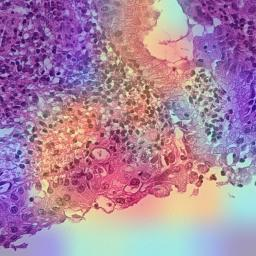

Image : C04_B023_S04_4.jpeg | Classe prédite : 0 | Classe réelle : 0


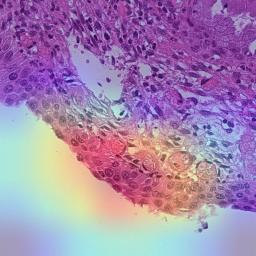

Image : C17_B055_S17_1.jpeg | Classe prédite : 2 | Classe réelle : 2


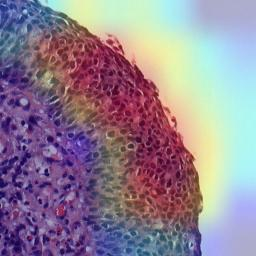

Image : C17_B055_S17_2.jpeg | Classe prédite : 3 | Classe réelle : 3


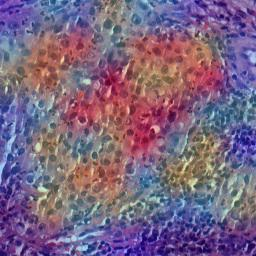

Image : C17_B055_S17_5.jpeg | Classe prédite : 3 | Classe réelle : 3


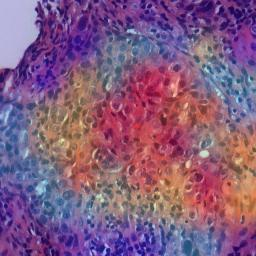

Image : C02_B175_S21_5.jpeg | Classe prédite : 3 | Classe réelle : 3


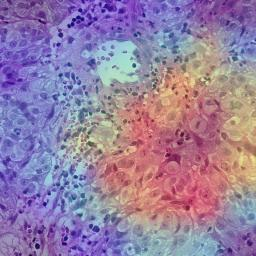

Image : C12_B110_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


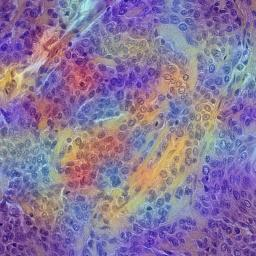

Image : C12_B110_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


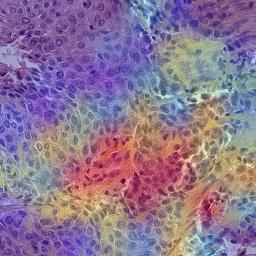

Image : C13_B005_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


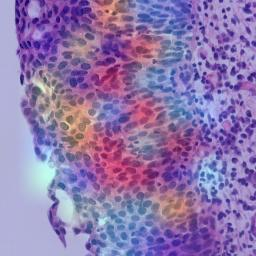

Image : C05_B047_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


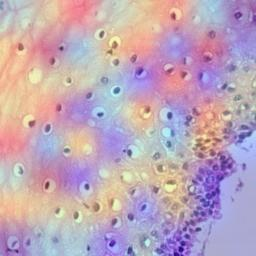

Image : C13_B008_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 1


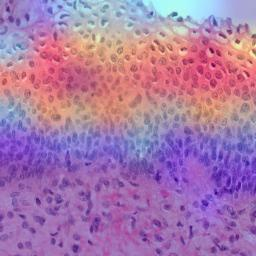

Image : C13_B002_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


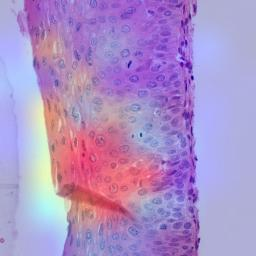

Image : C13_B002_S11_6.jpeg | Classe prédite : 1 | Classe réelle : 1


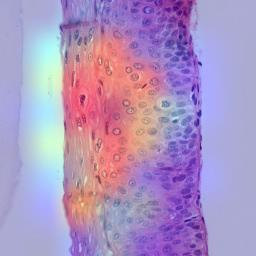

Image : C04_B026_S04_5.jpeg | Classe prédite : 1 | Classe réelle : 1


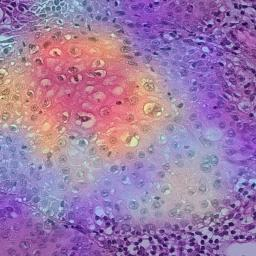

Image : C04_B022_S04_3.jpeg | Classe prédite : 0 | Classe réelle : 0


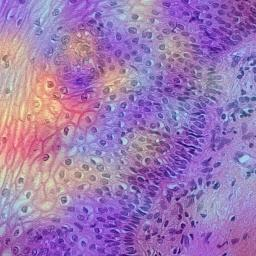

Image : C04_B022_S04_6.jpeg | Classe prédite : 1 | Classe réelle : 1


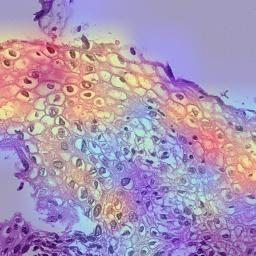

Image : C02_B185_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


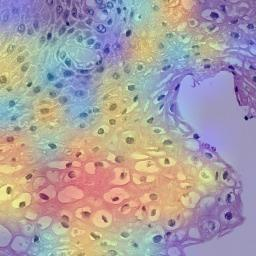

Image : C14_B115_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


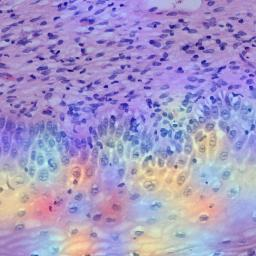

Image : C14_B115_S11_7.jpeg | Classe prédite : 0 | Classe réelle : 0


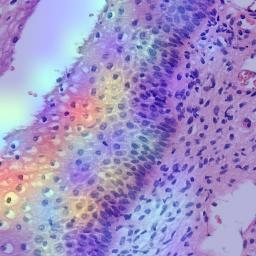

Image : C14_B121_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


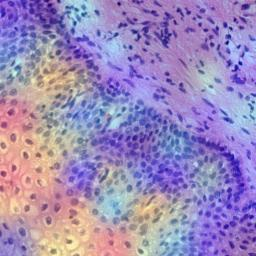

Image : C14_B099_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


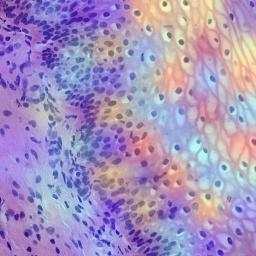

Image : C05_B041_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


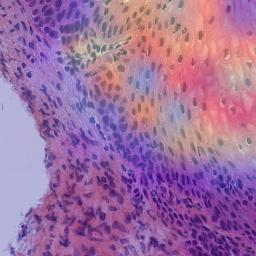

Image : C05_B041_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 0


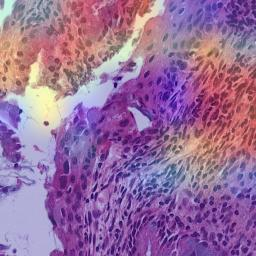

Image : C05_B041_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


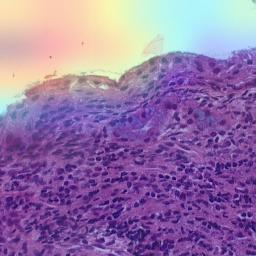

Image : C05_B041_S11_7.jpeg | Classe prédite : 0 | Classe réelle : 0


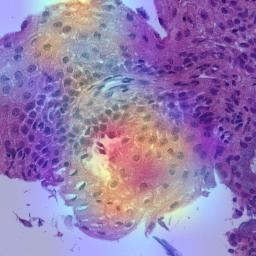

Image : C05_B051_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 1


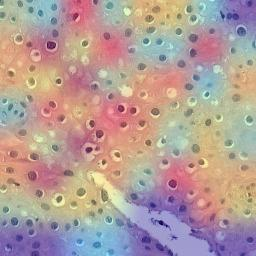

Image : C05_B051_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


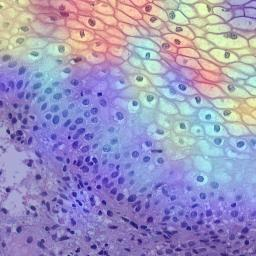

Image : C17_B052_S17_7.jpeg | Classe prédite : 1 | Classe réelle : 0


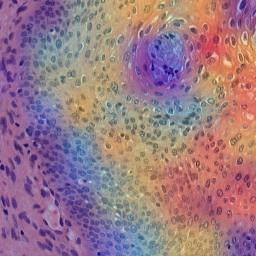

Image : C17_B053_S17_4.jpeg | Classe prédite : 0 | Classe réelle : 0


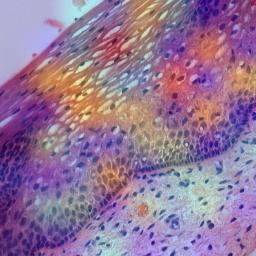

Image : C17_B056_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 0


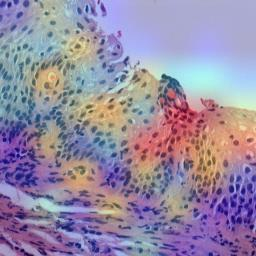

Image : C17_B056_S17_3.jpeg | Classe prédite : 0 | Classe réelle : 0


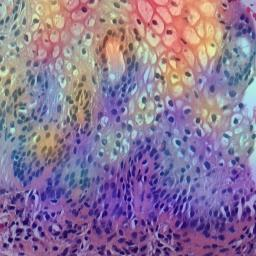

Image : C10_B030_S10_2.jpeg | Classe prédite : 1 | Classe réelle : 0


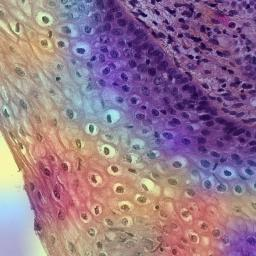

Image : C10_B029_S10_2.jpeg | Classe prédite : 1 | Classe réelle : 1


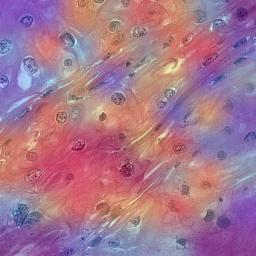

Image : C10_B029_S10_5.jpeg | Classe prédite : 0 | Classe réelle : 0


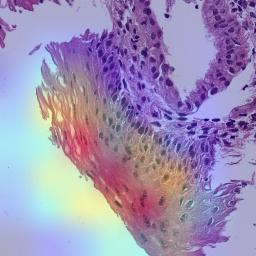

Image : C04_B025_S04_2.jpeg | Classe prédite : 0 | Classe réelle : 0


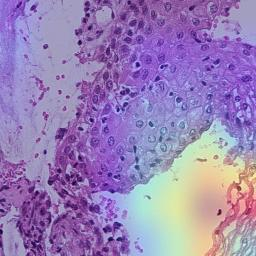

Image : C04_B025_S04_3.jpeg | Classe prédite : 0 | Classe réelle : 0


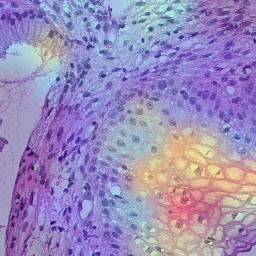

Image : C02_B223_S21_7.jpeg | Classe prédite : 0 | Classe réelle : 0


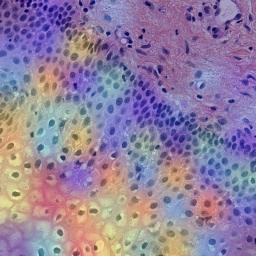

Image : C02_B223_S21_8.jpeg | Classe prédite : 0 | Classe réelle : 0


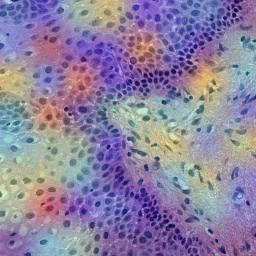

Image : C02_B221_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


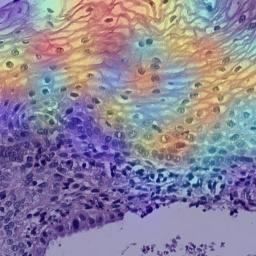

Image : C02_B221_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


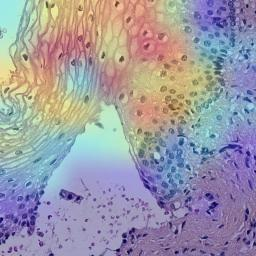

Image : C02_B219_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


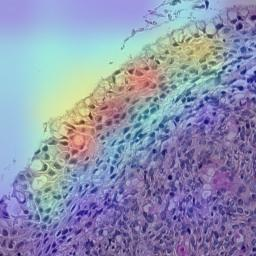

Image : C02_B197_S21_6.jpeg | Classe prédite : 0 | Classe réelle : 0


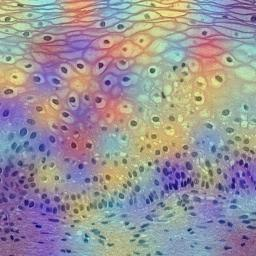

Image : C02_B085_S21_6.jpeg | Classe prédite : 0 | Classe réelle : 0


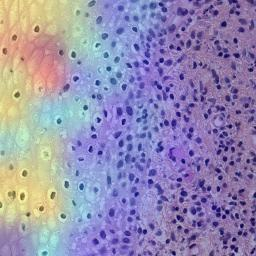

Image : C02_B081_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 2


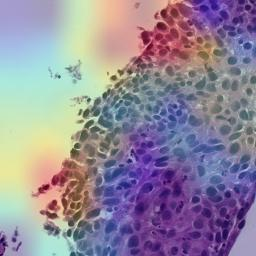

Image : C01_B044_S01_0.jpeg | Classe prédite : 1 | Classe réelle : 1


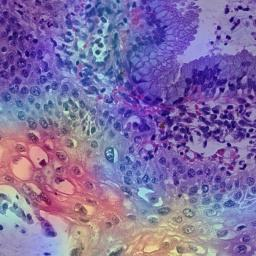

Image : C01_B123_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


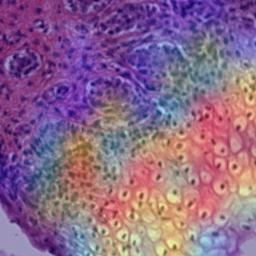

Image : C07_B020_S21_1.jpeg | Classe prédite : 2 | Classe réelle : 2


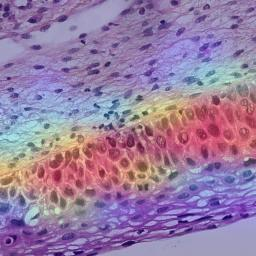

Image : C16_B092_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 2


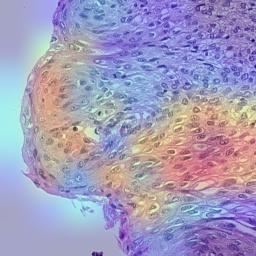

Image : C13_B079_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


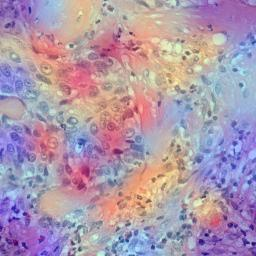

Image : C12_B088_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 0


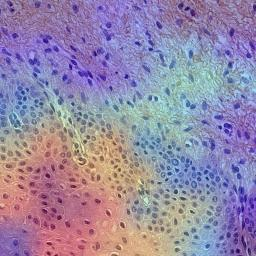

Image : C12_B088_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 0


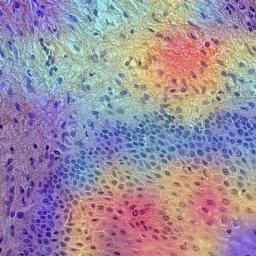

Image : C12_B088_S12_5.jpeg | Classe prédite : 2 | Classe réelle : 2


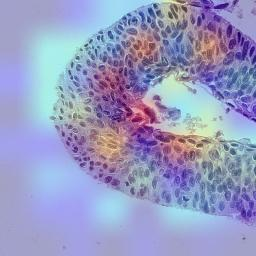

Image : C02_B104_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 2


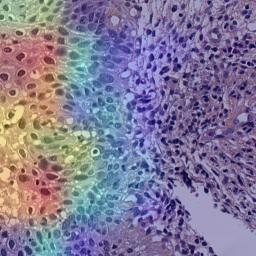

Image : C16_B094_S21_6.jpeg | Classe prédite : 0 | Classe réelle : 1


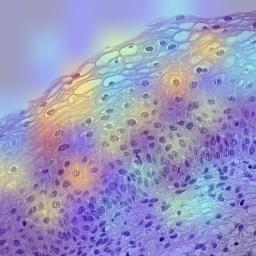

Image : C13_B085_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


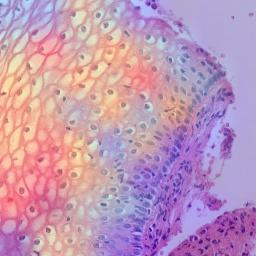

Image : C13_B085_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 1


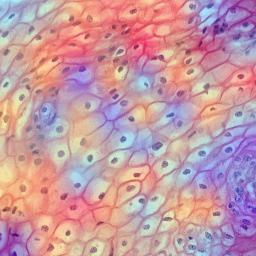

Image : C02_B084_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


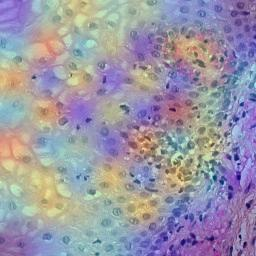

Image : C13_B088_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


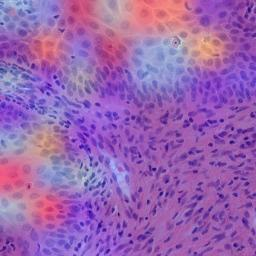

Image : C13_B087_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


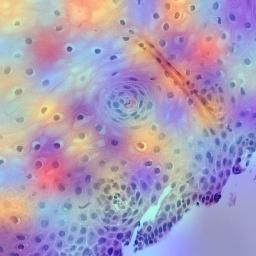

Image : C13_B087_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


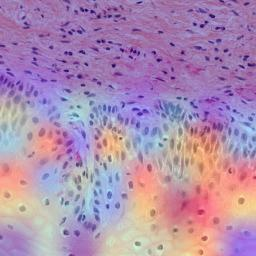

Image : C13_B072_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


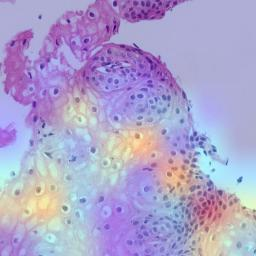

Image : C13_B072_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


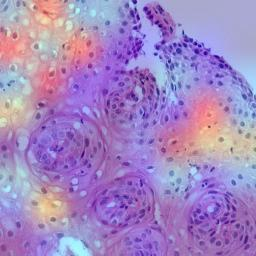

Image : C13_B072_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 0


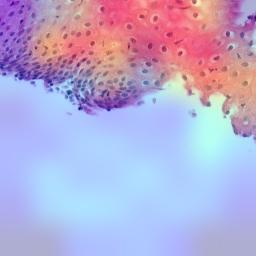

Image : C04_B038_S04_0.jpeg | Classe prédite : 0 | Classe réelle : 0


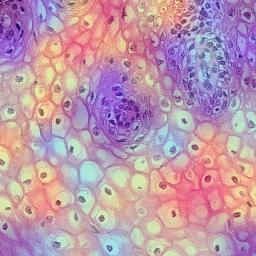

Image : C04_B038_S04_3.jpeg | Classe prédite : 0 | Classe réelle : 0


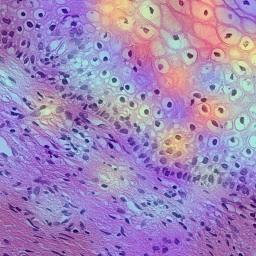

Image : C04_B038_S04_4.jpeg | Classe prédite : 0 | Classe réelle : 0


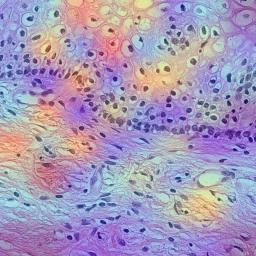

Image : C01_B043_S01_2.jpeg | Classe prédite : 0 | Classe réelle : 0


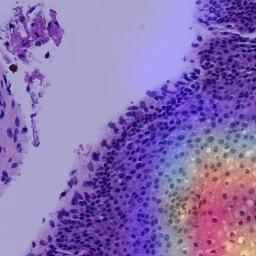

Image : C01_B029_S01_2.jpeg | Classe prédite : 0 | Classe réelle : 0


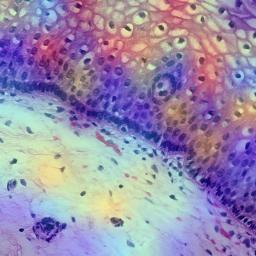

Image : C01_B044_S01_2.jpeg | Classe prédite : 0 | Classe réelle : 0


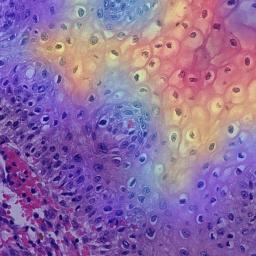

Image : C01_B044_S01_4.jpeg | Classe prédite : 1 | Classe réelle : 1


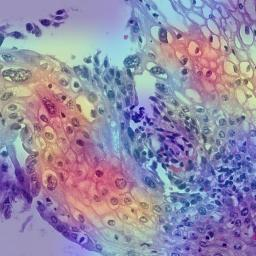

Image : C01_B008_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


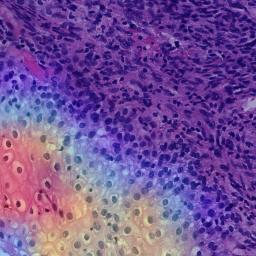

Image : C07_B046_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


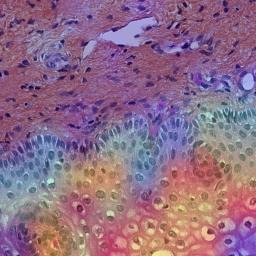

Image : C07_B046_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


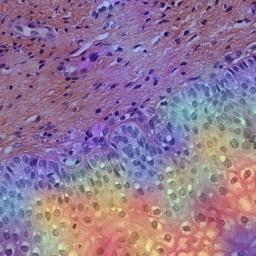

Image : C07_B046_S21_7.jpeg | Classe prédite : 0 | Classe réelle : 0


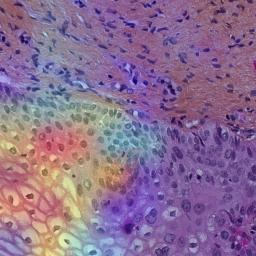

Image : C07_B007_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 0


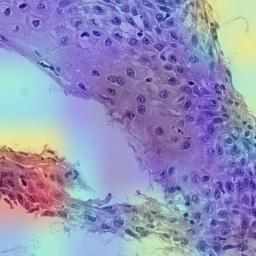

Image : C07_B007_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


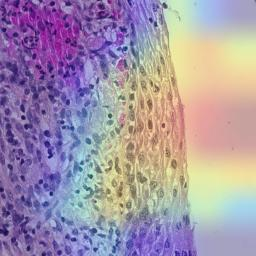

Image : C07_B010_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


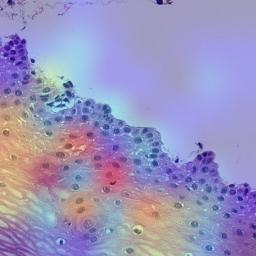

Image : C07_B010_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 0


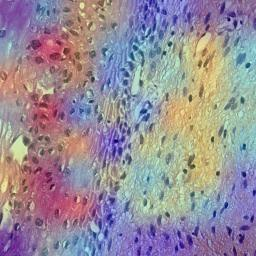

Image : C07_B009_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 0


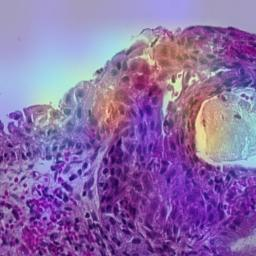

Image : C07_B056_S21_5.jpeg | Classe prédite : 3 | Classe réelle : 3


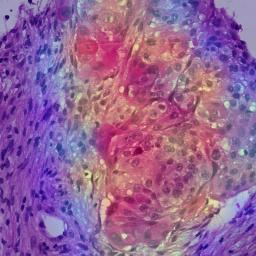

Image : C07_B056_S21_6.jpeg | Classe prédite : 3 | Classe réelle : 3


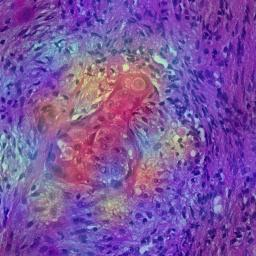

Image : C07_B086_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 0


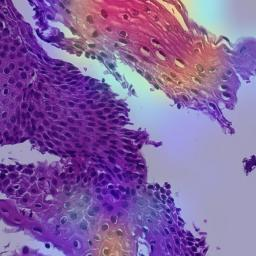

Image : C07_B086_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


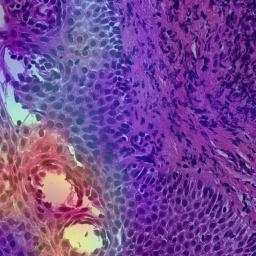

Image : C07_B110_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


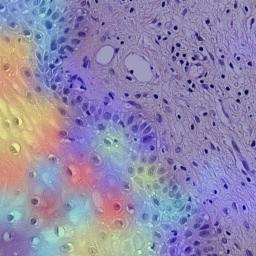

Image : C07_B110_S21_6.jpeg | Classe prédite : 0 | Classe réelle : 0


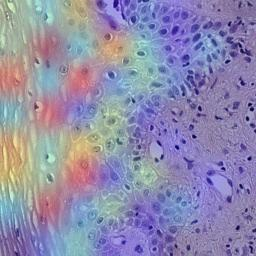

Image : C07_B110_S21_7.jpeg | Classe prédite : 0 | Classe réelle : 0


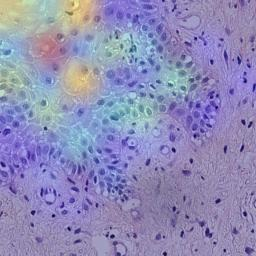

Image : C01_B282_S01_2.jpeg | Classe prédite : 3 | Classe réelle : 3


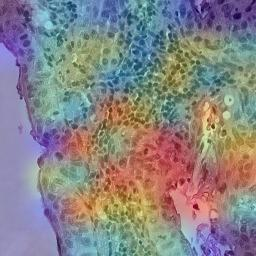

Image : C12_B173_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


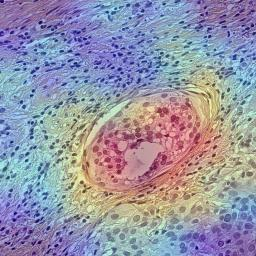

Image : C12_B173_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


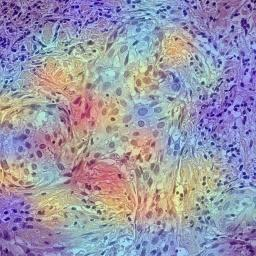

Image : C12_B173_S12_8.jpeg | Classe prédite : 3 | Classe réelle : 3


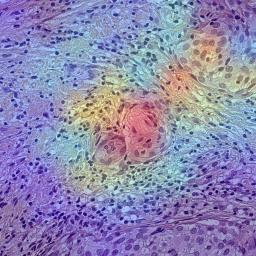

Image : C12_B175_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


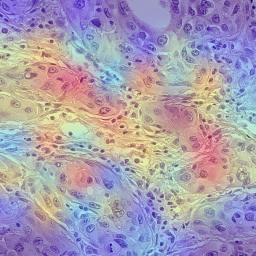

Image : C12_B176_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


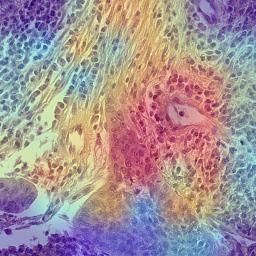

Image : C12_B177_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


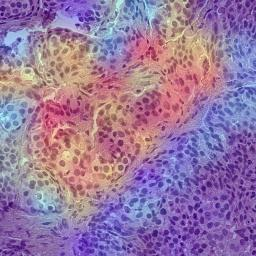

Image : C12_B178_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


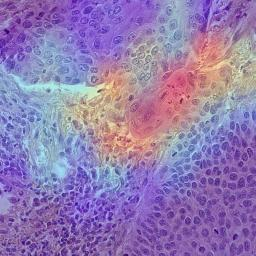

Image : C12_B179_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


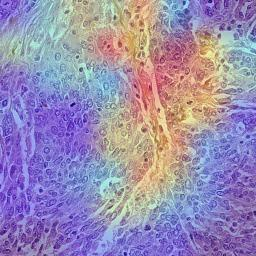

Image : C12_B179_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


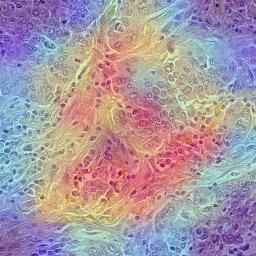

Image : C12_B179_S12_5.jpeg | Classe prédite : 3 | Classe réelle : 3


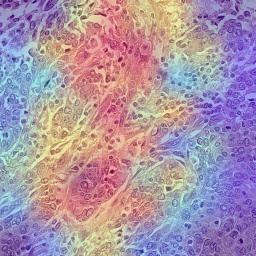

Image : C06_B025_S21_2.jpeg | Classe prédite : 2 | Classe réelle : 2


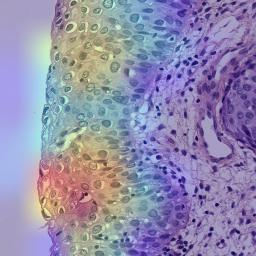

Image : C06_B027_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 2


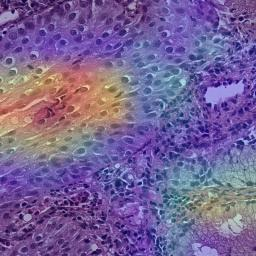

Image : C06_B027_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


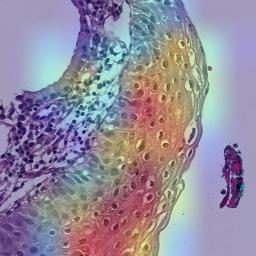

Image : C06_B027_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 1


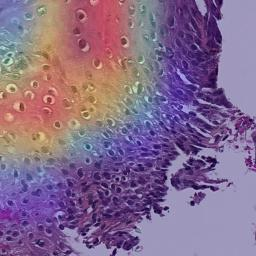

Image : C01_B267_S01_4.jpeg | Classe prédite : 3 | Classe réelle : 3


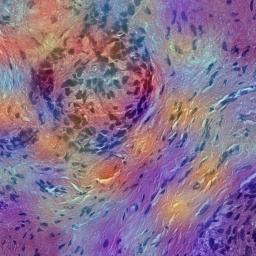

Image : C01_B270_S01_2.jpeg | Classe prédite : 1 | Classe réelle : 2


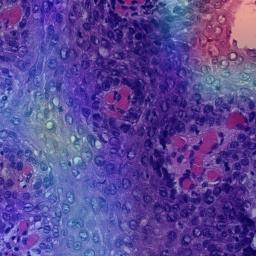

Image : C01_B351_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 1


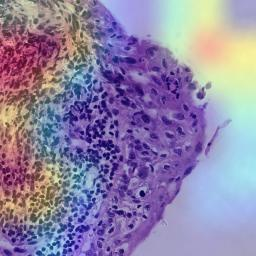

Image : C01_B368_S01_4.jpeg | Classe prédite : 2 | Classe réelle : 2


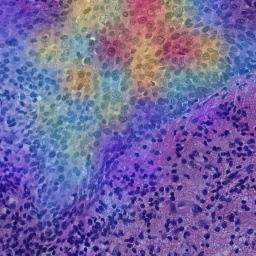

Image : C01_B366_S01_2.jpeg | Classe prédite : 2 | Classe réelle : 2


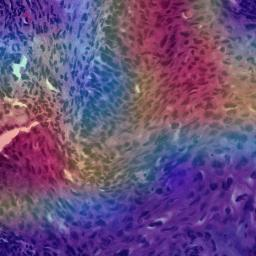

Image : C01_B366_S01_3.jpeg | Classe prédite : 2 | Classe réelle : 2


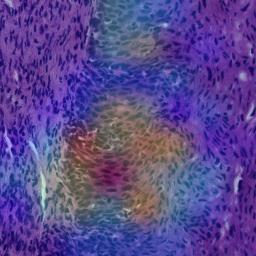

Image : C07_B017_S21_4.jpeg | Classe prédite : 2 | Classe réelle : 2


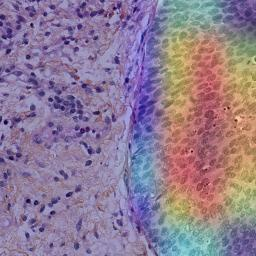

Image : C01_B325_S01_2.jpeg | Classe prédite : 1 | Classe réelle : 1


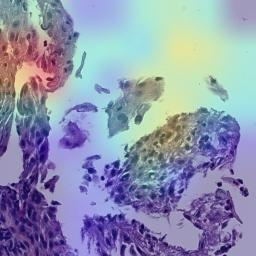

Image : C01_B342_S01_1.jpeg | Classe prédite : 1 | Classe réelle : 1


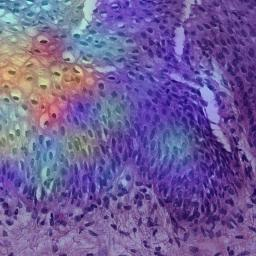

Image : C01_B206_S01_0.jpeg | Classe prédite : 0 | Classe réelle : 0


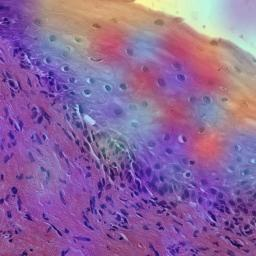

Image : C01_B206_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 1


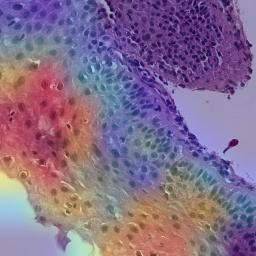

Image : C07_B026_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


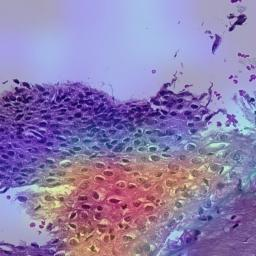

Image : C07_B015_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


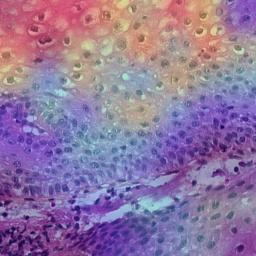

Image : C01_B265_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


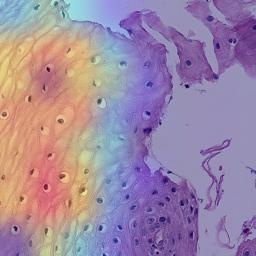

Image : C01_B332_S01_1.jpeg | Classe prédite : 1 | Classe réelle : 0


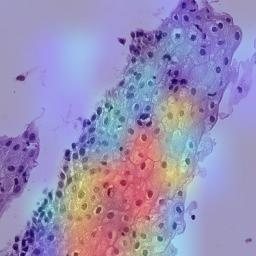

Image : C01_B332_S01_3.jpeg | Classe prédite : 0 | Classe réelle : 0


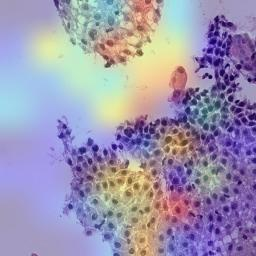

Image : C01_B205_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


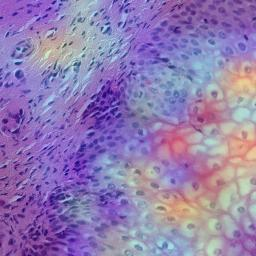

Image : C01_B205_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


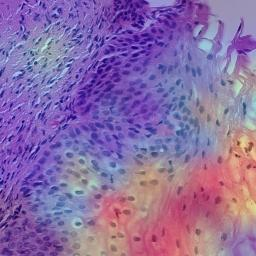

Image : C07_B048_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


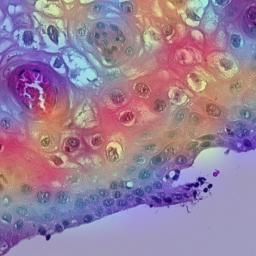

Image : C07_B048_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


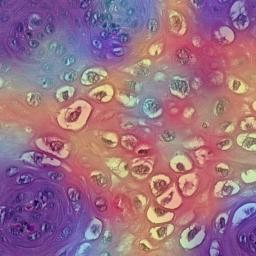

Image : C01_B316_S01_2.jpeg | Classe prédite : 3 | Classe réelle : 2


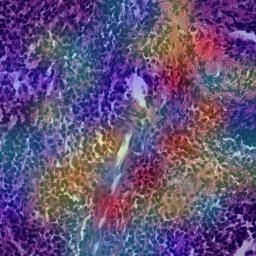

Image : C11_B126_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


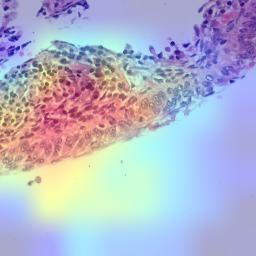

Image : C11_B126_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 2


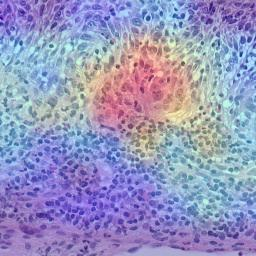

Image : C06_B008_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


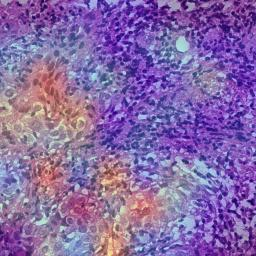

Image : C06_B006_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


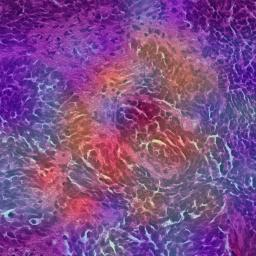

Image : C12_B604_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


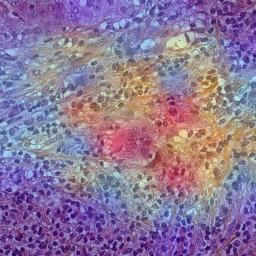

Image : C12_B604_S12_7.jpeg | Classe prédite : 3 | Classe réelle : 3


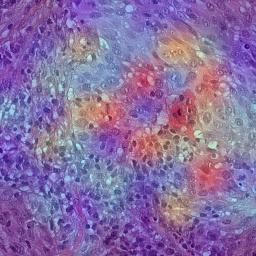

Image : C12_B601_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


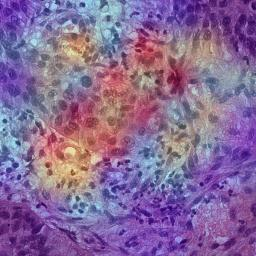

Image : C12_B598_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


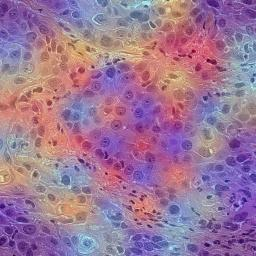

Image : C12_B595_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


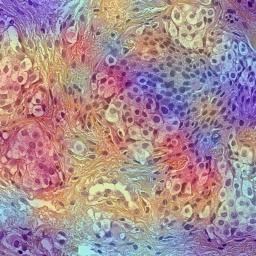

Image : C12_B595_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


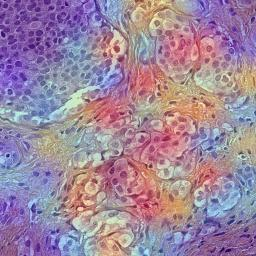

Image : C12_B201_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


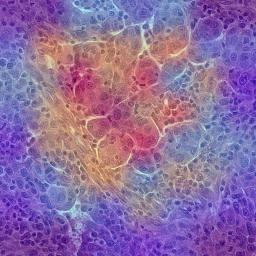

Image : C12_B201_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


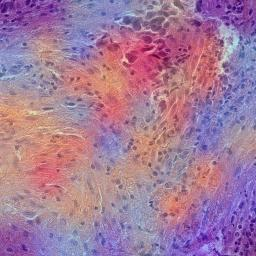

Image : C12_B201_S12_5.jpeg | Classe prédite : 3 | Classe réelle : 3


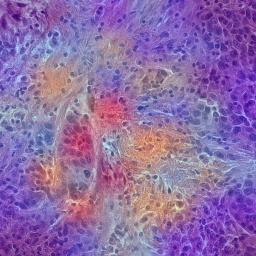

Image : C12_B201_S12_7.jpeg | Classe prédite : 3 | Classe réelle : 3


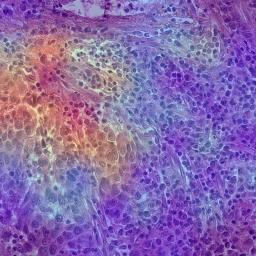

Image : C12_B197_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


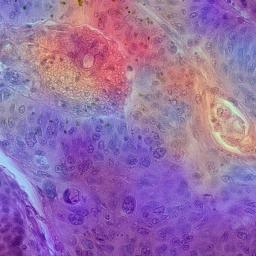

Image : C12_B197_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


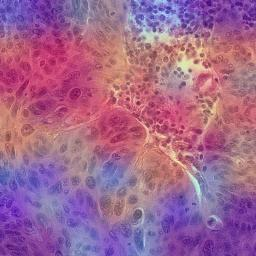

Image : C12_B195_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


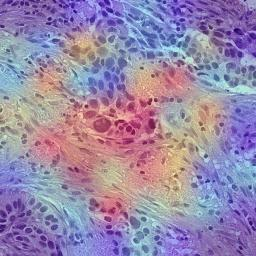

Image : C12_B195_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


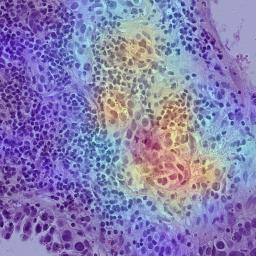

Image : C12_B195_S12_9.jpeg | Classe prédite : 3 | Classe réelle : 3


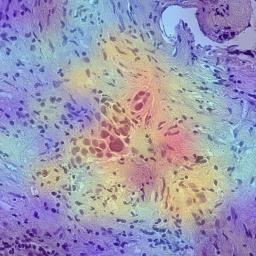

Image : C12_B194_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


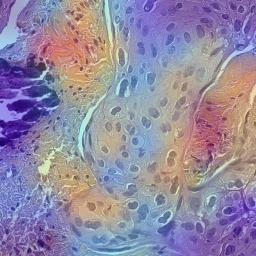

Image : C12_B194_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


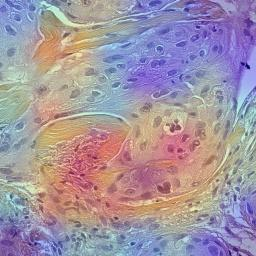

Image : C12_B194_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


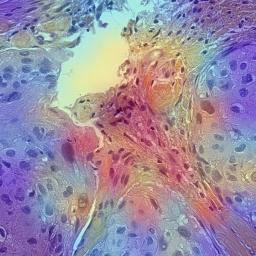

Image : C12_B192_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


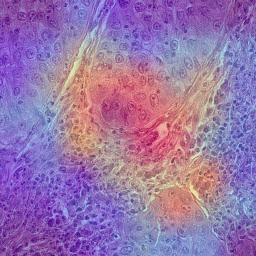

Image : C12_B192_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


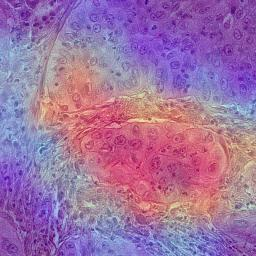

Image : C12_B192_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


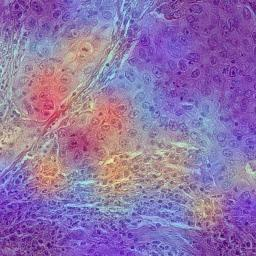

Image : C12_B192_S12_9.jpeg | Classe prédite : 3 | Classe réelle : 3


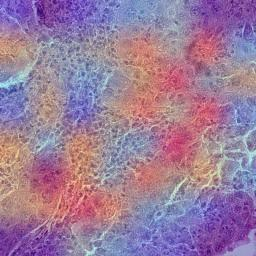

Image : C12_B192_S12_10.jpeg | Classe prédite : 3 | Classe réelle : 3


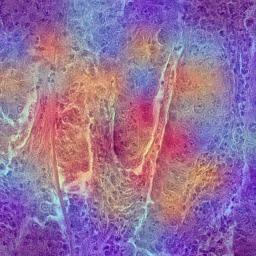

Image : C12_B190_S12_8.jpeg | Classe prédite : 3 | Classe réelle : 3


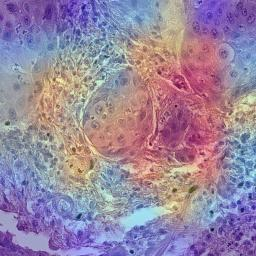

Image : C01_B374_S01_0.jpeg | Classe prédite : 3 | Classe réelle : 3


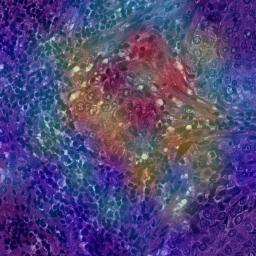

Image : C01_B374_S01_4.jpeg | Classe prédite : 3 | Classe réelle : 3


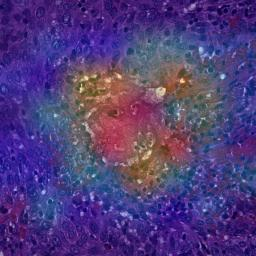

Image : C01_B256_S01_3.jpeg | Classe prédite : 3 | Classe réelle : 3


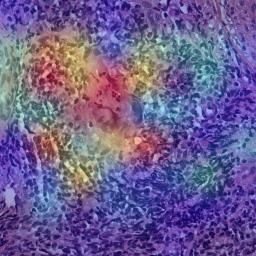

Image : C01_B256_S01_4.jpeg | Classe prédite : 3 | Classe réelle : 3


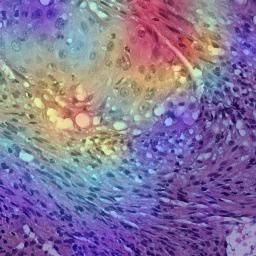

Image : C06_B007_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


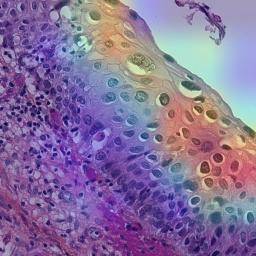

Image : C06_B003_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


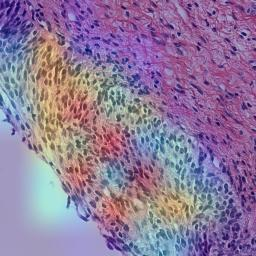

Image : C12_B199_S12_3.jpeg | Classe prédite : 2 | Classe réelle : 2


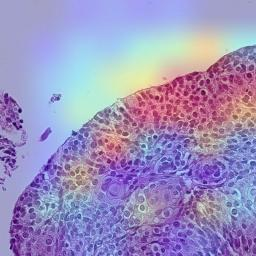

Image : C12_B198_S12_1.jpeg | Classe prédite : 2 | Classe réelle : 2


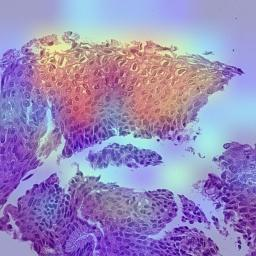

Image : C01_B257_S01_4.jpeg | Classe prédite : 2 | Classe réelle : 2


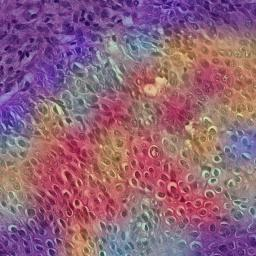

Image : C01_B207_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 2


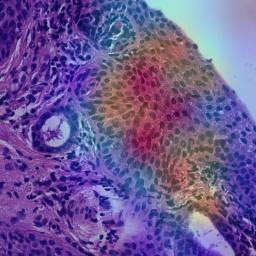

Image : C01_B207_S01_1.jpeg | Classe prédite : 1 | Classe réelle : 2


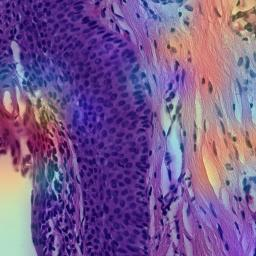

Image : C01_B207_S01_2.jpeg | Classe prédite : 2 | Classe réelle : 2


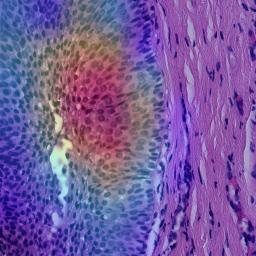

Image : C01_B292_S01_3.jpeg | Classe prédite : 2 | Classe réelle : 2


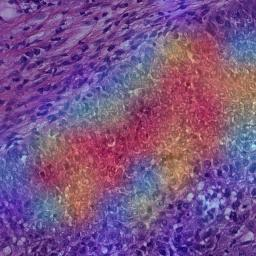

Image : C11_B113_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


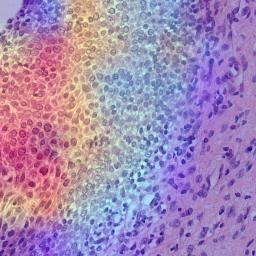

Image : C11_B113_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


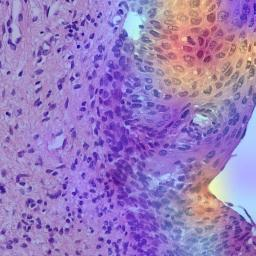

Image : C11_B145_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 2


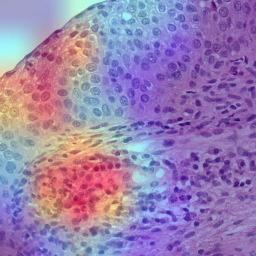

Image : C12_B599_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 1


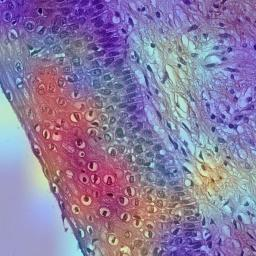

Image : C12_B599_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 1


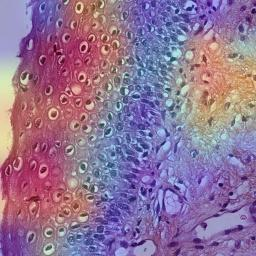

Image : C12_B594_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 1


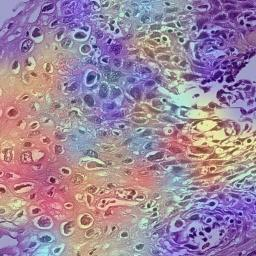

Image : C12_B592_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


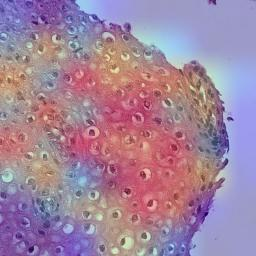

Image : C12_B592_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 1


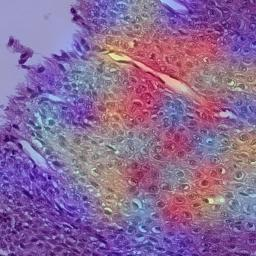

Image : C01_B241_S01_3.jpeg | Classe prédite : 0 | Classe réelle : 1


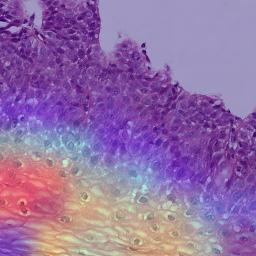

Image : C06_B001_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


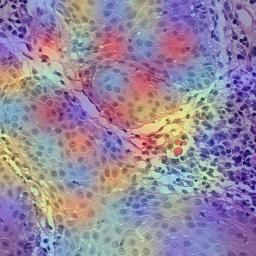

Image : C12_B603_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 0


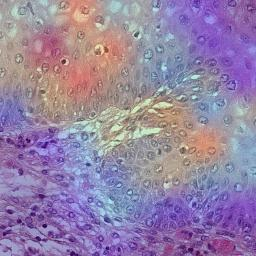

Image : C12_B603_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


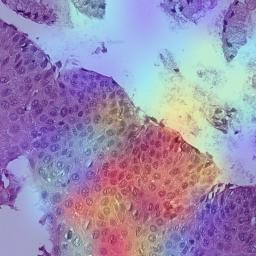

Image : C12_B602_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


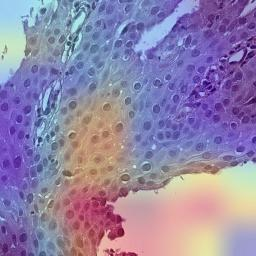

Image : C01_B308_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


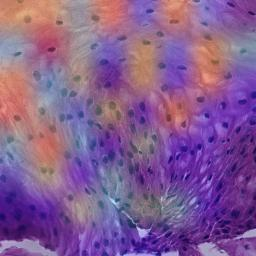

Image : C01_B308_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


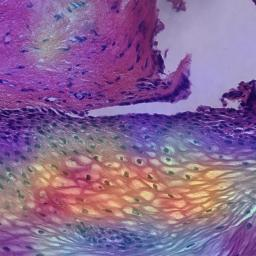

Image : C01_B294_S01_0.jpeg | Classe prédite : 1 | Classe réelle : 0


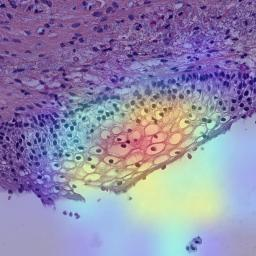

Image : C01_B260_S01_4.jpeg | Classe prédite : 0 | Classe réelle : 0


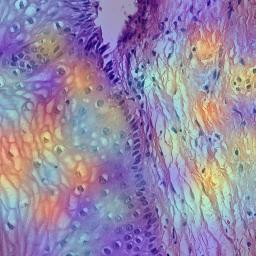

Image : C11_B013_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


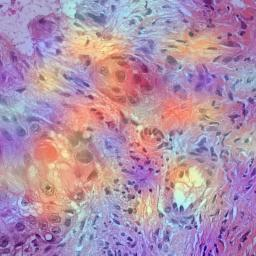

Image : C11_B033_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


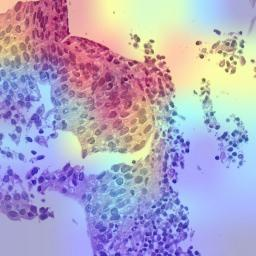

Image : C11_B033_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 2


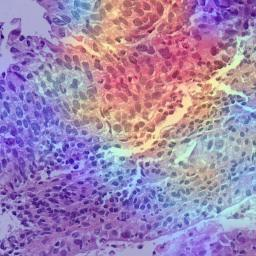

Image : C11_B037_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 0


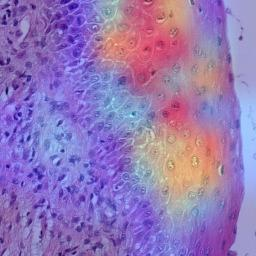

Image : C11_B041_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


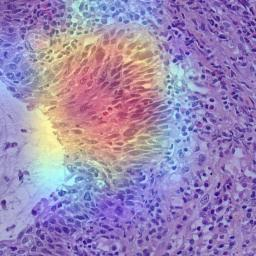

Image : C11_B041_S11_5.jpeg | Classe prédite : 2 | Classe réelle : 2


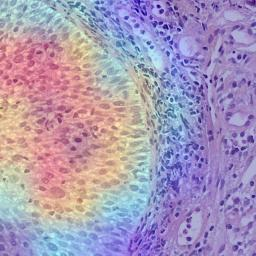

Image : C11_B103_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 2


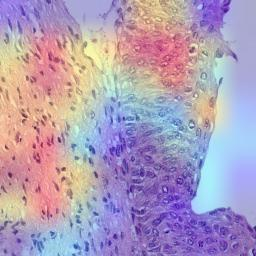

Image : C11_B103_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


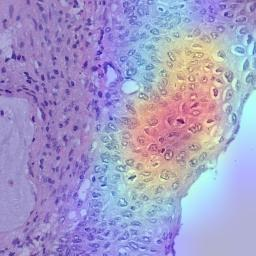

Image : C11_B036_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


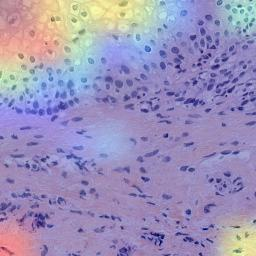

Image : C06_B058_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 2


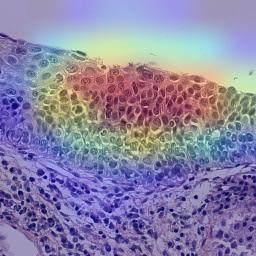

Image : C06_B065_S21_2.jpeg | Classe prédite : 3 | Classe réelle : 3


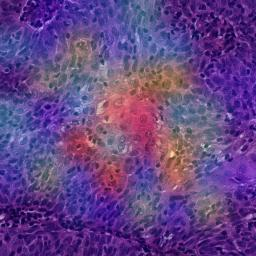

Image : C06_B064_S21_1.jpeg | Classe prédite : 3 | Classe réelle : 3


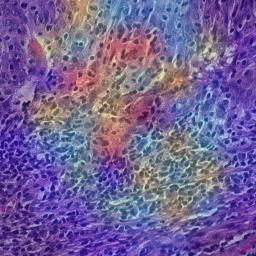

Image : C06_B055_S21_1.jpeg | Classe prédite : 2 | Classe réelle : 2


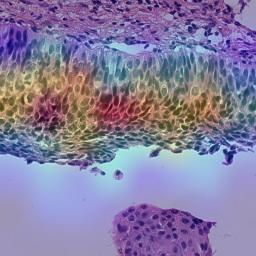

Image : C06_B047_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


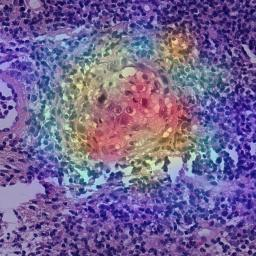

Image : C06_B068_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 2


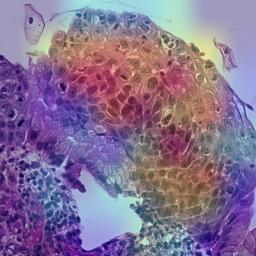

Image : C06_B049_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


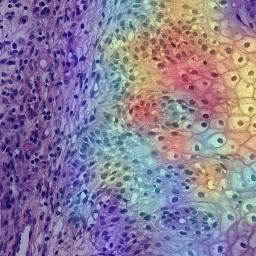

Image : C06_B049_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


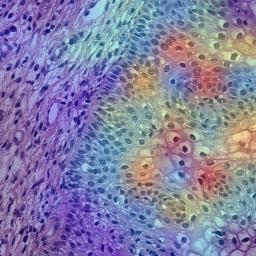

Image : C06_B054_S21_0.jpeg | Classe prédite : 2 | Classe réelle : 0


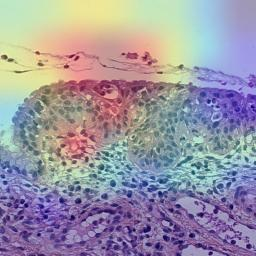

Image : C06_B054_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


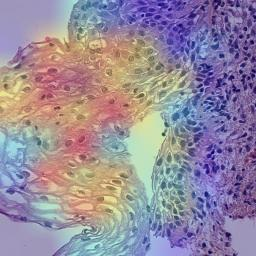

Image : C06_B066_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 0


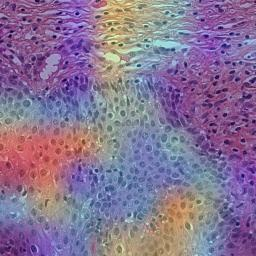

Image : C06_B066_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


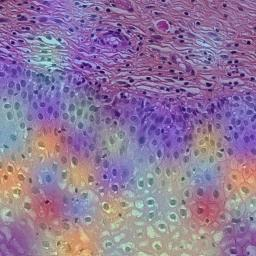

Image : C06_B046_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 2


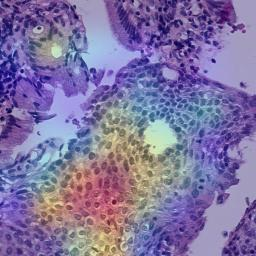

Image : C06_B048_S21_2.jpeg | Classe prédite : 2 | Classe réelle : 2


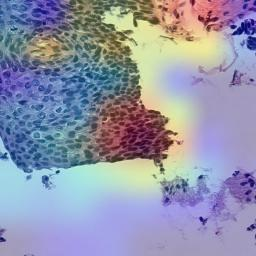

Image : C12_B158_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


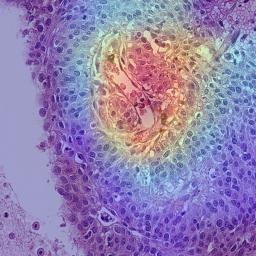

Image : C12_B158_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


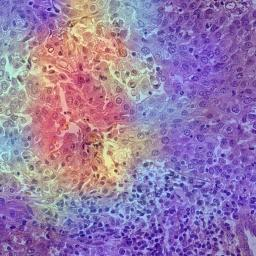

Image : C12_B160_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


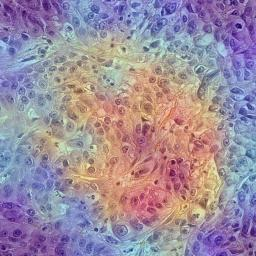

Image : C12_B164_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


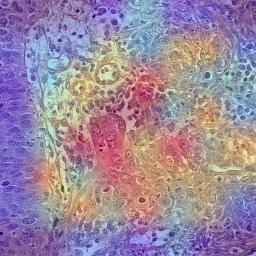

Image : C12_B172_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


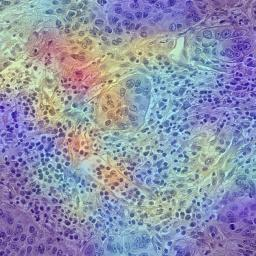

Image : C12_B159_S12_1.jpeg | Classe prédite : 2 | Classe réelle : 2


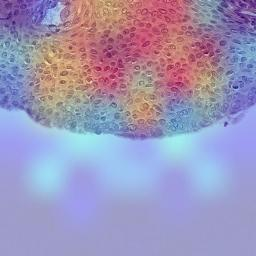

Image : C12_B166_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 2


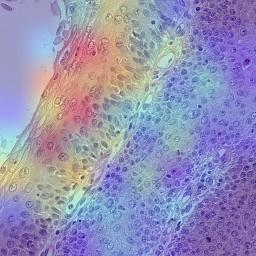

Image : C12_B166_S12_1.jpeg | Classe prédite : 2 | Classe réelle : 2


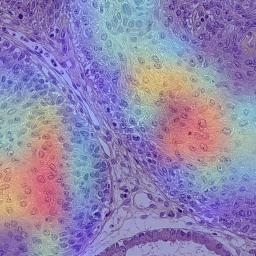

Image : C12_B166_S12_4.jpeg | Classe prédite : 2 | Classe réelle : 2


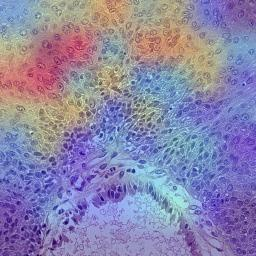

Image : C12_B168_S12_2.jpeg | Classe prédite : 2 | Classe réelle : 2


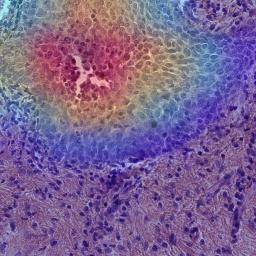

Image : C12_B171_S12_2.jpeg | Classe prédite : 2 | Classe réelle : 2


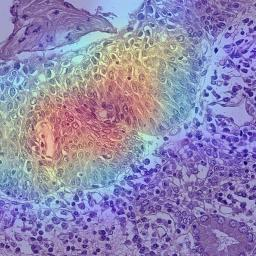

Image : C01_B317_S01_0.jpeg | Classe prédite : 3 | Classe réelle : 3


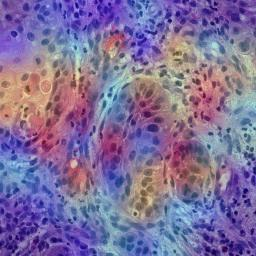

Image : C01_B373_S01_5.jpeg | Classe prédite : 3 | Classe réelle : 3


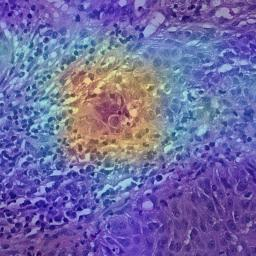

Image : C01_B227_S01_3.jpeg | Classe prédite : 1 | Classe réelle : 1


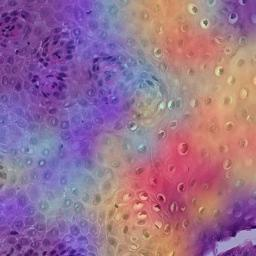

Image : C01_B284_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 1


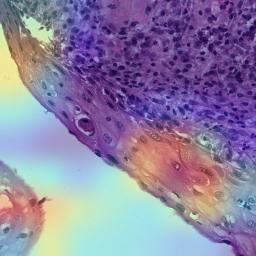

Image : C01_B254_S01_3.jpeg | Classe prédite : 1 | Classe réelle : 1


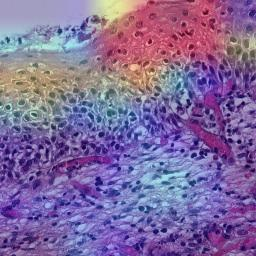

Image : C01_B365_S01_0.jpeg | Classe prédite : 1 | Classe réelle : 1


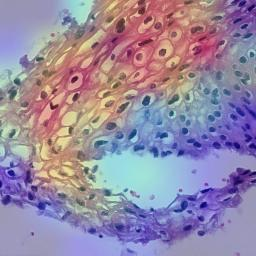

Image : C01_B365_S01_7.jpeg | Classe prédite : 1 | Classe réelle : 1


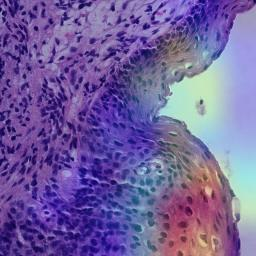

Image : C01_B165_S01_1.jpeg | Classe prédite : 2 | Classe réelle : 2


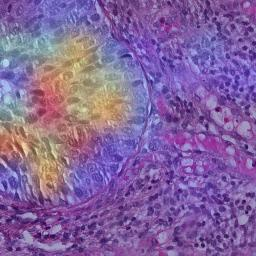

Image : C01_B279_S01_1.jpeg | Classe prédite : 2 | Classe réelle : 2


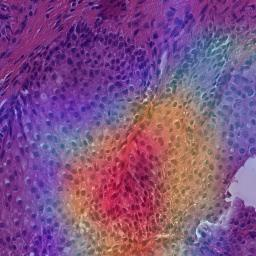

Image : C01_B279_S01_2.jpeg | Classe prédite : 2 | Classe réelle : 2


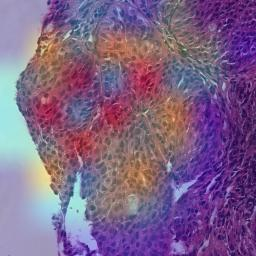

Image : C01_B354_S01_0.jpeg | Classe prédite : 1 | Classe réelle : 2


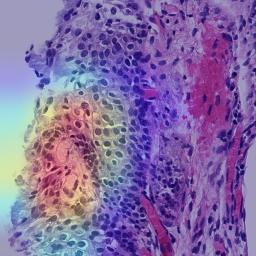

Image : C01_B274_S01_1.jpeg | Classe prédite : 2 | Classe réelle : 2


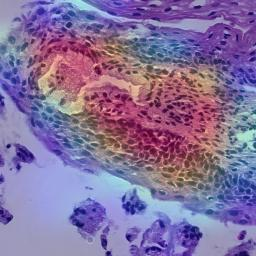

Image : C01_B202_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


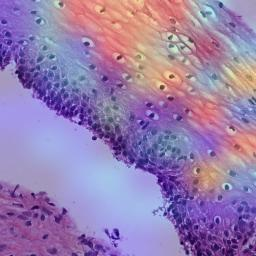

Image : C01_B202_S01_2.jpeg | Classe prédite : 0 | Classe réelle : 0


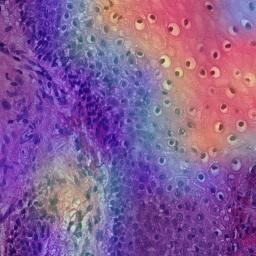

Image : C01_B285_S01_3.jpeg | Classe prédite : 0 | Classe réelle : 0


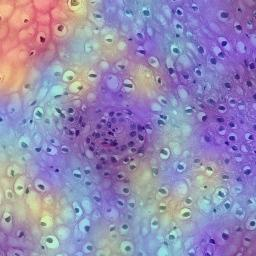

Image : C07_B081_S21_9.jpeg | Classe prédite : 1 | Classe réelle : 1


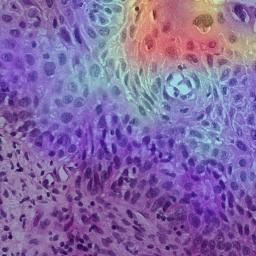

Image : C07_B008_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 1


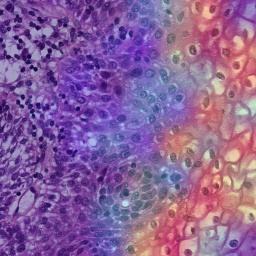

Image : C07_B057_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


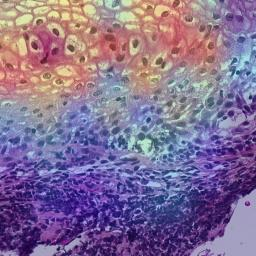

Image : C07_B087_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


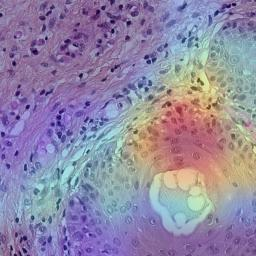

Image : C07_B087_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


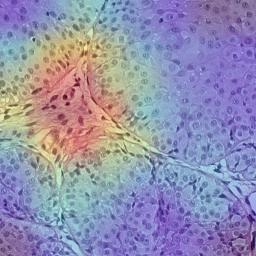

Image : C07_B098_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


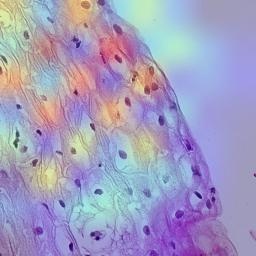

Image : C07_B029_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


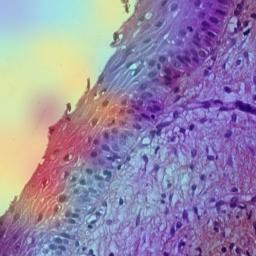

Image : C07_B096_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


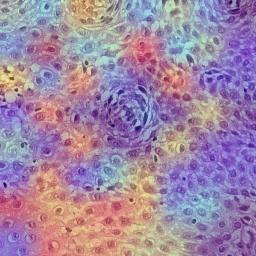

Image : C07_B096_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


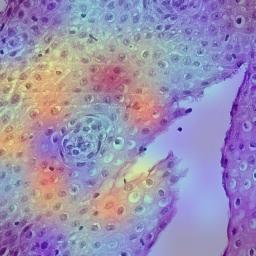

Image : C07_B108_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


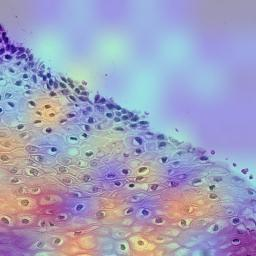

Image : C07_B108_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


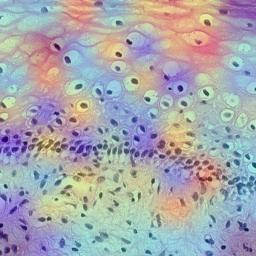

Image : C07_B108_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


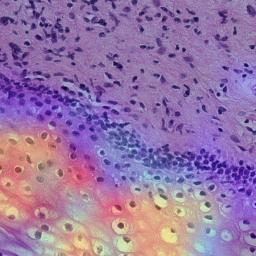

Image : C20_B003_S20_pyr_1.jpeg | Classe prédite : 1 | Classe réelle : 1


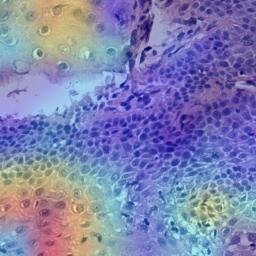

Image : C20_B005_S20_pyr_3.jpeg | Classe prédite : 1 | Classe réelle : 1


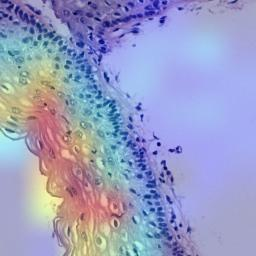

Image : C20_B010_S20_pyr_1.jpeg | Classe prédite : 0 | Classe réelle : 1


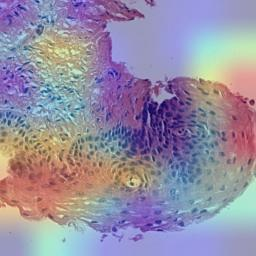

Image : C12_B355_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 2


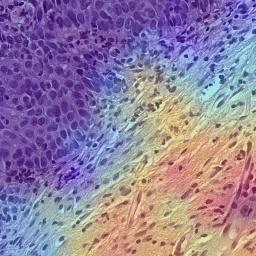

Image : C20_B009_S20_pyr_1.jpeg | Classe prédite : 3 | Classe réelle : 3


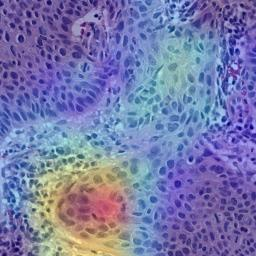

Image : C20_B007_S20_pyr_0.jpeg | Classe prédite : 1 | Classe réelle : 0


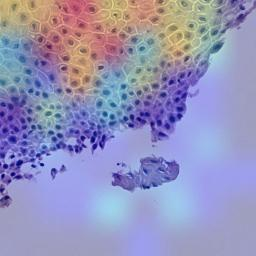

Image : C20_B007_S20_pyr_2.jpeg | Classe prédite : 0 | Classe réelle : 0


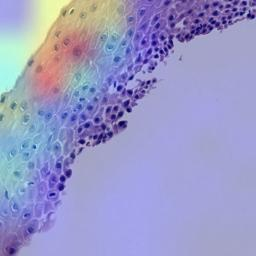

Image : C20_B006_S20_pyr_2.jpeg | Classe prédite : 0 | Classe réelle : 0


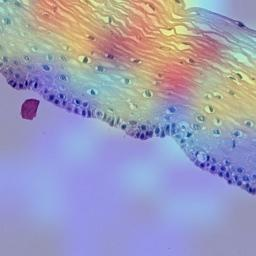

Image : C20_B004_S20_pyr_2.jpeg | Classe prédite : 1 | Classe réelle : 1


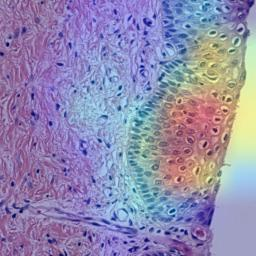

Image : C20_B004_S20_pyr_4.jpeg | Classe prédite : 1 | Classe réelle : 1


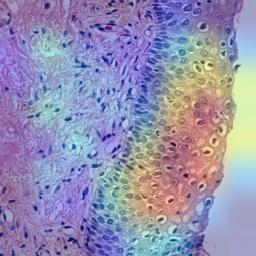

Image : C20_B003_S20_pyr_2.jpeg | Classe prédite : 1 | Classe réelle : 1


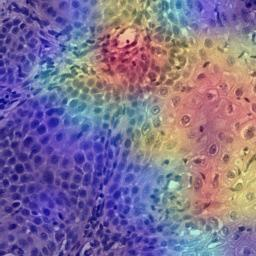

Image : C20_B002_S20_pyr_3.jpeg | Classe prédite : 0 | Classe réelle : 0


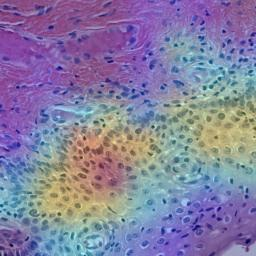

Image : C12_B353_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


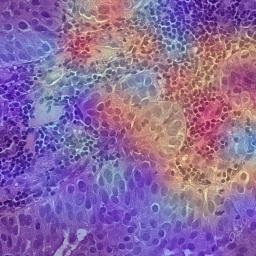

Image : C12_B353_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


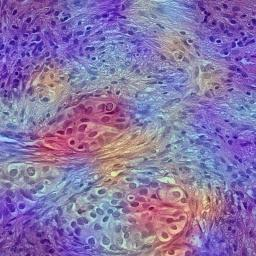

Image : C12_B301_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


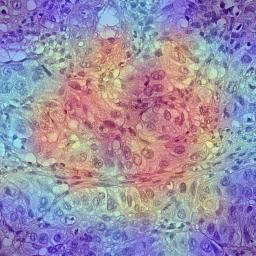

Image : C12_B298_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


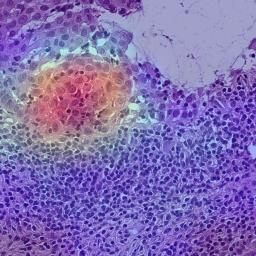

Image : C11_B058_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


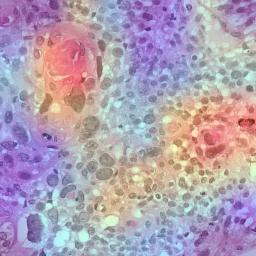

Image : C11_B058_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


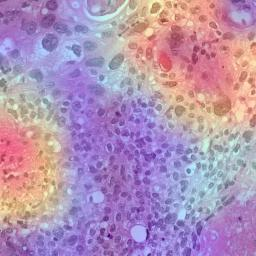

Image : C11_B029_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


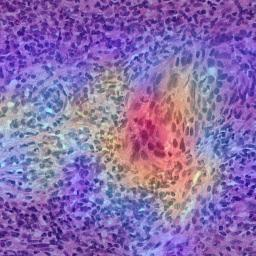

Image : C12_B355_S12_2.jpeg | Classe prédite : 2 | Classe réelle : 2


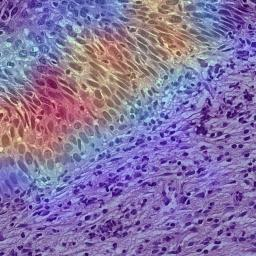

Image : C12_B355_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 2


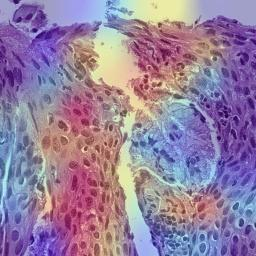

Image : C12_B355_S12_4.jpeg | Classe prédite : 2 | Classe réelle : 2


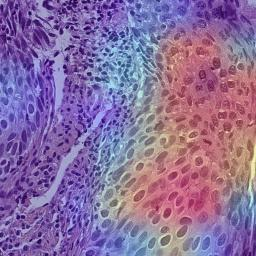

Image : C11_B147_S11_5.jpeg | Classe prédite : 2 | Classe réelle : 2


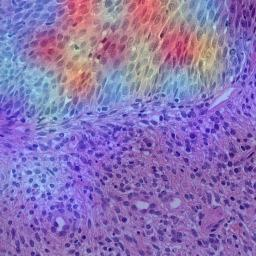

Image : C12_B366_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


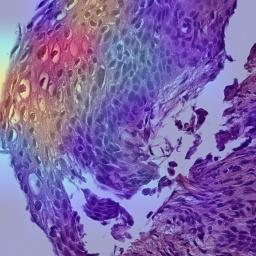

Image : C12_B365_S12_4.jpeg | Classe prédite : 2 | Classe réelle : 1


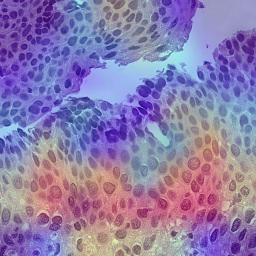

Image : C12_B306_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


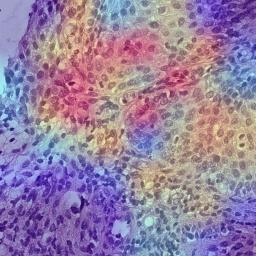

Image : C12_B305_S12_6.jpeg | Classe prédite : 1 | Classe réelle : 1


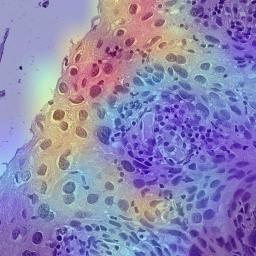

Image : C12_B295_S12_4.jpeg | Classe prédite : 2 | Classe réelle : 2


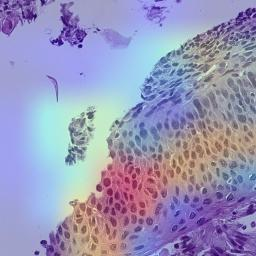

Image : C12_B295_S12_5.jpeg | Classe prédite : 1 | Classe réelle : 1


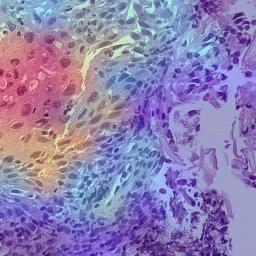

Image : C12_B295_S12_6.jpeg | Classe prédite : 2 | Classe réelle : 1


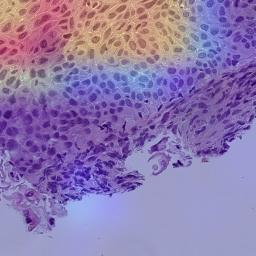

Image : C11_B072_S11_5.jpeg | Classe prédite : 1 | Classe réelle : 1


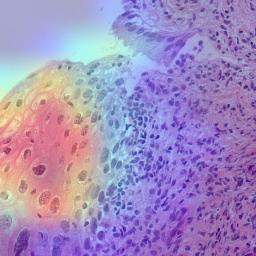

Image : C11_B087_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


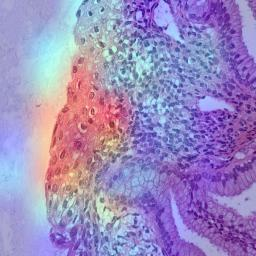

Image : C11_B087_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


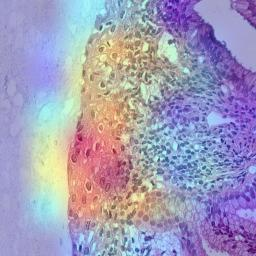

Image : C11_B087_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


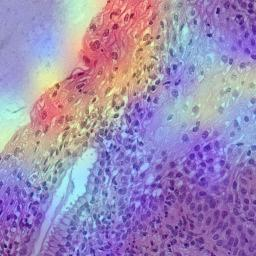

Image : C11_B057_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 1


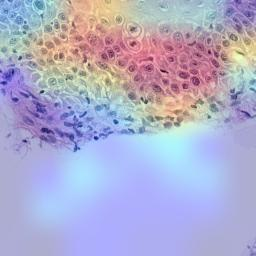

Image : C11_B057_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


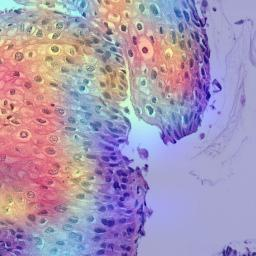

Image : C11_B025_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


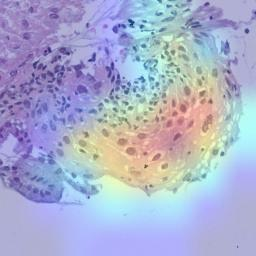

Image : C11_B025_S11_7.jpeg | Classe prédite : 0 | Classe réelle : 1


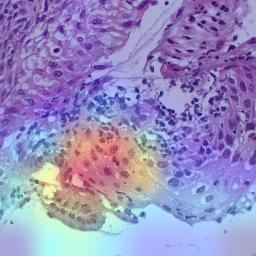

Image : C12_B359_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


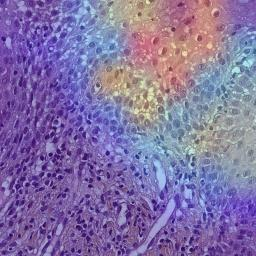

Image : C12_B297_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 0


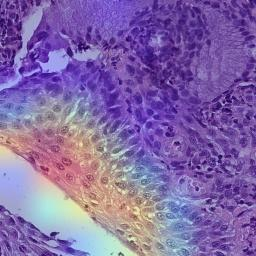

Image : C11_B114_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


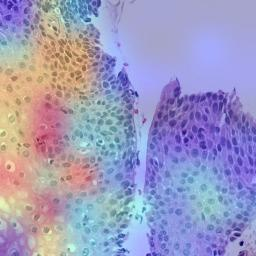

Image : C11_B109_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


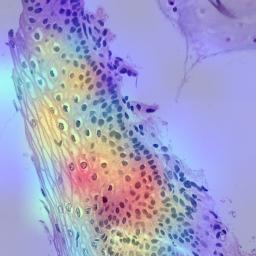

Image : C11_B032_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


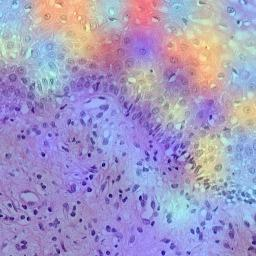

Image : C04_B021_S04_0.jpeg | Classe prédite : 0 | Classe réelle : 1


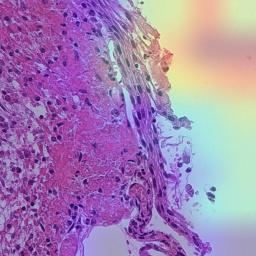

Image : C04_B021_S04_3.jpeg | Classe prédite : 1 | Classe réelle : 1


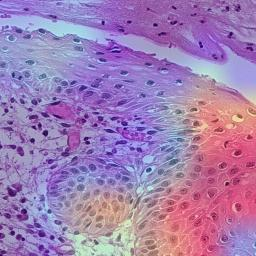

Image : C16_B090_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


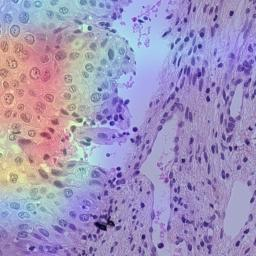

Image : C16_B090_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


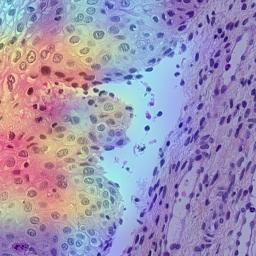

Image : C16_B087_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 1


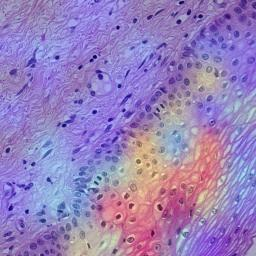

Image : C16_B085_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


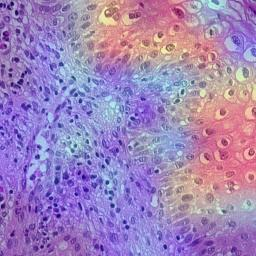

Image : C16_B086_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 1


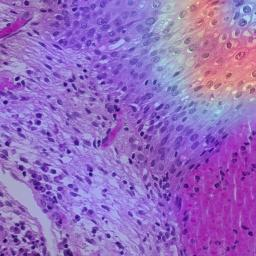

Image : C16_B078_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 2


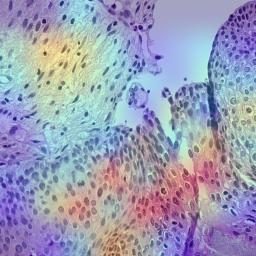

Image : C16_B078_S21_5.jpeg | Classe prédite : 2 | Classe réelle : 2


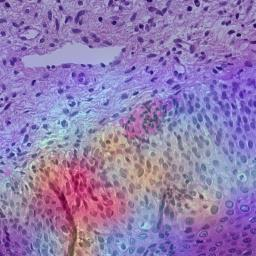

Image : C16_B078_S21_6.jpeg | Classe prédite : 2 | Classe réelle : 2


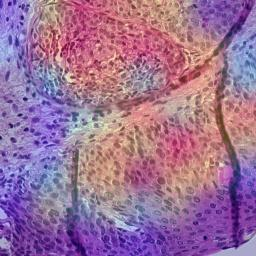

Image : C05_B100_S11_6.jpeg | Classe prédite : 2 | Classe réelle : 2


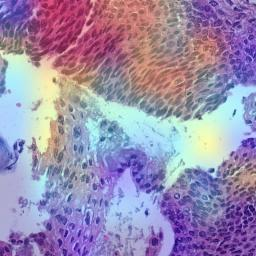

Image : C12_B328_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


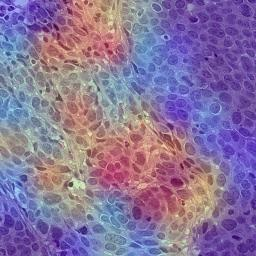

Image : C12_B328_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


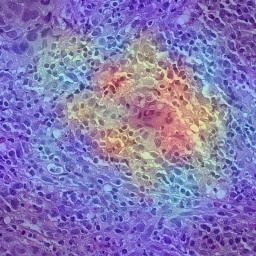

Image : C12_B325_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


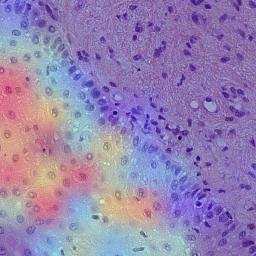

Image : C12_B036_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


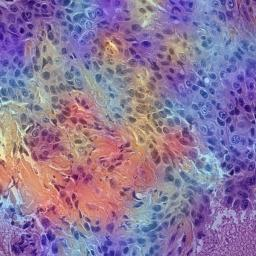

Image : C12_B036_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


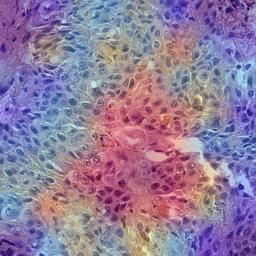

Image : C12_B036_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


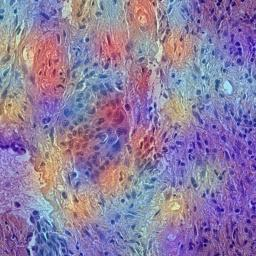

Image : C12_B036_S12_7.jpeg | Classe prédite : 3 | Classe réelle : 3


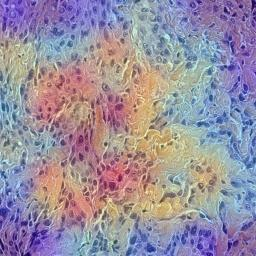

Image : C12_B034_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


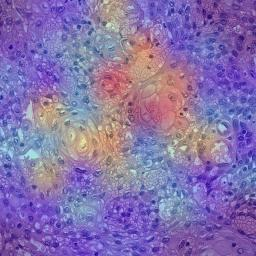

Image : C12_B034_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


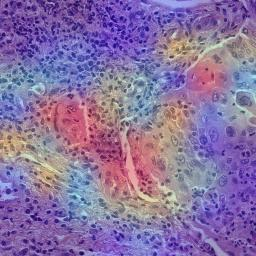

Image : C12_B034_S12_8.jpeg | Classe prédite : 3 | Classe réelle : 3


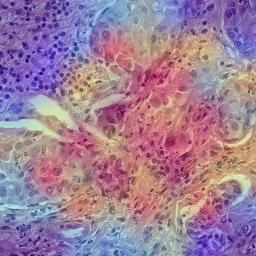

Image : C12_B035_S12_5.jpeg | Classe prédite : 2 | Classe réelle : 2


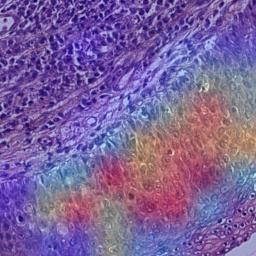

Image : C12_B033_S12_5.jpeg | Classe prédite : 1 | Classe réelle : 2


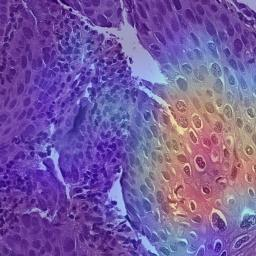

Image : C12_B033_S12_8.jpeg | Classe prédite : 2 | Classe réelle : 2


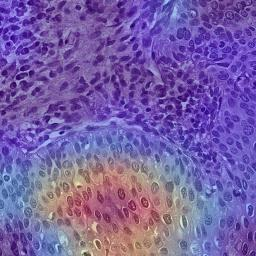

Image : C12_B033_S12_9.jpeg | Classe prédite : 2 | Classe réelle : 2


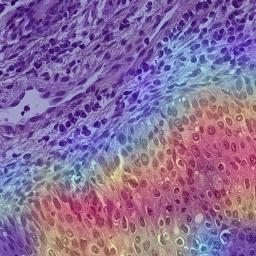

Image : C12_B011_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 2


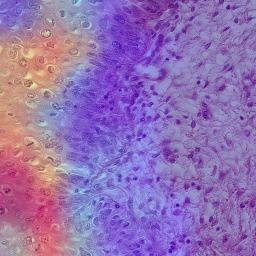

Image : C12_B011_S12_7.jpeg | Classe prédite : 2 | Classe réelle : 2


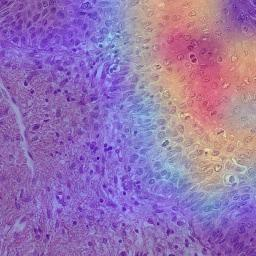

Image : C12_B010_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 1


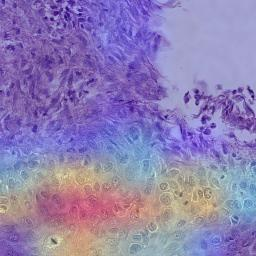

Image : C12_B016_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 1


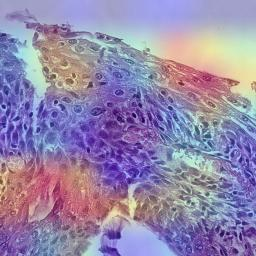

Image : C12_B015_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


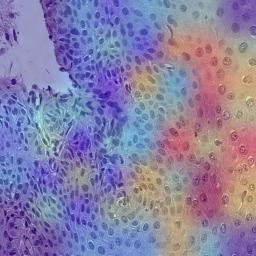

Image : C12_B014_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


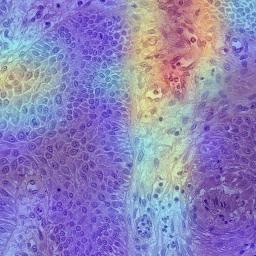

Image : C12_B013_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


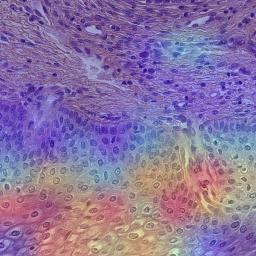

Image : C12_B013_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 1


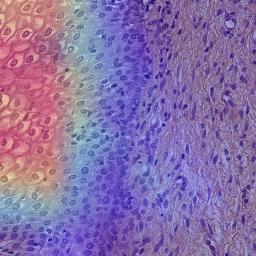

Image : C12_B012_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 1


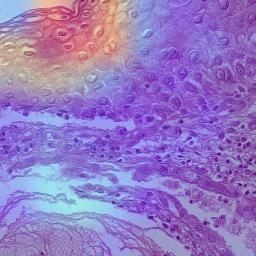

Image : C11_B008_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 1


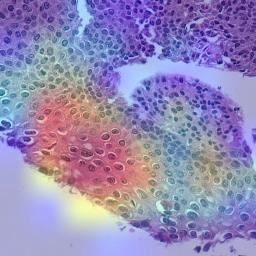

Image : C12_B337_S12_1.jpeg | Classe prédite : 0 | Classe réelle : 0


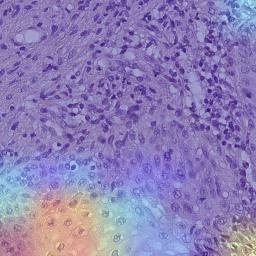

Image : C12_B028_S12_0.jpeg | Classe prédite : 0 | Classe réelle : 0


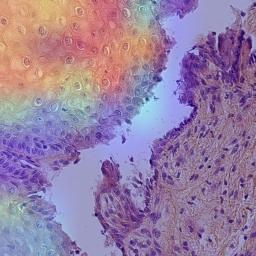

Image : C12_B028_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


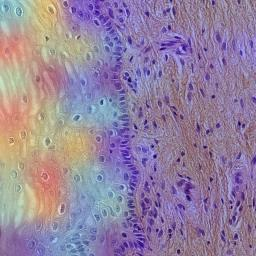

Image : C11_B111_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


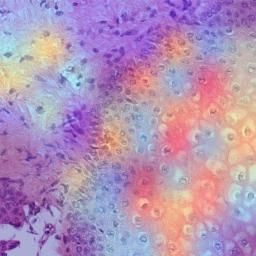

Image : C11_B069_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


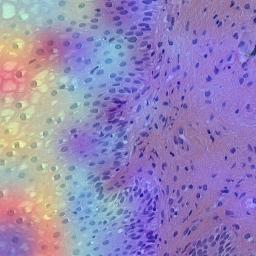

Image : C11_B019_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


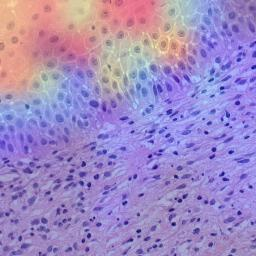

Image : C11_B134_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


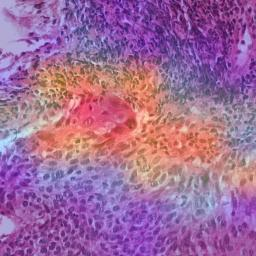

Image : C11_B144_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


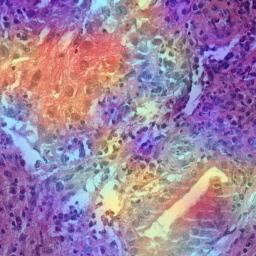

Image : C11_B131_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


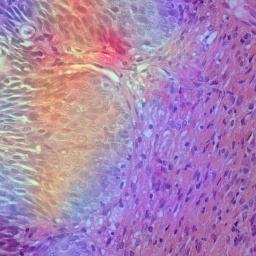

Image : C11_B130_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


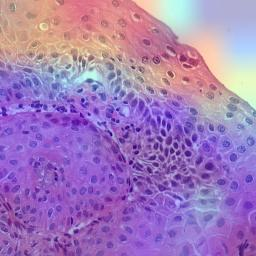

Image : C11_B085_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


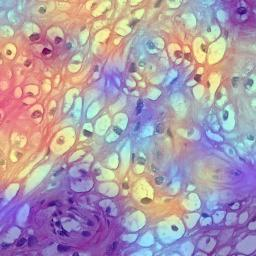

Image : C11_B044_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


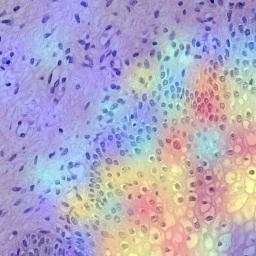

Image : C11_B022_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 0


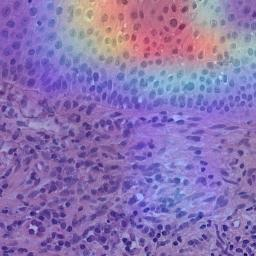

Image : C11_B132_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 0


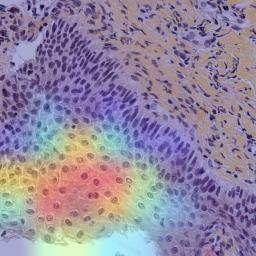

Image : C11_B132_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


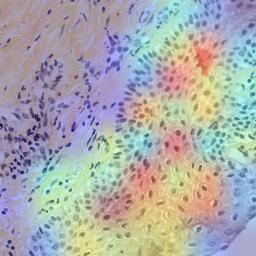

Image : C02_B209_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


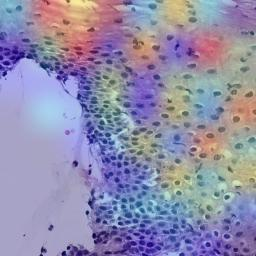

Image : C02_B209_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


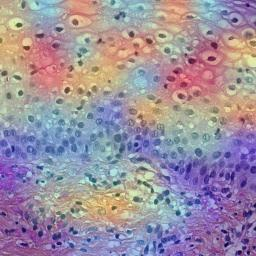

Image : C09_B062_S09_0.jpeg | Classe prédite : 3 | Classe réelle : 3


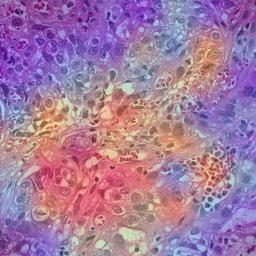

Image : C13_B434_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


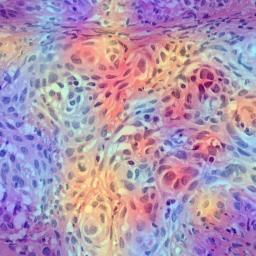

Image : C13_B434_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


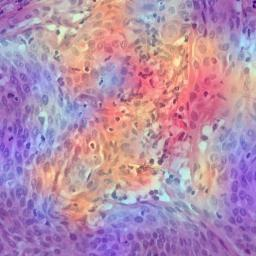

Image : C13_B434_S11_5.jpeg | Classe prédite : 3 | Classe réelle : 3


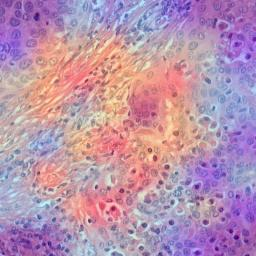

Image : C12_B340_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


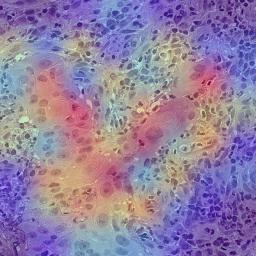

Image : C17_B088_S17_0.jpeg | Classe prédite : 3 | Classe réelle : 3


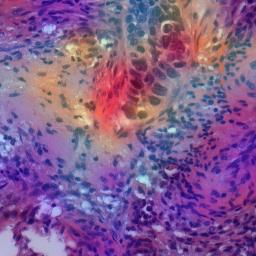

Image : C13_B414_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


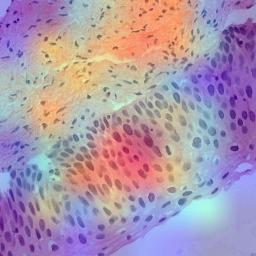

Image : C13_B414_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


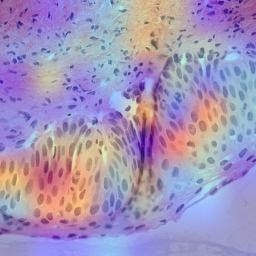

Image : C02_B208_S21_4.jpeg | Classe prédite : 2 | Classe réelle : 2


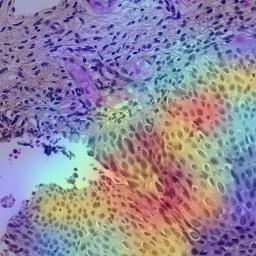

Image : C13_B413_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


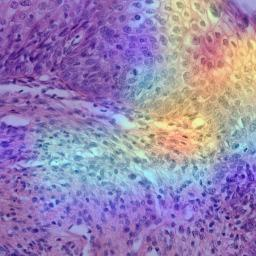

Image : C13_B413_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 1


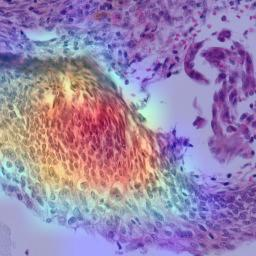

Image : C02_B214_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


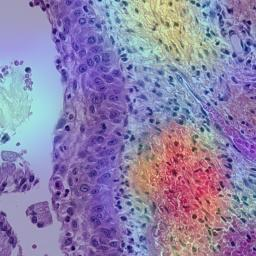

Image : C02_B214_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


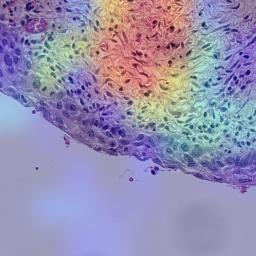

Image : C02_B210_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


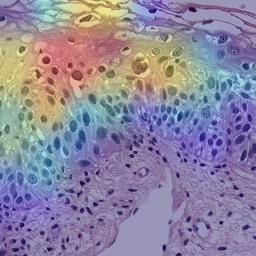

Image : C02_B210_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


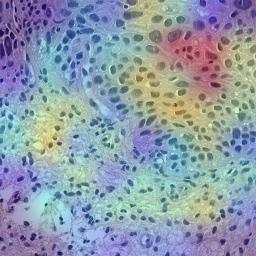

Image : C02_B210_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


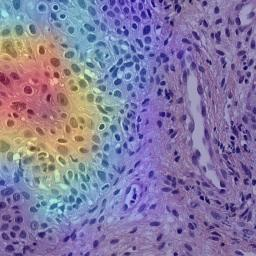

Image : C12_B343_S12_5.jpeg | Classe prédite : 0 | Classe réelle : 0


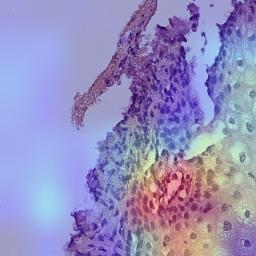

Image : C11_B052_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


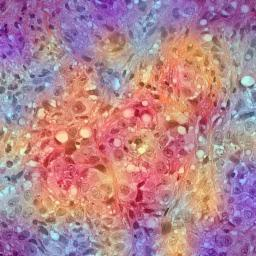

Image : C11_B140_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


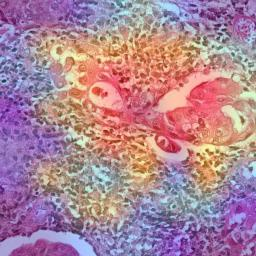

Image : C11_B140_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


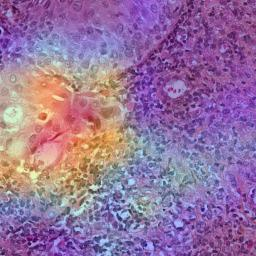

Image : C11_B140_S11_6.jpeg | Classe prédite : 3 | Classe réelle : 3


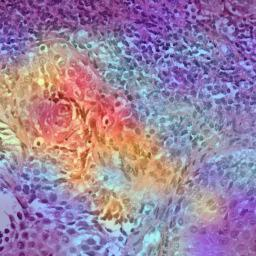

Image : C11_B140_S11_9.jpeg | Classe prédite : 3 | Classe réelle : 3


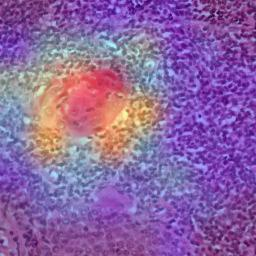

Image : C11_B097_S11_11.jpeg | Classe prédite : 3 | Classe réelle : 3


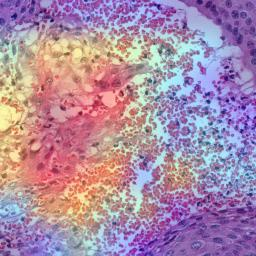

Image : C11_B063_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


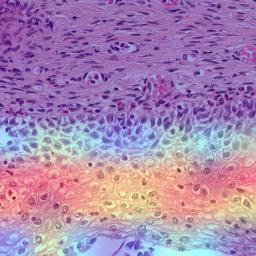

Image : C11_B063_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 1


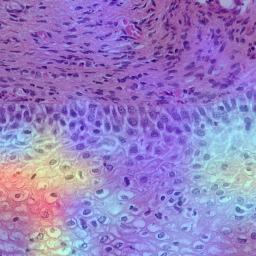

Image : C11_B027_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


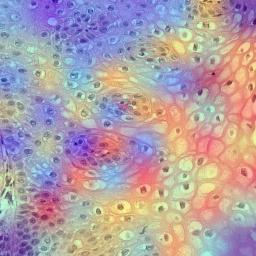

Image : C11_B061_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


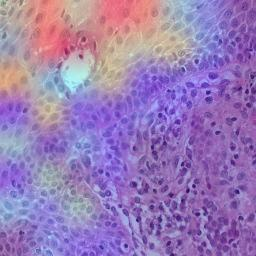

Image : C11_B061_S11_10.jpeg | Classe prédite : 0 | Classe réelle : 0


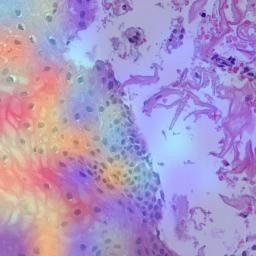

Image : C11_B095_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


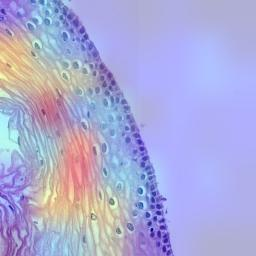

Image : C11_B035_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


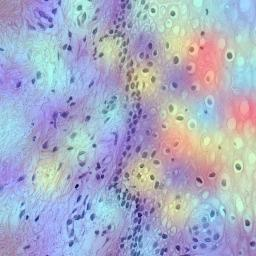

Image : C11_B059_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 1


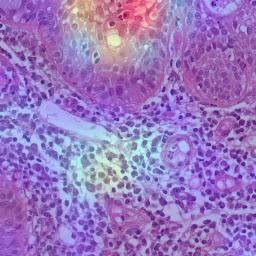

Image : C11_B020_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


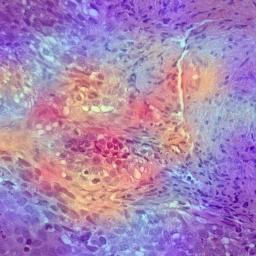

Image : C11_B107_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 1


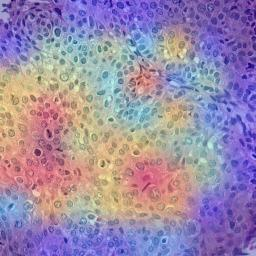

Image : C11_B107_S11_8.jpeg | Classe prédite : 1 | Classe réelle : 1


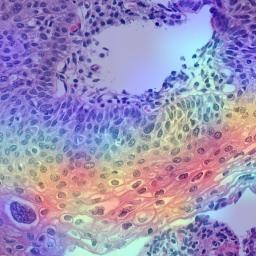

Image : C12_B151_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 2


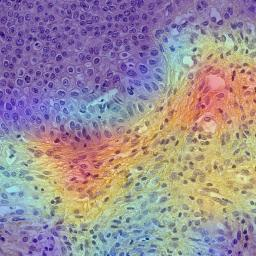

Image : C13_B168_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


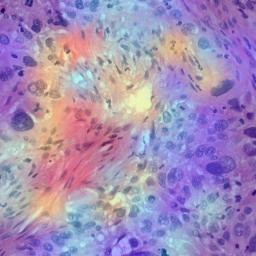

Image : C12_B145_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


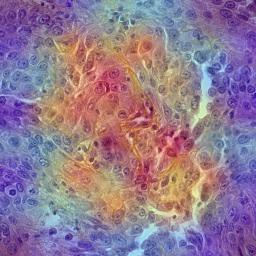

Image : C02_B256_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


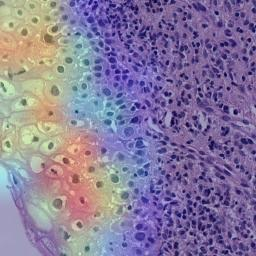

Image : C06_B093_S21_2.jpeg | Classe prédite : 1 | Classe réelle : 1


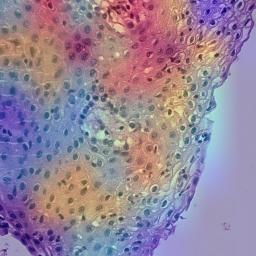

Image : C06_B080_S21_1.jpeg | Classe prédite : 2 | Classe réelle : 2


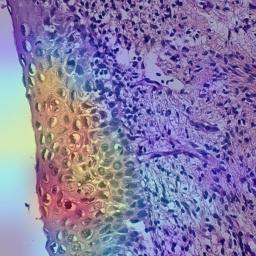

Image : C01_B266_S01_0.jpeg | Classe prédite : 3 | Classe réelle : 3


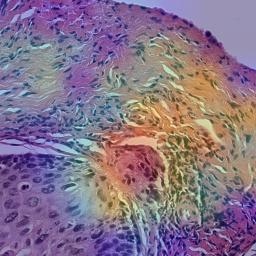

Image : C07_B099_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


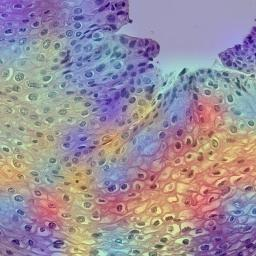

Image : C13_B168_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


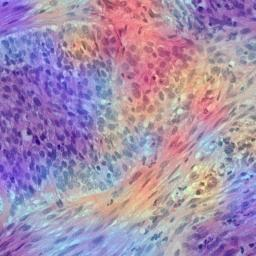

Image : C12_B153_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


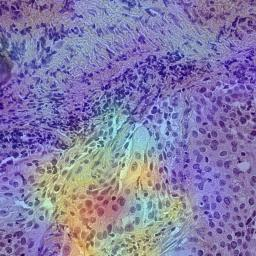

Image : C12_B145_S12_6.jpeg | Classe prédite : 3 | Classe réelle : 3


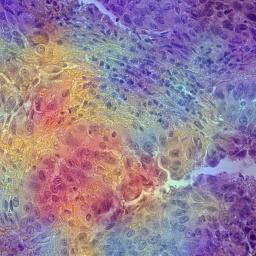

Image : C02_B257_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


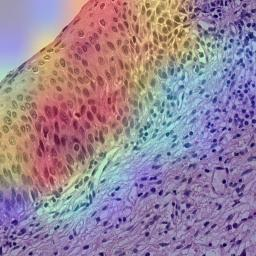

Image : C06_B105_S21_14.jpeg | Classe prédite : 2 | Classe réelle : 2


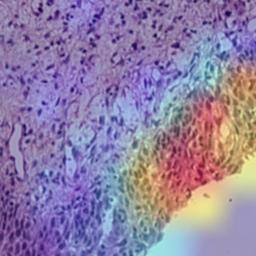

Image : C13_B176_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


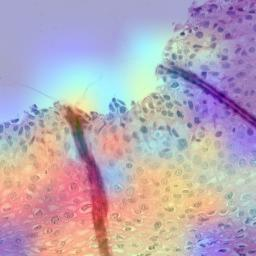

Image : C13_B164_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


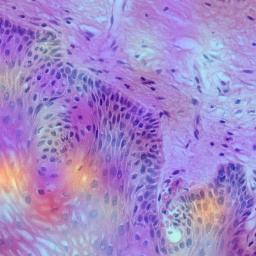

Image : C13_B164_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 1


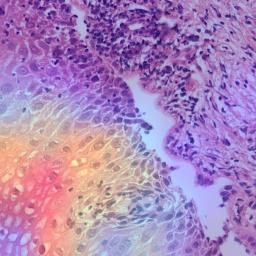

Image : C13_B182_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


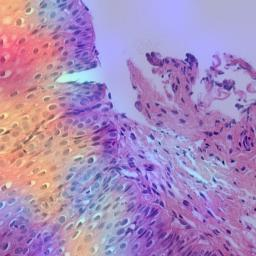

Image : C13_B178_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


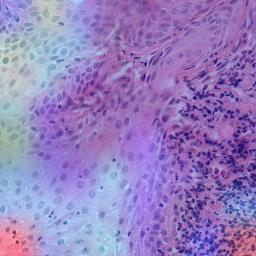

Image : C02_B255_S21_3.jpeg | Classe prédite : 0 | Classe réelle : 0


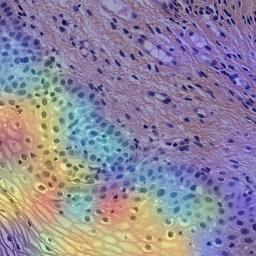

Image : C02_B254_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


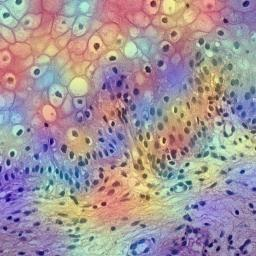

Image : C06_B084_S21_2.jpeg | Classe prédite : 0 | Classe réelle : 0


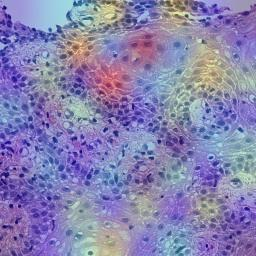

Image : C01_B266_S01_3.jpeg | Classe prédite : 3 | Classe réelle : 3


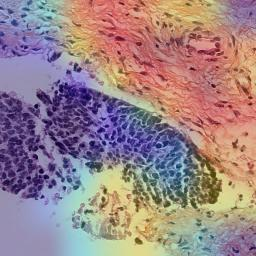

Image : C01_B220_S01_3.jpeg | Classe prédite : 3 | Classe réelle : 3


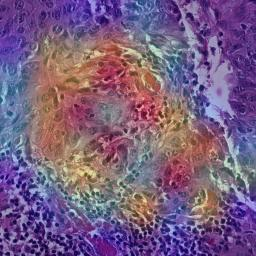

Image : C01_B220_S01_4.jpeg | Classe prédite : 3 | Classe réelle : 3


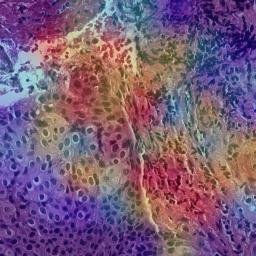

Image : C01_B310_S01_2.jpeg | Classe prédite : 1 | Classe réelle : 2


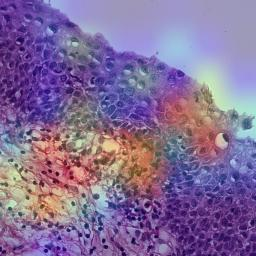

Image : C01_B217_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


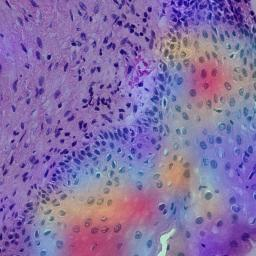

Image : C01_B326_S01_3.jpeg | Classe prédite : 1 | Classe réelle : 0


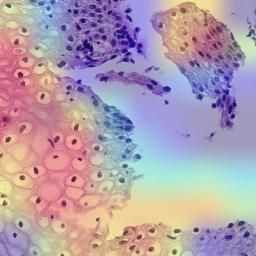

Image : C07_B044_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


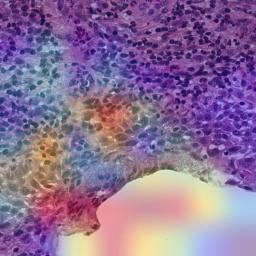

Image : C07_B003_S21_0.jpeg | Classe prédite : 3 | Classe réelle : 2


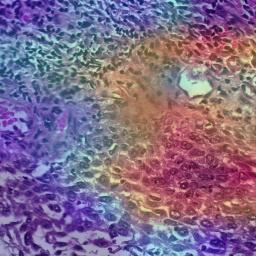

Image : C07_B003_S21_4.jpeg | Classe prédite : 2 | Classe réelle : 2


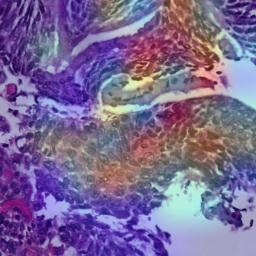

Image : C07_B075_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


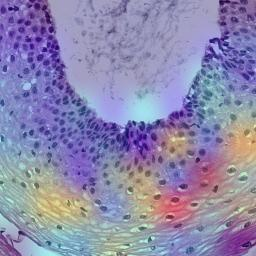

Image : C07_B002_S21_0.jpeg | Classe prédite : 1 | Classe réelle : 1


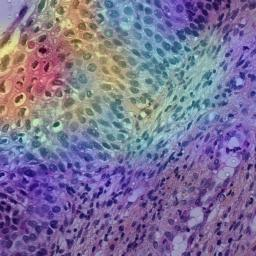

Image : C07_B002_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


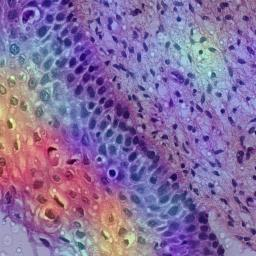

Image : C07_B039_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


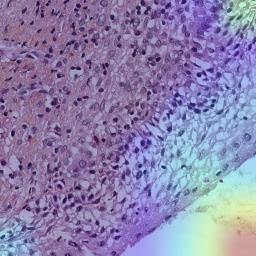

Image : C11_B042_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 2


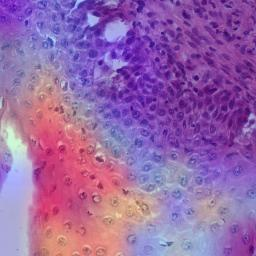

Image : C11_B125_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


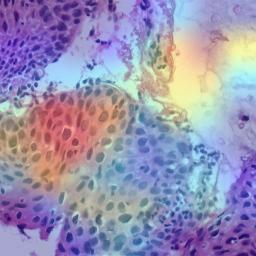

Image : C05_B102_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


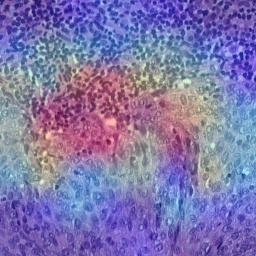

Image : C12_B402_S12_5.jpeg | Classe prédite : 2 | Classe réelle : 2


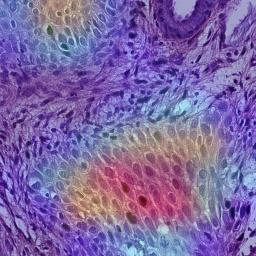

Image : C12_B404_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 2


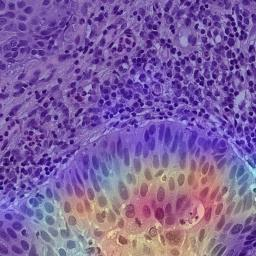

Image : C12_B404_S12_5.jpeg | Classe prédite : 2 | Classe réelle : 2


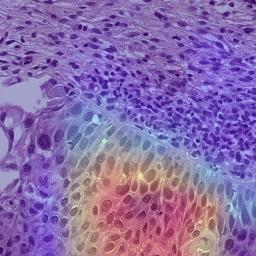

Image : C17_B018_S17_0.jpeg | Classe prédite : 1 | Classe réelle : 1


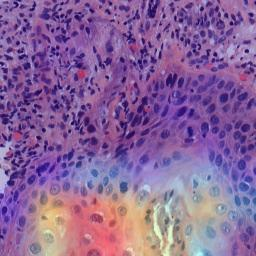

Image : C17_B018_S17_2.jpeg | Classe prédite : 1 | Classe réelle : 1


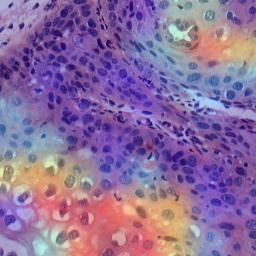

Image : C17_B018_S17_5.jpeg | Classe prédite : 1 | Classe réelle : 1


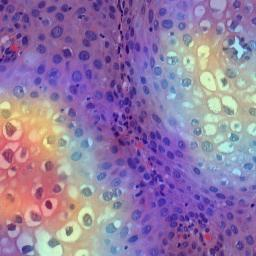

Image : C17_B014_S17_0.jpeg | Classe prédite : 1 | Classe réelle : 1


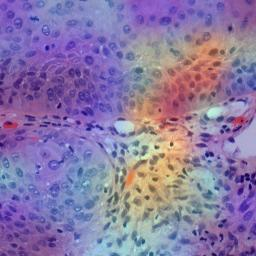

Image : C17_B009_S17_4.jpeg | Classe prédite : 1 | Classe réelle : 1


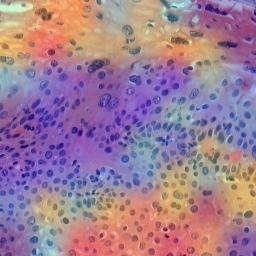

Image : C17_B008_S17_4.jpeg | Classe prédite : 1 | Classe réelle : 1


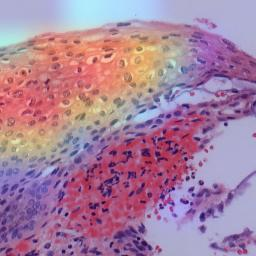

Image : C17_B007_S17_2.jpeg | Classe prédite : 1 | Classe réelle : 1


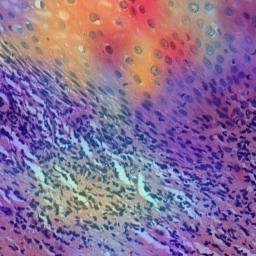

Image : C12_B403_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


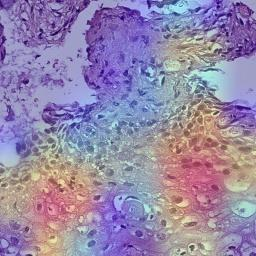

Image : C12_B401_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 2


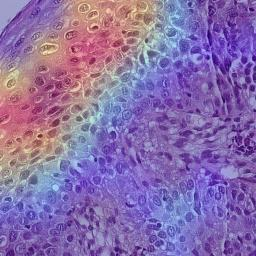

Image : C12_B409_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


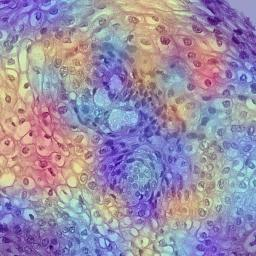

Image : C12_B409_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 1


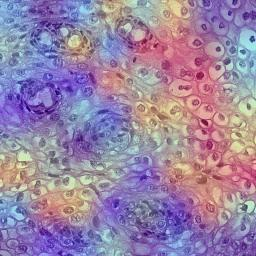

Image : C12_B395_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 1


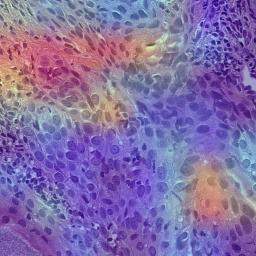

Image : C12_B394_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


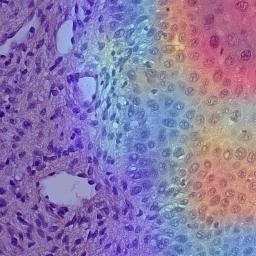

Image : C12_B385_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


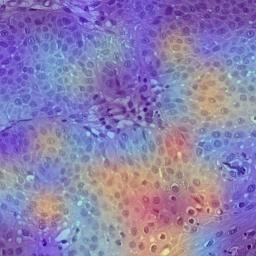

Image : C12_B382_S12_1.jpeg | Classe prédite : 0 | Classe réelle : 1


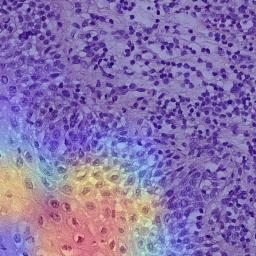

Image : C17_B100_S17_0.jpeg | Classe prédite : 1 | Classe réelle : 0


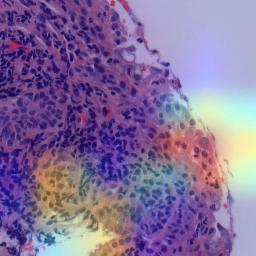

Image : C17_B100_S17_3.jpeg | Classe prédite : 3 | Classe réelle : 0


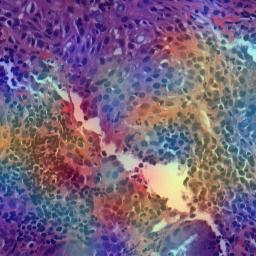

Image : C17_B095_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 0


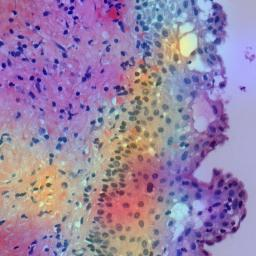

Image : C17_B017_S17_1.jpeg | Classe prédite : 0 | Classe réelle : 0


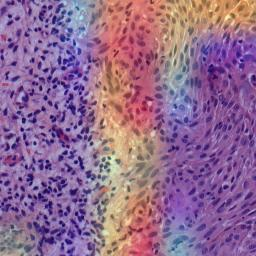

Image : C12_B408_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


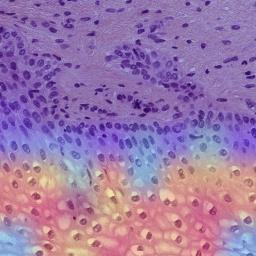

Image : C12_B408_S12_5.jpeg | Classe prédite : 0 | Classe réelle : 0


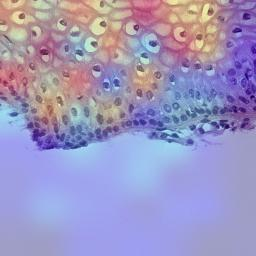

Image : C12_B400_S12_1.jpeg | Classe prédite : 0 | Classe réelle : 0


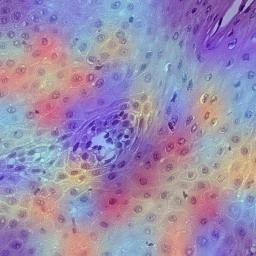

Image : C12_B399_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


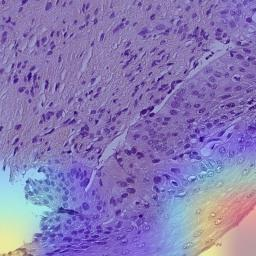

Image : C12_B393_S12_4.jpeg | Classe prédite : 0 | Classe réelle : 0


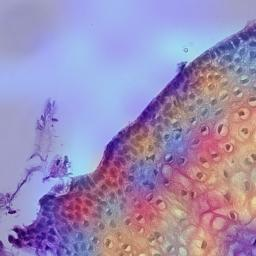

Image : C12_B390_S12_4.jpeg | Classe prédite : 0 | Classe réelle : 0


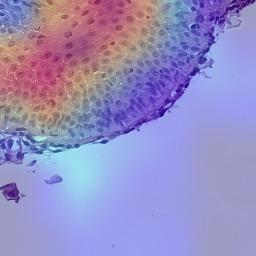

Image : C11_B024_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


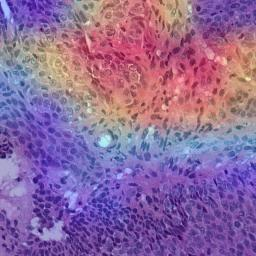

Image : C11_B091_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 0


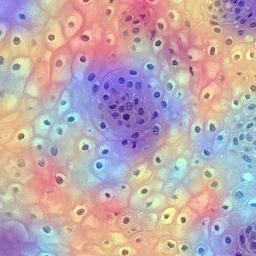

Image : C11_B091_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


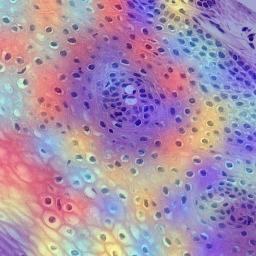

Image : C11_B100_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 1


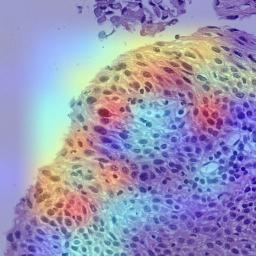

Image : C11_B100_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


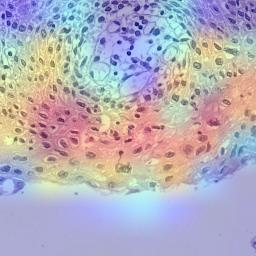

Image : C11_B099_S11_2.jpeg | Classe prédite : 3 | Classe réelle : 3


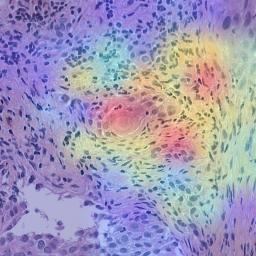

Image : C11_B121_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


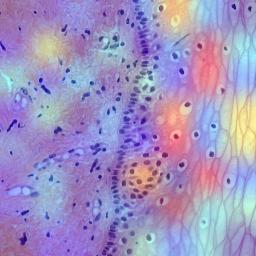

Image : C11_B121_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


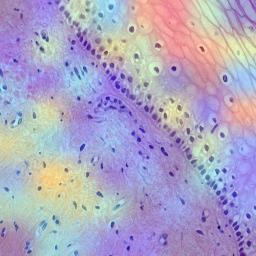

Image : C11_B050_S11_9.jpeg | Classe prédite : 3 | Classe réelle : 3


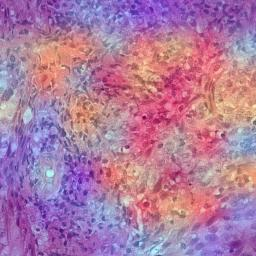

Image : C11_B068_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


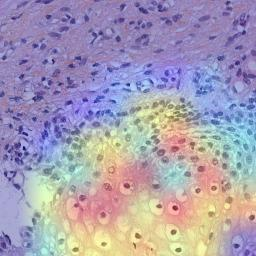

Image : C11_B028_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


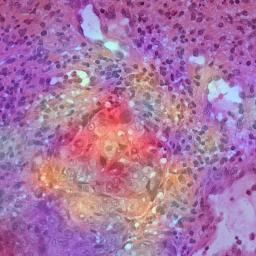

Image : C11_B028_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


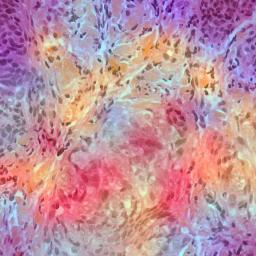

Image : C11_B138_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


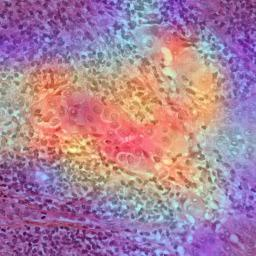

Image : C11_B138_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


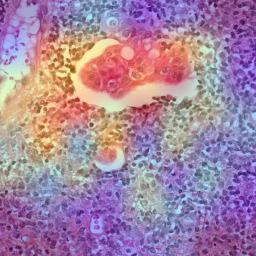

Image : C11_B138_S11_7.jpeg | Classe prédite : 3 | Classe réelle : 3


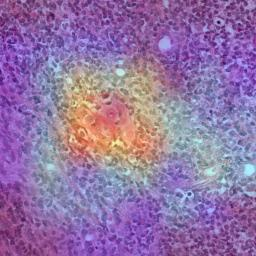

Image : C12_B211_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


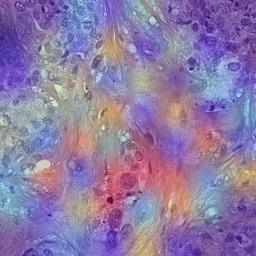

Image : C12_B206_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


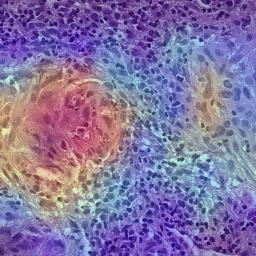

Image : C12_B204_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


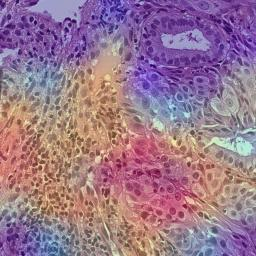

Image : C12_B204_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


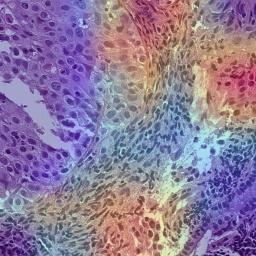

Image : C02_B276_S21_4.jpeg | Classe prédite : 2 | Classe réelle : 2


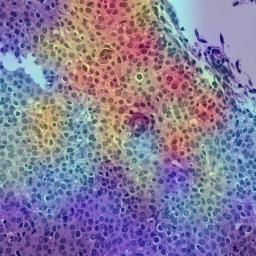

Image : C02_B276_S21_5.jpeg | Classe prédite : 2 | Classe réelle : 2


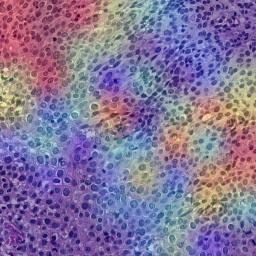

Image : C12_B570_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 0


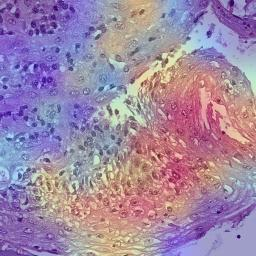

Image : C02_B277_S21_1.jpeg | Classe prédite : 2 | Classe réelle : 2


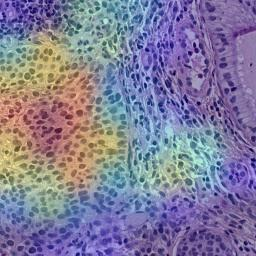

Image : C12_B203_S12_4.jpeg | Classe prédite : 3 | Classe réelle : 3


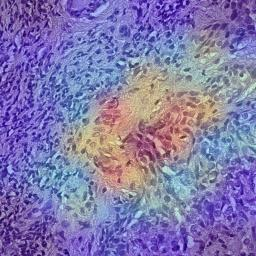

Image : C12_B205_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


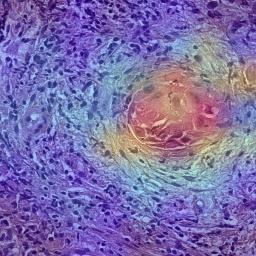

Image : C12_B205_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


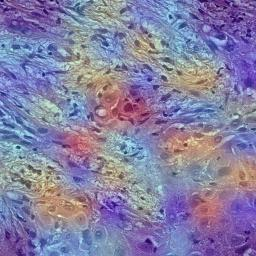

Image : C12_B205_S12_5.jpeg | Classe prédite : 3 | Classe réelle : 3


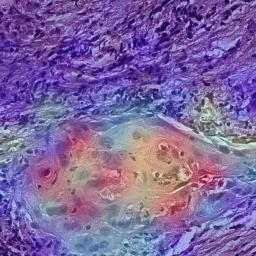

Image : C12_B207_S12_0.jpeg | Classe prédite : 2 | Classe réelle : 3


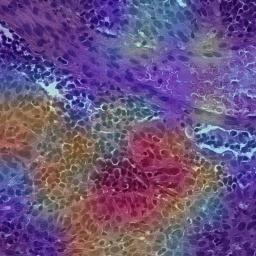

Image : C12_B207_S12_5.jpeg | Classe prédite : 3 | Classe réelle : 3


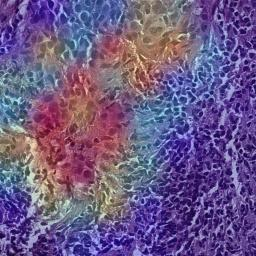

Image : C12_B212_S12_0.jpeg | Classe prédite : 3 | Classe réelle : 3


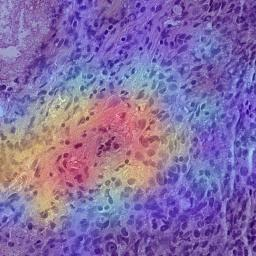

Image : C13_B289_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


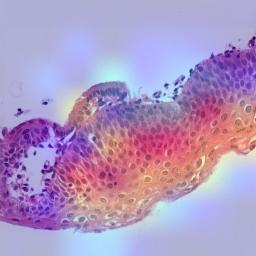

Image : C01_B362_S01_3.jpeg | Classe prédite : 2 | Classe réelle : 2


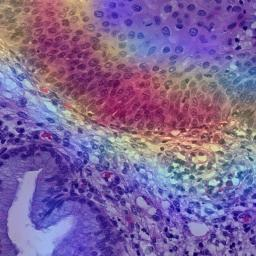

Image : C02_B275_S21_2.jpeg | Classe prédite : 2 | Classe réelle : 2


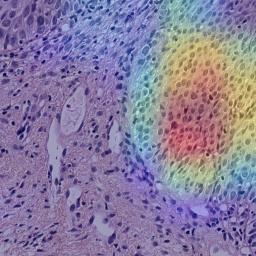

Image : C02_B276_S21_8.jpeg | Classe prédite : 2 | Classe réelle : 2


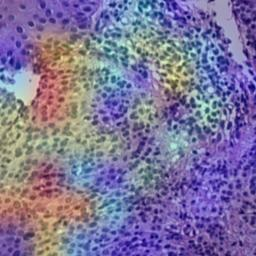

Image : C12_B209_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 1


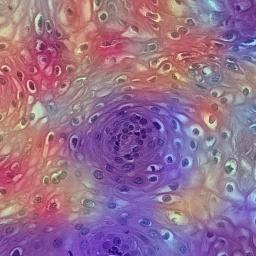

Image : C12_B215_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 1


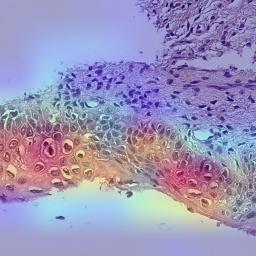

Image : C12_B561_S12_5.jpeg | Classe prédite : 2 | Classe réelle : 1


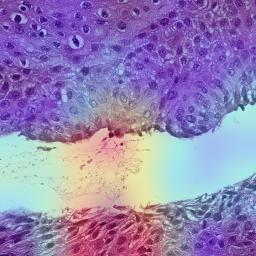

Image : C12_B562_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


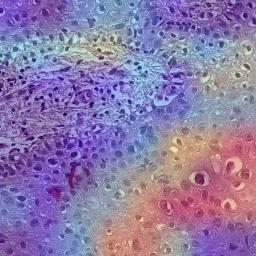

Image : C12_B562_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


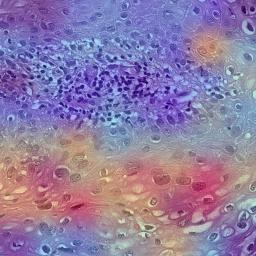

Image : C12_B562_S12_5.jpeg | Classe prédite : 1 | Classe réelle : 1


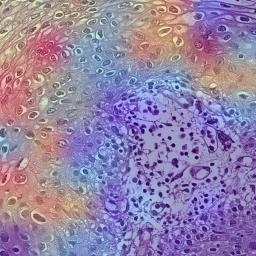

Image : C12_B563_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


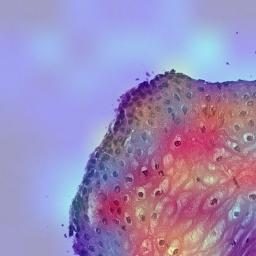

Image : C13_B275_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


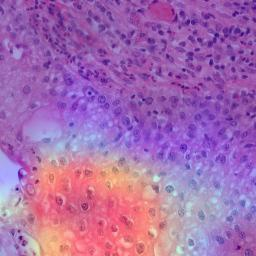

Image : C13_B277_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


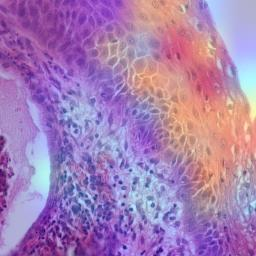

Image : C01_B200_S01_1.jpeg | Classe prédite : 2 | Classe réelle : 1


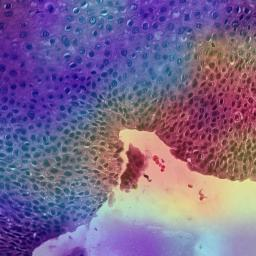

Image : C01_B200_S01_4.jpeg | Classe prédite : 1 | Classe réelle : 1


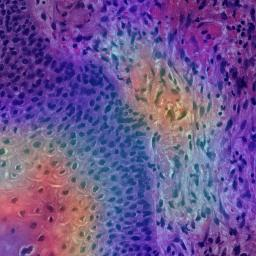

Image : C13_B296_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


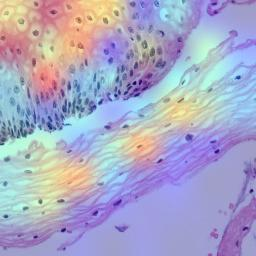

Image : C13_B294_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 0


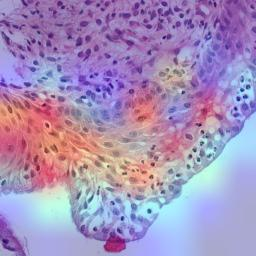

Image : C12_B570_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 0


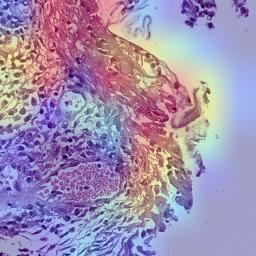

Image : C12_B570_S12_3.jpeg | Classe prédite : 1 | Classe réelle : 0


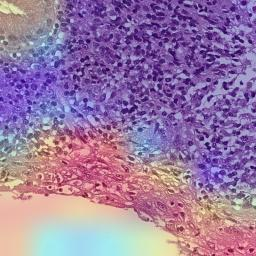

Image : C12_B570_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 0


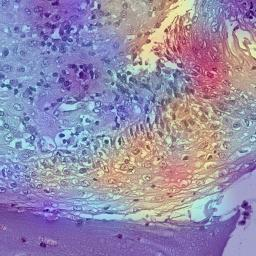

Image : C11_C049_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 1


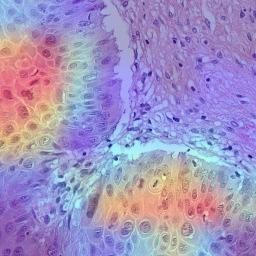

Image : C11_B105_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


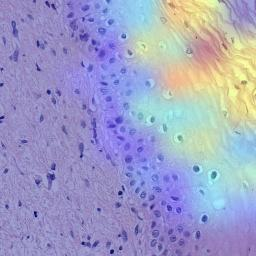

Image : C11_B105_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


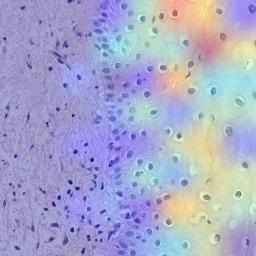

Image : C11_B089_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


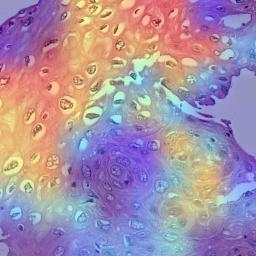

Image : C11_C049_S11_7.jpeg | Classe prédite : 2 | Classe réelle : 2


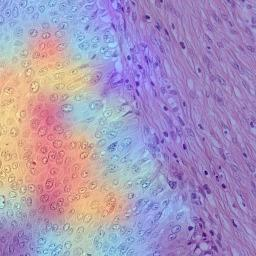

Image : C11_B023_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


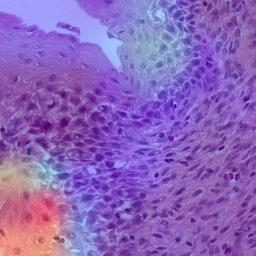

Image : C11_B034_S11_5.jpeg | Classe prédite : 1 | Classe réelle : 1


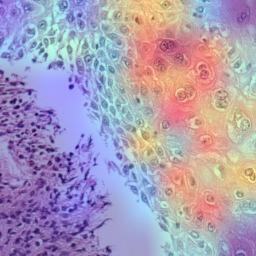

Image : C11_B127_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


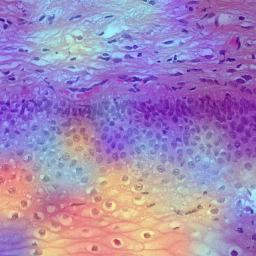

Image : C11_C015_S11_6.jpeg | Classe prédite : 2 | Classe réelle : 2


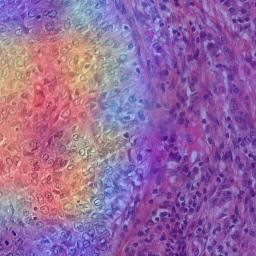

Image : C11_C015_S11_7.jpeg | Classe prédite : 1 | Classe réelle : 2


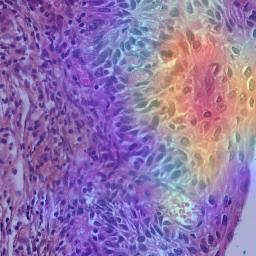

Image : C11_C025_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


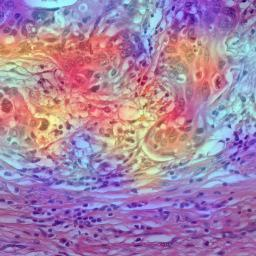

Image : C11_C025_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


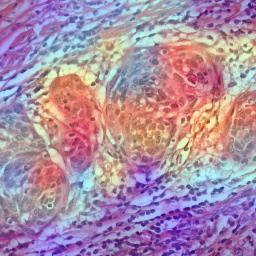

Image : C11_B080_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


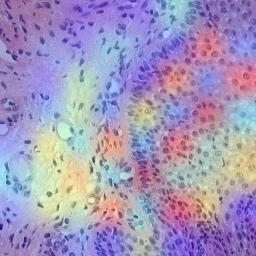

Image : C11_B071_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


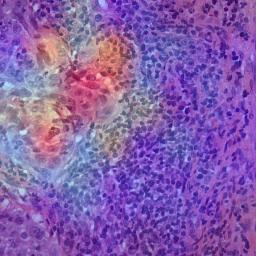

Image : C11_B084_S11_5.jpeg | Classe prédite : 3 | Classe réelle : 3


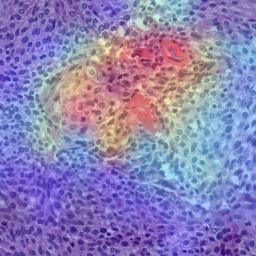

Image : C11_B038_S11_0.jpeg | Classe prédite : 3 | Classe réelle : 3


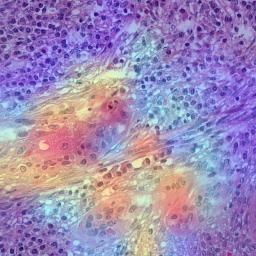

Image : C11_B075_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


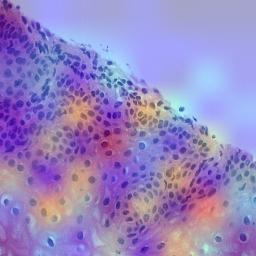

Image : C12_B267_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


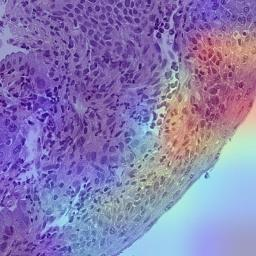

Image : C12_B264_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


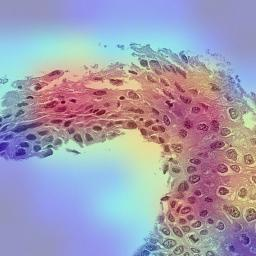

Image : C12_B266_S12_0.jpeg | Classe prédite : 0 | Classe réelle : 0


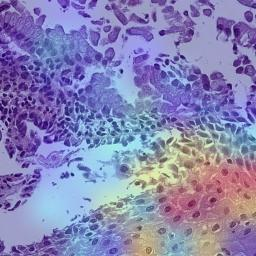

Image : C12_B265_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 0


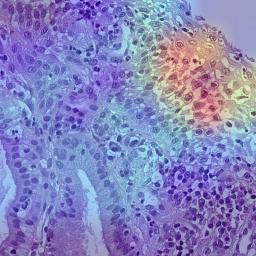

Image : C11_B038_S11_6.jpeg | Classe prédite : 1 | Classe réelle : 3


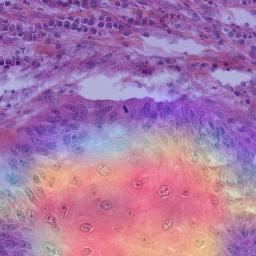

Image : C11_B071_S11_4.jpeg | Classe prédite : 3 | Classe réelle : 3


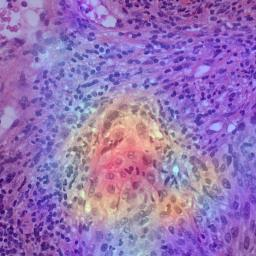

Image : C11_B079_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


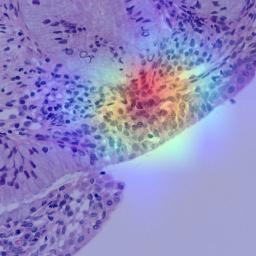

Image : C11_B079_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


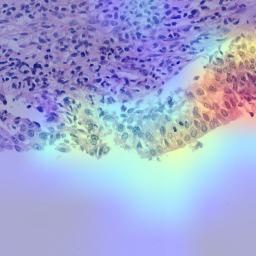

Image : C11_B104_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 1


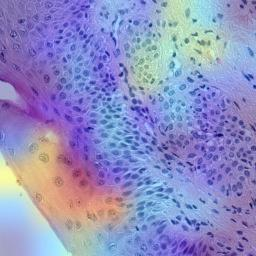

Image : C11_B014_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


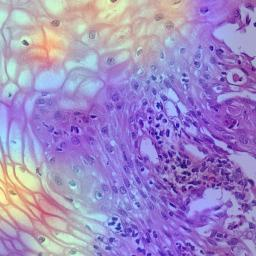

Image : C11_B015_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


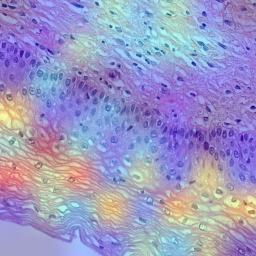

Image : C05_B031_S11_5.jpeg | Classe prédite : 3 | Classe réelle : 3


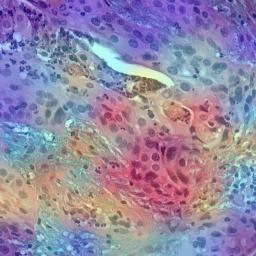

Image : C05_B031_S11_6.jpeg | Classe prédite : 3 | Classe réelle : 3


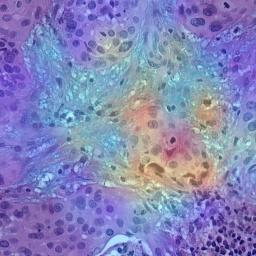

Image : C10_B061_S10_3.jpeg | Classe prédite : 3 | Classe réelle : 3


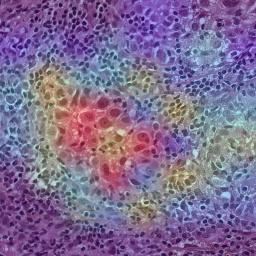

Image : C10_B066_S10_3.jpeg | Classe prédite : 2 | Classe réelle : 2


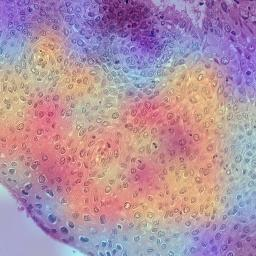

Image : C10_B065_S10_3.jpeg | Classe prédite : 2 | Classe réelle : 2


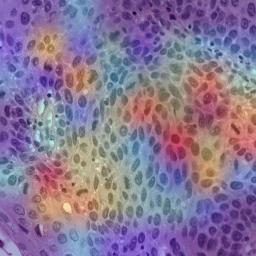

Image : C10_B064_S10_5.jpeg | Classe prédite : 2 | Classe réelle : 2


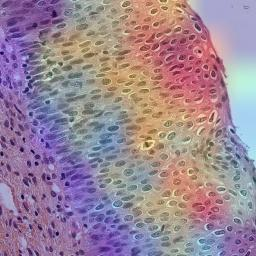

Image : C04_B036_S04_1.jpeg | Classe prédite : 2 | Classe réelle : 2


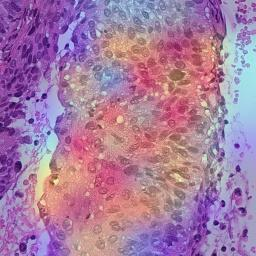

Image : C04_B033_S04_5.jpeg | Classe prédite : 2 | Classe réelle : 2


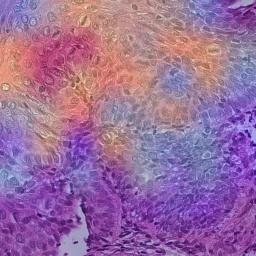

Image : C12_B069_S12_3.jpeg | Classe prédite : 2 | Classe réelle : 2


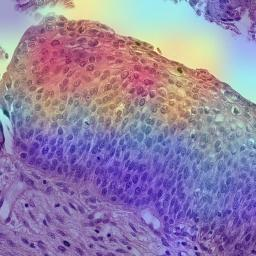

Image : C05_B038_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


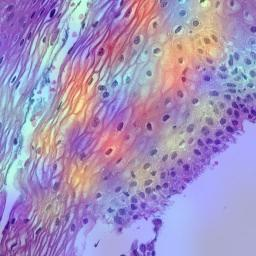

Image : C05_B038_S11_5.jpeg | Classe prédite : 1 | Classe réelle : 1


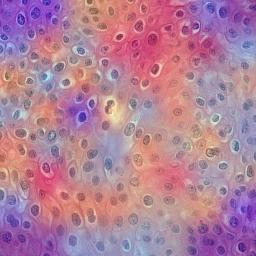

Image : C13_B051_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 1


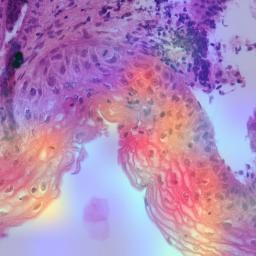

Image : C13_B046_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


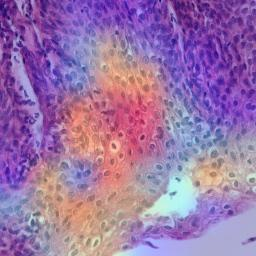

Image : C02_B139_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


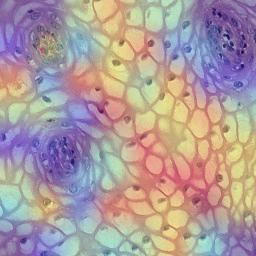

Image : C02_B121_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


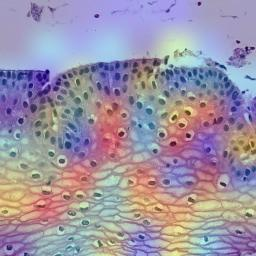

Image : C02_B113_S21_8.jpeg | Classe prédite : 1 | Classe réelle : 1


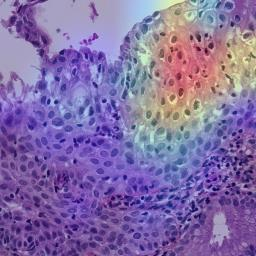

Image : C13_B050_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


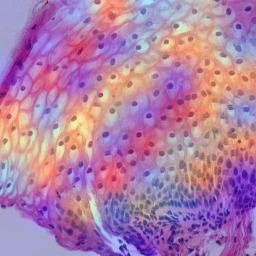

Image : C03_B007_S03_1.jpeg | Classe prédite : 0 | Classe réelle : 0


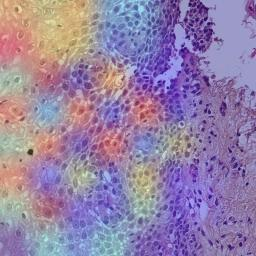

Image : C03_B006_S03_2.jpeg | Classe prédite : 0 | Classe réelle : 0


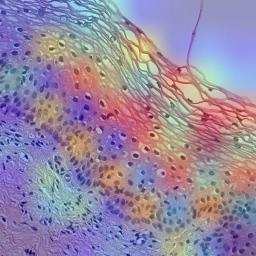

Image : C03_B006_S03_5.jpeg | Classe prédite : 0 | Classe réelle : 0


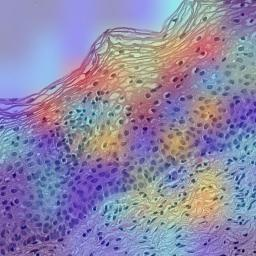

Image : C03_B005_S03_5.jpeg | Classe prédite : 0 | Classe réelle : 0


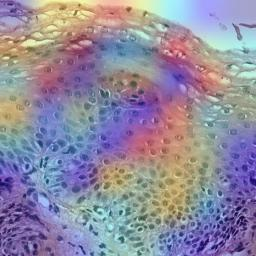

Image : C03_B002_S03_0.jpeg | Classe prédite : 0 | Classe réelle : 0


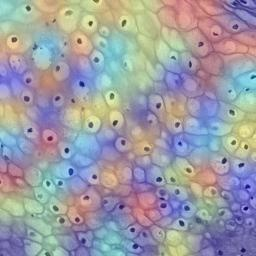

Image : C03_B002_S03_2.jpeg | Classe prédite : 0 | Classe réelle : 0


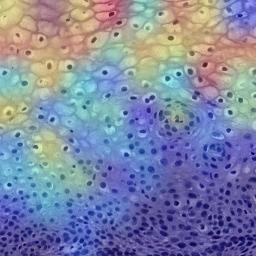

Image : C03_B002_S03_4.jpeg | Classe prédite : 0 | Classe réelle : 0


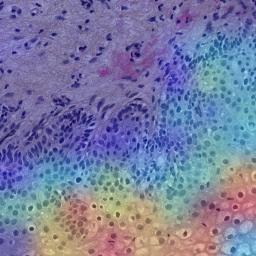

Image : C05_B030_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


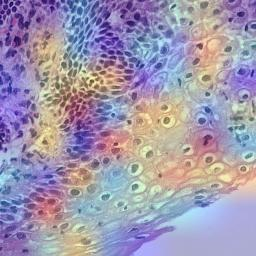

Image : C05_B025_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


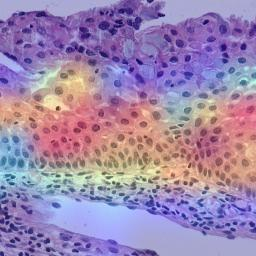

Image : C05_B025_S11_7.jpeg | Classe prédite : 1 | Classe réelle : 0


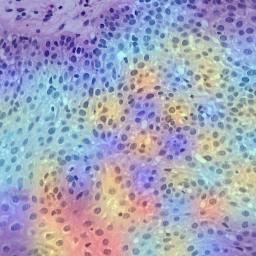

Image : C12_B073_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


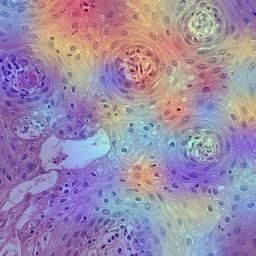

Image : C12_B073_S12_5.jpeg | Classe prédite : 1 | Classe réelle : 0


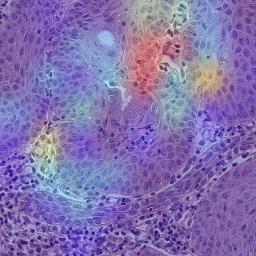

Image : C12_B071_S12_0.jpeg | Classe prédite : 0 | Classe réelle : 0


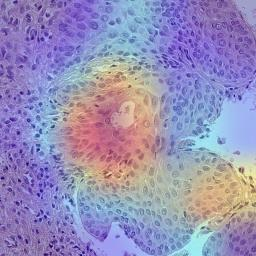

Image : C12_B071_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 0


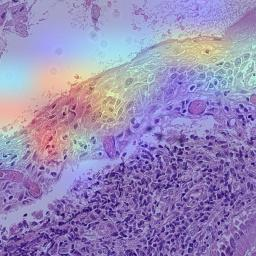

Image : C12_B068_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


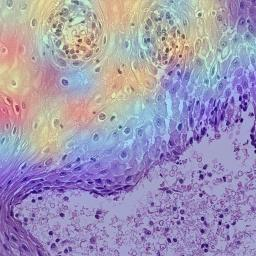

Image : C13_B029_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 2


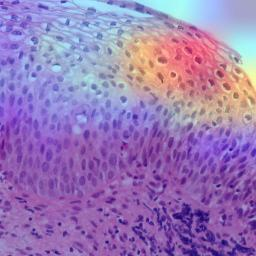

Image : C10_B003_S10_2.jpeg | Classe prédite : 3 | Classe réelle : 0


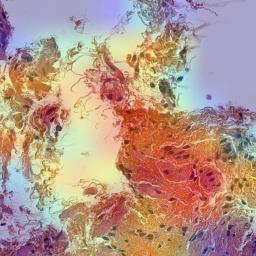

Image : C10_B003_S10_3.jpeg | Classe prédite : 0 | Classe réelle : 0


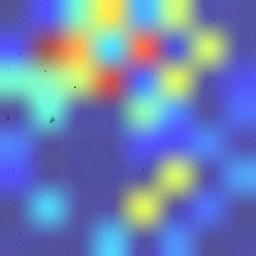

Image : C13_B039_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


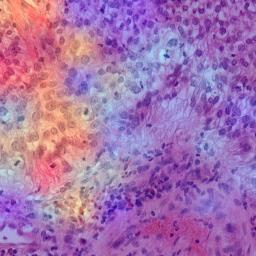

Image : C04_B031_S04_1.jpeg | Classe prédite : 3 | Classe réelle : 3


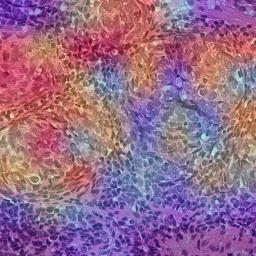

Image : C04_B031_S04_5.jpeg | Classe prédite : 3 | Classe réelle : 3


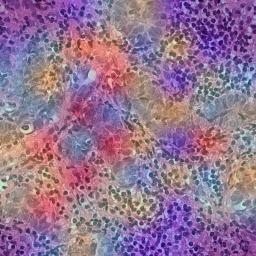

Image : C02_B161_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


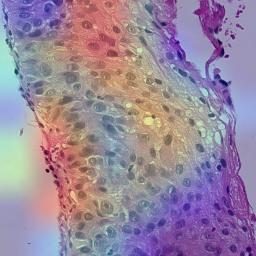

Image : C02_B161_S21_5.jpeg | Classe prédite : 3 | Classe réelle : 3


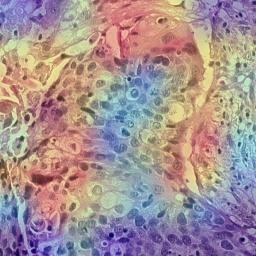

Image : C12_B057_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


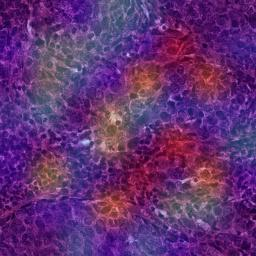

Image : C16_B104_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


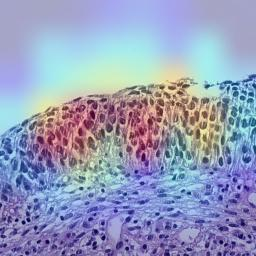

Image : C02_B143_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 2


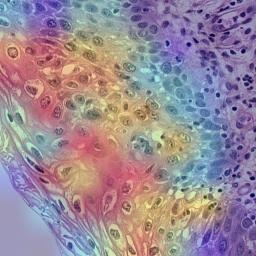

Image : C16_B105_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


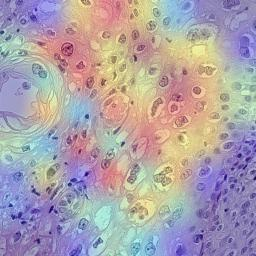

Image : C05_B072_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


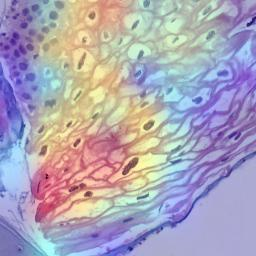

Image : C13_B036_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 1


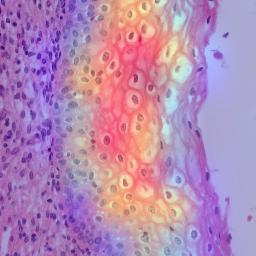

Image : C02_B144_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


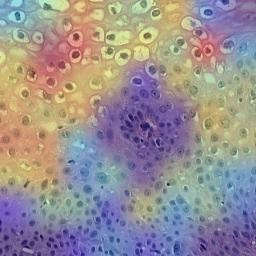

Image : C12_B058_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 1


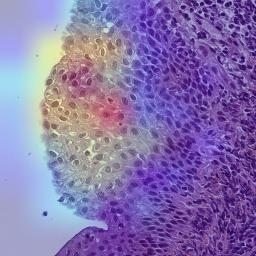

Image : C05_B065_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


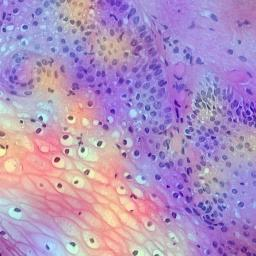

Image : C05_B065_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


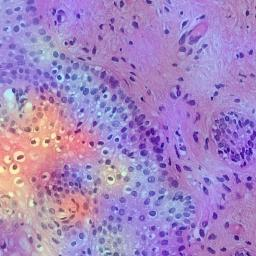

Image : C05_B063_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


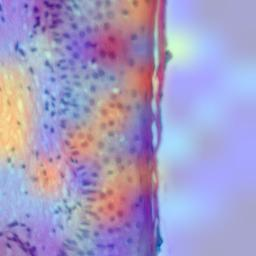

Image : C05_B063_S11_7.jpeg | Classe prédite : 0 | Classe réelle : 0


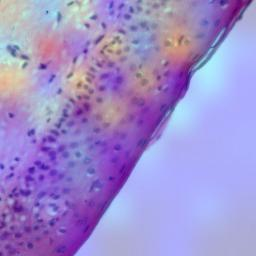

Image : C05_B064_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


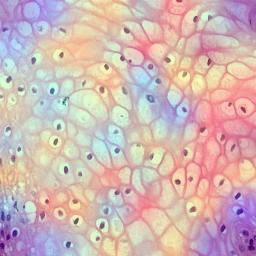

Image : C05_B064_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


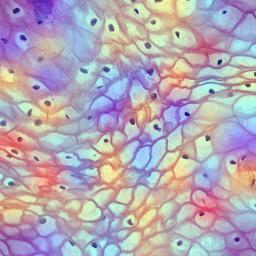

Image : C05_B061_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


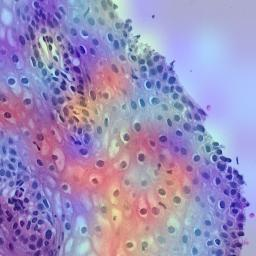

Image : C05_B059_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


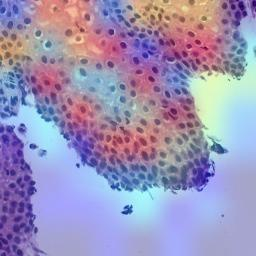

Image : C05_B059_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


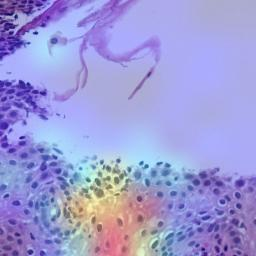

Image : C05_B052_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


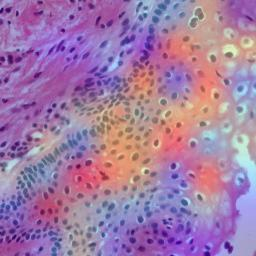

Image : C05_B052_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


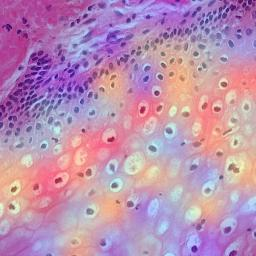

Image : C05_B052_S11_5.jpeg | Classe prédite : 0 | Classe réelle : 0


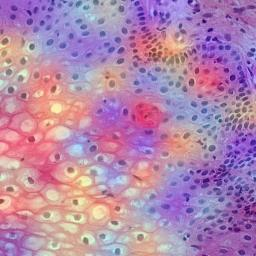

Image : C05_B052_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


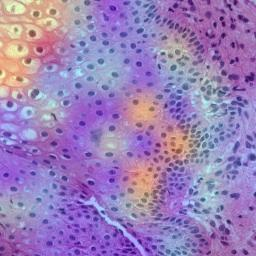

Image : C05_B053_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


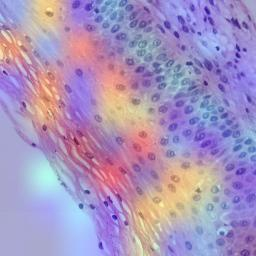

Image : C13_B035_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


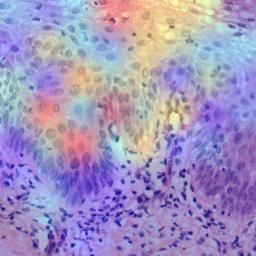

Image : C13_B035_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


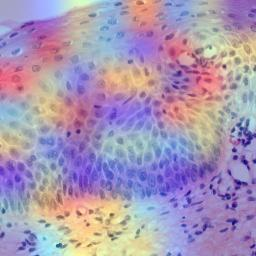

Image : C13_B035_S11_6.jpeg | Classe prédite : 0 | Classe réelle : 0


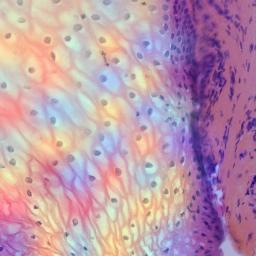

Image : C13_B034_S11_9.jpeg | Classe prédite : 0 | Classe réelle : 0


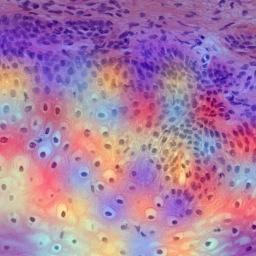

Image : C13_B031_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


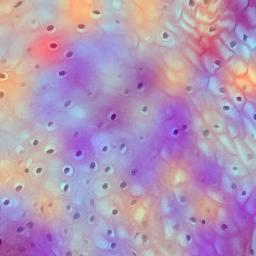

Image : C13_B031_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 0


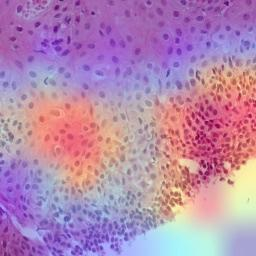

Image : C13_B031_S11_4.jpeg | Classe prédite : 0 | Classe réelle : 0


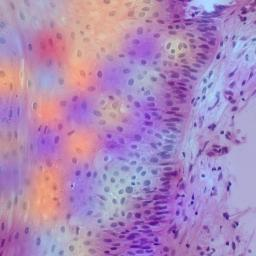

Image : C13_B026_S11_1.jpeg | Classe prédite : 0 | Classe réelle : 0


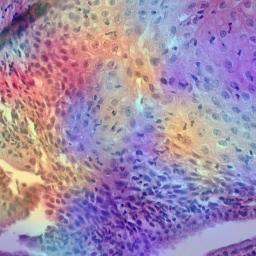

Image : C04_B027_S04_1.jpeg | Classe prédite : 0 | Classe réelle : 0


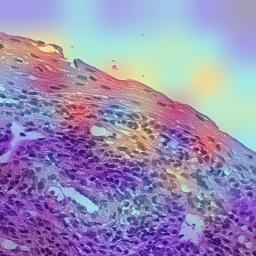

Image : C04_B027_S04_4.jpeg | Classe prédite : 0 | Classe réelle : 0


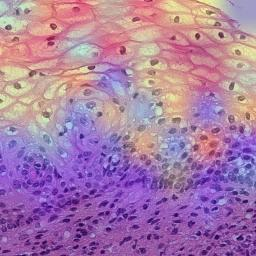

Image : C04_B027_S04_7.jpeg | Classe prédite : 0 | Classe réelle : 0


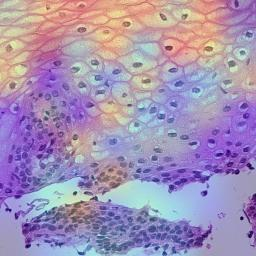

Image : C02_B150_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


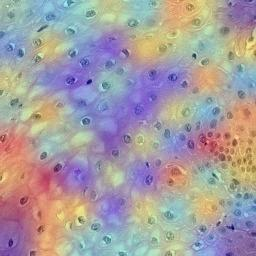

Image : C02_B150_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 0


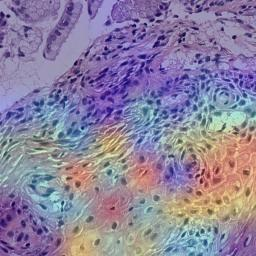

Image : C02_B149_S21_1.jpeg | Classe prédite : 0 | Classe réelle : 0


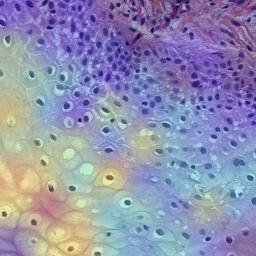

Image : C02_B149_S21_5.jpeg | Classe prédite : 0 | Classe réelle : 0


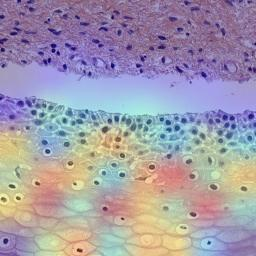

Image : C02_B149_S21_6.jpeg | Classe prédite : 0 | Classe réelle : 0


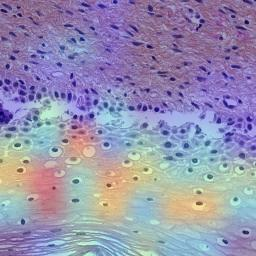

Image : C02_B149_S21_7.jpeg | Classe prédite : 0 | Classe réelle : 0


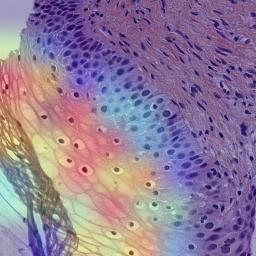

Image : C02_B149_S21_8.jpeg | Classe prédite : 0 | Classe réelle : 0


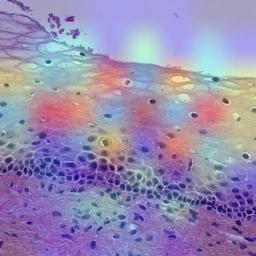

Image : C02_B149_S21_9.jpeg | Classe prédite : 0 | Classe réelle : 0


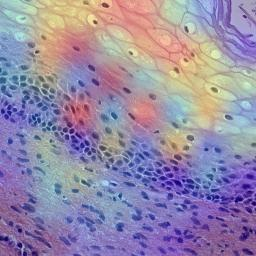

Image : C12_B059_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 0


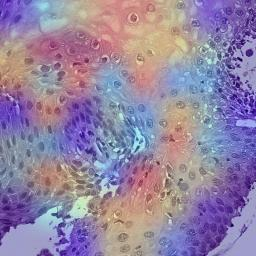

Image : C12_B052_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 0


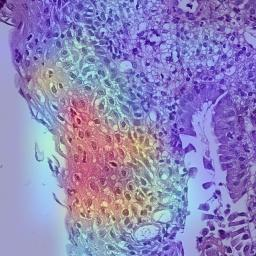

Image : C12_B052_S12_3.jpeg | Classe prédite : 0 | Classe réelle : 0


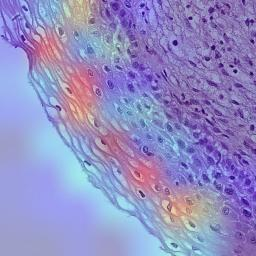

Image : C12_B052_S12_7.jpeg | Classe prédite : 1 | Classe réelle : 0


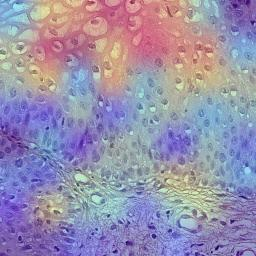

Image : C13_B365_S11_2.jpeg | Classe prédite : 0 | Classe réelle : 0


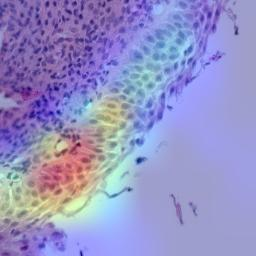

Image : C09_B020_S09_0.jpeg | Classe prédite : 3 | Classe réelle : 3


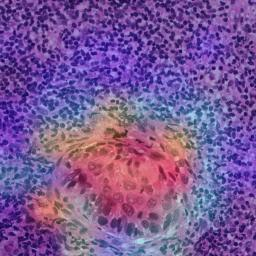

Image : C17_B034_S17_0.jpeg | Classe prédite : 2 | Classe réelle : 2


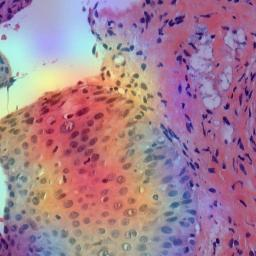

Image : C13_B376_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


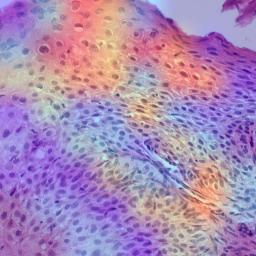

Image : C13_B360_S11_1.jpeg | Classe prédite : 3 | Classe réelle : 3


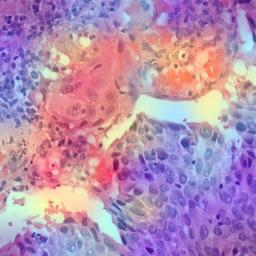

Image : C13_B367_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 3


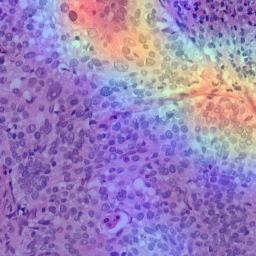

Image : C19_B038_S21_1.jpeg | Classe prédite : 3 | Classe réelle : 3


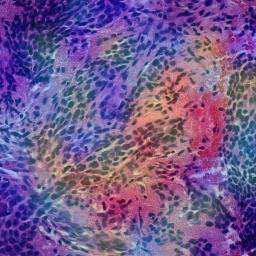

Image : C17_B038_S17_2.jpeg | Classe prédite : 3 | Classe réelle : 3


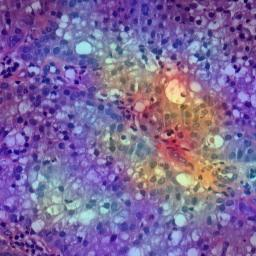

Image : C17_B042_S17_0.jpeg | Classe prédite : 3 | Classe réelle : 3


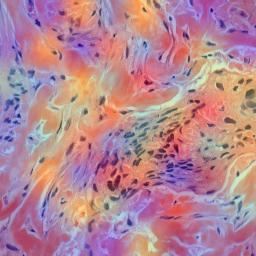

Image : C09_B017_S09_1.jpeg | Classe prédite : 3 | Classe réelle : 3


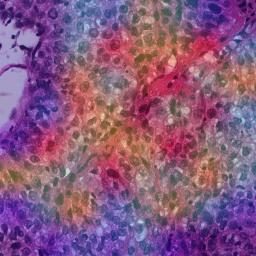

Image : C09_B017_S09_2.jpeg | Classe prédite : 3 | Classe réelle : 3


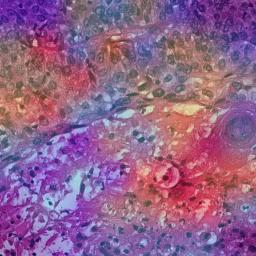

Image : C09_B021_S09_1.jpeg | Classe prédite : 1 | Classe réelle : 1


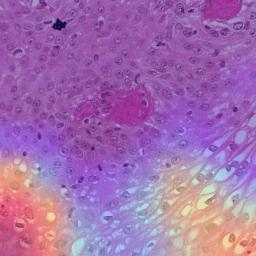

Image : C09_B023_S09_2.jpeg | Classe prédite : 3 | Classe réelle : 3


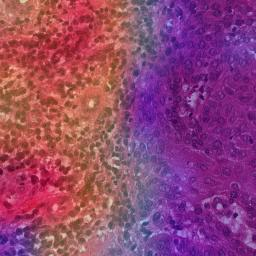

Image : C19_B042_S21_5.jpeg | Classe prédite : 2 | Classe réelle : 2


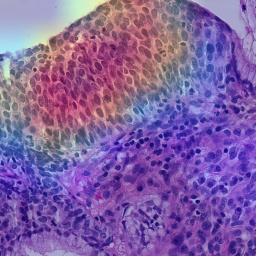

Image : C17_B031_S17_0.jpeg | Classe prédite : 2 | Classe réelle : 2


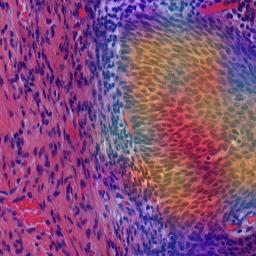

Image : C17_B032_S17_3.jpeg | Classe prédite : 2 | Classe réelle : 2


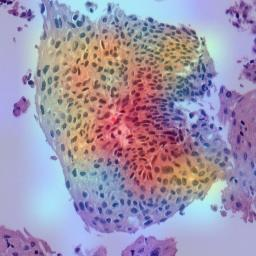

Image : C09_B013_S09_4.jpeg | Classe prédite : 3 | Classe réelle : 2


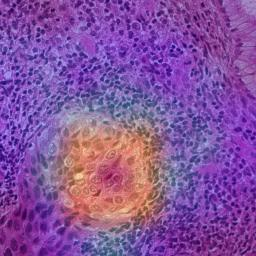

Image : C09_B014_S09_8.jpeg | Classe prédite : 1 | Classe réelle : 1


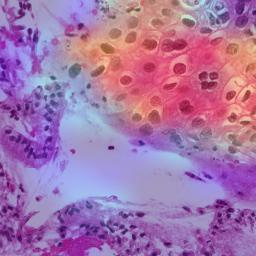

Image : C13_B358_S11_5.jpeg | Classe prédite : 3 | Classe réelle : 3


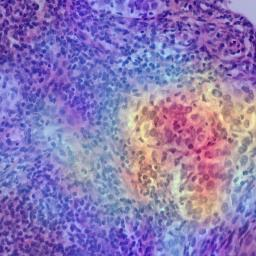

Image : C13_B376_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


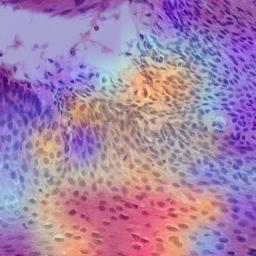

Image : C17_B033_S17_0.jpeg | Classe prédite : 1 | Classe réelle : 1


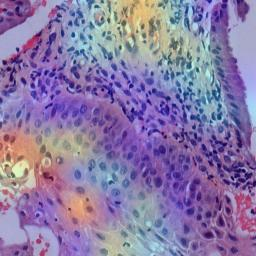

Image : C17_B033_S17_1.jpeg | Classe prédite : 1 | Classe réelle : 1


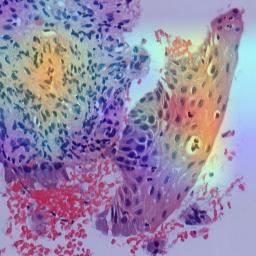

Image : C17_B039_S17_0.jpeg | Classe prédite : 1 | Classe réelle : 1


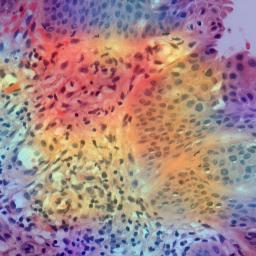

Image : C13_B364_S11_4.jpeg | Classe prédite : 2 | Classe réelle : 2


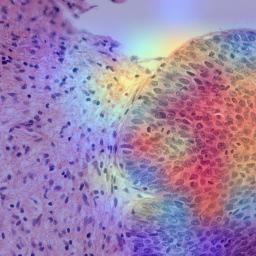

Image : C19_B040_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


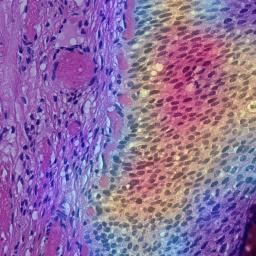

Image : C13_B354_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 0


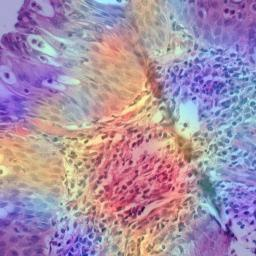

Image : C13_B354_S11_2.jpeg | Classe prédite : 1 | Classe réelle : 0


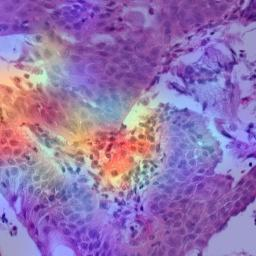

Image : C13_B361_S11_3.jpeg | Classe prédite : 0 | Classe réelle : 0


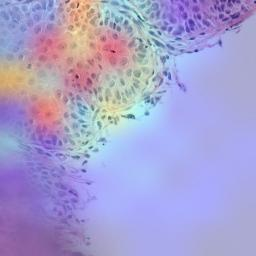

Image : C17_B050_S17_2.jpeg | Classe prédite : 0 | Classe réelle : 0


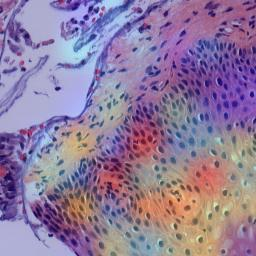

Image : C09_B001_S09_1.jpeg | Classe prédite : 0 | Classe réelle : 0


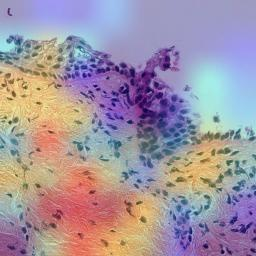

Image : C02_B301_S21_3.jpeg | Classe prédite : 1 | Classe réelle : 1


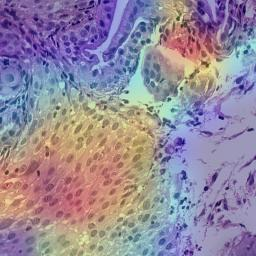

Image : C02_B302_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


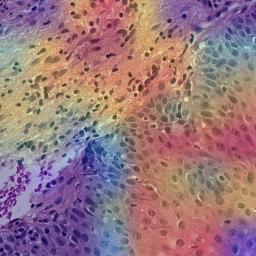

Image : C02_B302_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 1


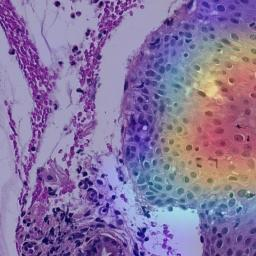

Image : C13_B236_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


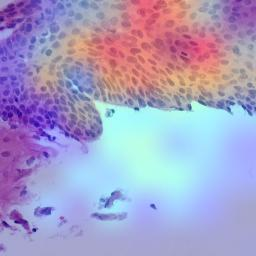

Image : C13_B233_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


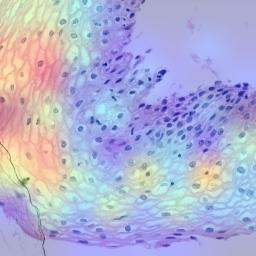

Image : C13_B218_S11_3.jpeg | Classe prédite : 3 | Classe réelle : 3


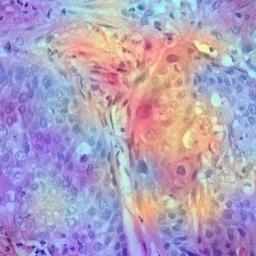

Image : C06_B022_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 3


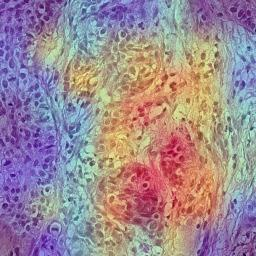

Image : C12_B186_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


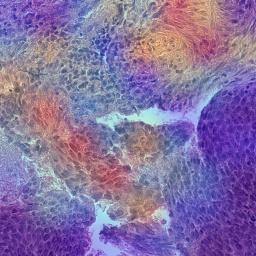

Image : C12_B186_S12_2.jpeg | Classe prédite : 3 | Classe réelle : 3


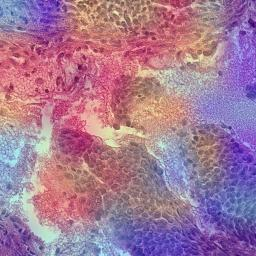

Image : C12_B185_S12_2.jpeg | Classe prédite : 2 | Classe réelle : 3


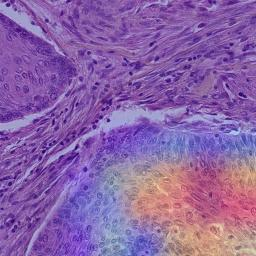

Image : C12_B184_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


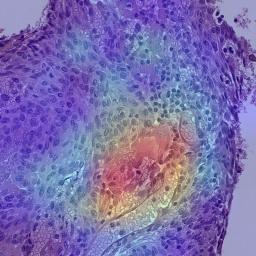

Image : C12_B183_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


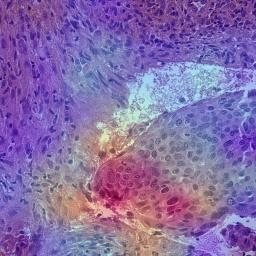

Image : C12_B181_S12_1.jpeg | Classe prédite : 3 | Classe réelle : 3


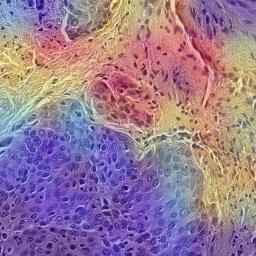

Image : C12_B181_S12_3.jpeg | Classe prédite : 3 | Classe réelle : 3


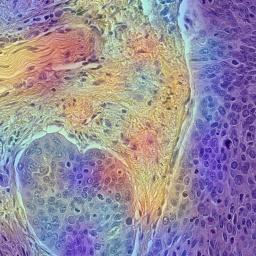

Image : C13_B241_S11_1.jpeg | Classe prédite : 2 | Classe réelle : 2


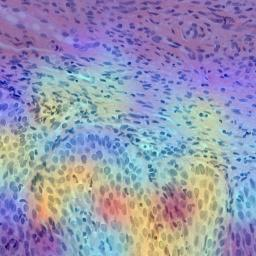

Image : C13_B231_S11_0.jpeg | Classe prédite : 2 | Classe réelle : 2


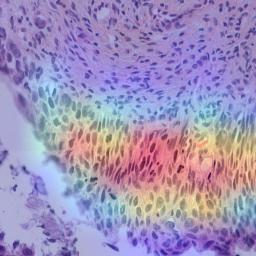

Image : C13_B231_S11_3.jpeg | Classe prédite : 2 | Classe réelle : 2


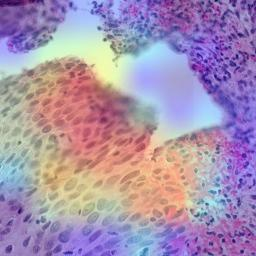

Image : C13_B225_S11_2.jpeg | Classe prédite : 2 | Classe réelle : 2


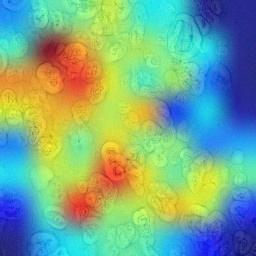

Image : C13_B216_S11_0.jpeg | Classe prédite : 1 | Classe réelle : 2


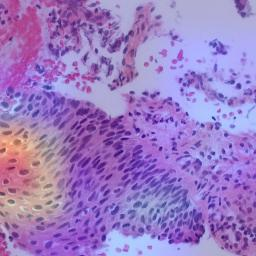

Image : C02_B269_S21_3.jpeg | Classe prédite : 3 | Classe réelle : 2


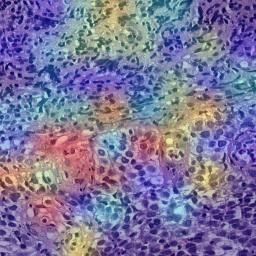

Image : C06_B033_S21_3.jpeg | Classe prédite : 2 | Classe réelle : 2


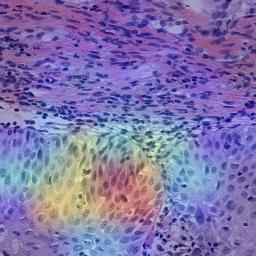

Image : C13_B226_S11_0.jpeg | Classe prédite : 0 | Classe réelle : 0


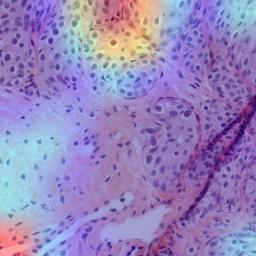

Image : C13_B226_S11_7.jpeg | Classe prédite : 1 | Classe réelle : 1


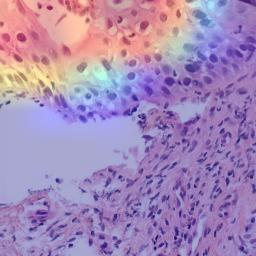

Image : C13_B220_S11_1.jpeg | Classe prédite : 1 | Classe réelle : 1


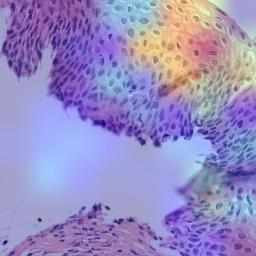

Image : C13_B220_S11_4.jpeg | Classe prédite : 1 | Classe réelle : 1


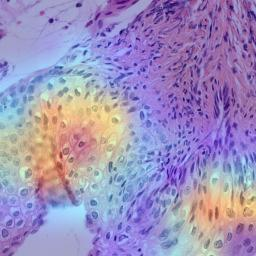

Image : C13_B219_S11_3.jpeg | Classe prédite : 1 | Classe réelle : 1


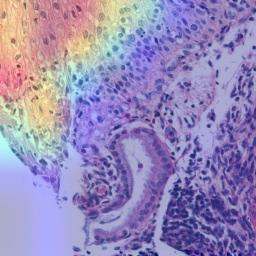

Image : C02_B265_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


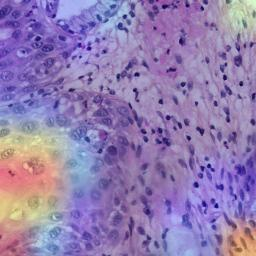

Image : C06_B043_S21_4.jpeg | Classe prédite : 1 | Classe réelle : 1


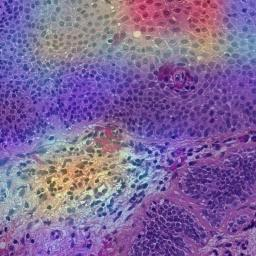

Image : C06_B042_S21_5.jpeg | Classe prédite : 1 | Classe réelle : 1


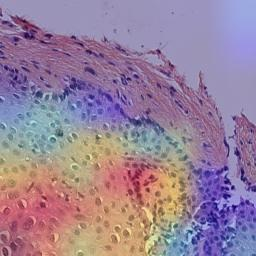

Image : C06_B031_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 1


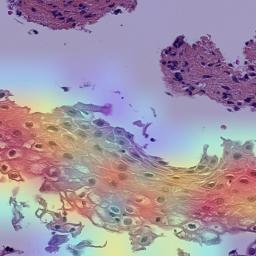

Image : C06_B021_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


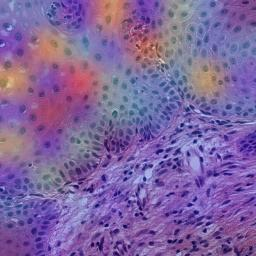

Image : C06_B021_S21_4.jpeg | Classe prédite : 0 | Classe réelle : 0


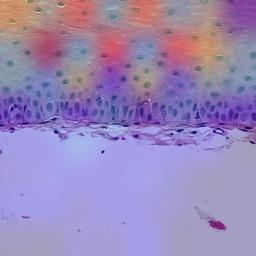

Image : C06_B045_S21_1.jpeg | Classe prédite : 1 | Classe réelle : 0


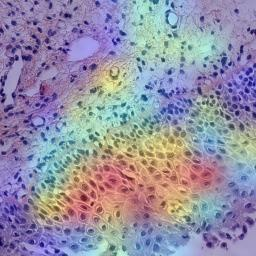

Image : C06_B032_S21_0.jpeg | Classe prédite : 0 | Classe réelle : 0


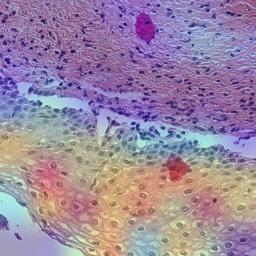

Image : C01_B110_S01_0.jpeg | Classe prédite : 2 | Classe réelle : 0


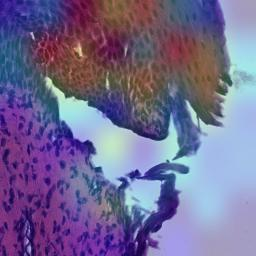

Image : C01_B110_S01_1.jpeg | Classe prédite : 0 | Classe réelle : 0


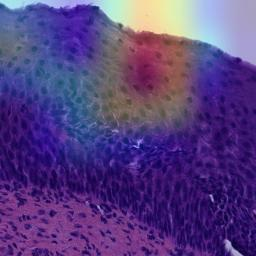

Image : C12_B174_S12_0.jpeg | Classe prédite : 1 | Classe réelle : 1


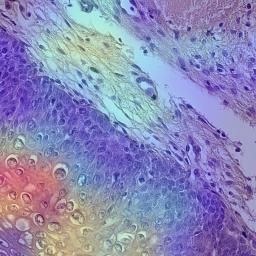

Image : C12_B381_S12_4.jpeg | Classe prédite : 1 | Classe réelle : 1


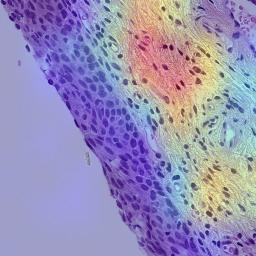

Image : C12_B472_S12_1.jpeg | Classe prédite : 1 | Classe réelle : 0


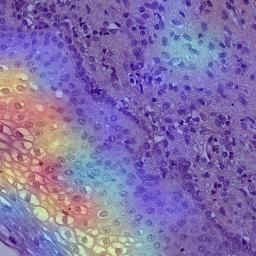

Image : C12_B041_S12_2.jpeg | Classe prédite : 1 | Classe réelle : 0


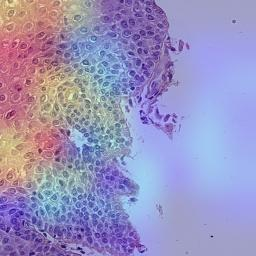

Image : C12_B478_S12_2.jpeg | Classe prédite : 0 | Classe réelle : 0


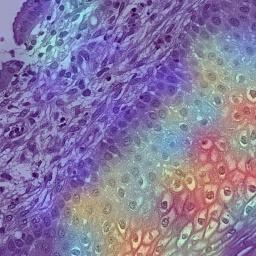

Image : C12_B491_S12_0.jpeg | Classe prédite : 0 | Classe réelle : 0


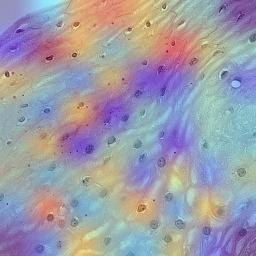

In [ ]:
for i, (filename, y_true_tmp, y_pred_tmp) in enumerate(list(zip(test_generator.filenames, test_generator.classes, y_pred))):
  img_array = preprocess_input(get_img_array(filename, size=(256, 256)))
  model.layers[-1].activation = None
  preds = model.predict(img_array)
  print(f"Image : {filename.split('/')[-1]} | Classe prédite : {y_pred_tmp} | Classe réelle : {y_true_tmp}")
  heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
  save_and_display_gradcam(filename, heatmap, cam_path=join(FOLDER_MODELS,'Gradcam/gradcam_'+filename.split('/')[-1]))